In [ ]:
# -------------------------------------- все импорты -------------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import psutil
from tqdm.auto import tqdm
from ast import literal_eval
from dateutil.relativedelta import relativedelta
import seaborn as sns

import requests
from bs4 import BeautifulSoup
import re
import pickle


import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
from gensim.utils import simple_preprocess
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from gensim.models.coherencemodel import CoherenceModel



nltk.download('wordnet')
nltk.download('stopwords')

# ------------------------------------- все константы ------------------------------------
ORIGINAL_FILE_PATH_JSON = "./data/arxiv-metadata-oai-snapshot.json"
CSV_FILE_PATH = "./data/arxiv_metadata.csv"
RANDOM_STATE = 8092025 

# ----------------------------------- настройки ------------------------------------------
import warnings
warnings.filterwarnings('ignore')

# ------------------------------------- функции ------------------------------------------

def check_nan(df):
    missing_values = df.isna().mean() * 100
    missing_df = pd.DataFrame(missing_values, columns=['missing_percent'])
    # выберем только кольнки с пропуском
    missing_df = missing_df[missing_df['missing_percent'] > 0].sort_values(by='missing_percent', ascending=False)
    display(missing_df.style.background_gradient('BuPu').format('{:.2f}%'))

[nltk_data] Downloading package wordnet to
[nltk_data]     /home/fedorov_ov/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/fedorov_ov/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# замерим показатели перед анализом
# все хорошо, но исходный файл тяжеловат (спасибо за предоставленный сервер лаборатории СБМ Роспотребнадзора)
file_size = os.path.getsize(ORIGINAL_FILE_PATH_JSON)
ram = psutil.virtual_memory()
disk = psutil.disk_usage('/')
print(f"Размер исследуемого файла: {file_size / (1024**3):.2f} GB")
print(f"ОЗУ: {ram.total/ (1024**3):.2f} GB")
print(f"Процент использования ОЗУ: {ram.percent}%")
print(f"Всего места на SSD: {disk.total/ (1024**3):.2f} GB")
print(f"Процент использования жесткого диска: {disk.percent}%")

# + для красивого прогресс-бара
with open(ORIGINAL_FILE_PATH_JSON, 'r', encoding='utf-8') as f:
    total_lines = sum(1 for line in f)
print(f"Всего строк в файле: {total_lines}")

Размер исследуемого файла: 4.50 GB
ОЗУ: 1510.52 GB
Процент использования ОЗУ: 1.8%
Всего места на SSD: 877.61 GB
Процент использования жесткого диска: 50.8%
Всего строк в файле: 2818564


In [3]:
# # имеем привычку читать файлы по 1 строке
# # но параметры сервера СБМ позволяют делать все, что хочешь
# data_json = []
# with open(ORIGINAL_FILE_PATH_JSON, 'r', encoding='utf-8') as file:
#     for line in tqdm(file, total=total_lines, desc="💤💤💤"):
#         data_json.append(json.loads(line)) # по 1 строке

In [4]:
# df = pd.DataFrame(data_json)
# # сохраняем файл, чтобы при перезагрузке ядра не приходилось заново проводить расчеты 
# df.to_csv(CSV_FILE_PATH, index=False) # и еще там списки в колонках (duplicated не работает с изменяемым типом данных)

In [5]:
# повторно будет без дубликатов выгружаться (10 штук дубликатов в исходном наборе данных)
df = pd.read_csv(CSV_FILE_PATH) # заново выгрузим файл, будет работать
display(df[df.duplicated(keep=False)]) # выведем дубликаты вместе с первым вхождением
print("Всего дубликатов в исходных данных (взятых с kaggle): ", len(df[df.duplicated()]))

,id,submitter,authors,title,comments,journal-ref,doi,report-no,categories,license,abstract,versions,update_date,authors_parsed


Всего дубликатов в исходных данных (взятых с kaggle):  0


In [6]:
# """
#     Удаляем ЯВНЫЕ дубликаты в исходном наборе
# """
# df.drop_duplicates(inplace=True)
# df.reset_index(drop=True, inplace=True)

In [7]:
# display(df[df.duplicated(keep=False)])

In [8]:
# # сохраняем файл, чтобы при перезагрузке ядра не приходилось заново проводить расчеты 
# df.to_csv(CSV_FILE_PATH, index=False)

-------------

# Первый взгляд на исходные данные

In [9]:
# df = pd.read_csv(CSV_FILE_PATH)
df.head()

,id,submitter,authors,title,comments,journal-ref,doi,report-no,categories,license,abstract,versions,update_date,authors_parsed
0,704.0001,Pavel Nadolsky,"C. Bal\'azs, E. L. Berger, P. M. Nadolsky, C.-...",Calculation of prompt diphoton production cros...,"37 pages, 15 figures; published version","Phys.Rev.D76:013009,2007",10.1103/PhysRevD.76.013009,ANL-HEP-PR-07-12,hep-ph,NaN,A fully differential calculation in perturba...,"[{'version': 'v1', 'created': 'Mon, 2 Apr 2007...",2008-11-26,"[['Balázs', 'C.', ''], ['Berger', 'E. L.', '']..."
1,704.0002,Louis Theran,Ileana Streinu and Louis Theran,Sparsity-certifying Graph Decompositions,To appear in Graphs and Combinatorics,NaN,NaN,NaN,math.CO cs.CG,http://arxiv.org/licenses/nonexclusive-distrib...,"We describe a new algorithm, the $(k,\ell)$-...","[{'version': 'v1', 'created': 'Sat, 31 Mar 200...",2008-12-13,"[['Streinu', 'Ileana', ''], ['Theran', 'Louis'..."
2,704.0003,Hongjun Pan,Hongjun Pan,The evolution of the Earth-Moon system based o...,"23 pages, 3 figures",NaN,NaN,NaN,physics.gen-ph,NaN,The evolution of Earth-Moon system is descri...,"[{'version': 'v1', 'created': 'Sun, 1 Apr 2007...",2008-01-13,"[['Pan', 'Hongjun', '']]"
3,704.0004,David Callan,David Callan,A determinant of Stirling cycle numbers counts...,11 pages,NaN,NaN,NaN,math.CO,NaN,We show that a determinant of Stirling cycle...,"[{'version': 'v1', 'created': 'Sat, 31 Mar 200...",2007-05-23,"[['Callan', 'David', '']]"
4,704.0005,Alberto Torchinsky,Wael Abu-Shammala and Alberto Torchinsky,From dyadic $\Lambda_{\alpha}$ to $\Lambda_{\a...,NaN,"Illinois J. Math. 52 (2008) no.2, 681-689",NaN,NaN,math.CA math.FA,NaN,In this paper we show how to compute the $\L...,"[{'version': 'v1', 'created': 'Mon, 2 Apr 2007...",2013-10-15,"[['Abu-Shammala', 'Wael', ''], ['Torchinsky', ..."


In [10]:
# можно перевети тип объект в другой тип и уменьшить объем памяти
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2818554 entries, 0 to 2818553
Data columns (total 14 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   id              object
 1   submitter       object
 2   authors         object
 3   title           object
 4   comments        object
 5   journal-ref     object
 6   doi             object
 7   report-no       object
 8   categories      object
 9   license         object
 10  abstract        object
 11  versions        object
 12  update_date     object
 13  authors_parsed  object
dtypes: object(14)
memory usage: 301.1+ MB


In [11]:
csv_size = os.path.getsize(CSV_FILE_PATH)
print(f"Размер файла в csv формате: {csv_size / (1024**3):.2f} GB")
print(f"Абсолютные величины: при переводе файла из формате json в csv, размер данных сократился на {(file_size - csv_size) / (1024**3):.2f} GB")
# относительные величины приоритетнее абсолютных
print(f"Относительные величины: размер файла сократился на {(((file_size - csv_size) / file_size) * 100):.2f}% ")

Размер файла в csv формате: 4.04 GB
Абсолютные величины: при переводе файла из формате json в csv, размер данных сократился на 0.46 GB
Относительные величины: размер файла сократился на 10.15% 


# Пропуски

In [12]:
""""
    Присуствуют пропуски в неинформативных колонках для задачи детектирования трендов. 
"""
check_nan(df)

,missing_percent
report-no,93.37%
journal-ref,67.84%
doi,55.34%
comments,26.51%
license,16.06%
submitter,0.54%


------



# Подготовка данных к анализу данных

> Стоит отметить, что названия колонок интуитивно понятны (их не нужно переименовывать). Для данной задачи интересны следующие колонки:

    `id` - ArXiv ID (можно использовать для доступа к статье)
    `title` - Название статьи
    `categories` - Категории/теги в системе ArXiv
    `abstract` -  Аннотация статьи
    `versions` - История версий (можно извлечь дату выпуска журнала). Похожая колонка `update_date` несет в себе дату обновления, это могут быть незначительные изменения, которые не влияют на суть статьи\журнала. Поэтому `update_date` не учитываем

In [13]:
print(f"Всего данных: {len(df)}")
trend_detection = df[["id", "title", "categories", "abstract", "versions"]]

Всего данных: 2818554


In [14]:
"""
Присутсвуют дубликаты. Видимо, те самые неинформативные колонки дополняли статью какими-то новыми признаками, 
что и делало статьи уникальными (например, какие-то комментарии).
"""
# 13 неявных дубликатов
print("Количество дубликатов: ", len(trend_detection[trend_detection.duplicated()]))
display(trend_detection[trend_detection.duplicated(keep=False)]) # выведем все вхождения

Количество дубликатов:  13


,id,title,categories,abstract,versions
2700634,math-ph/0002045,The Standard Model - the Commutative Case: Spi...,math-ph math.DG math.MP math.OA math.SG,The present paper is a short survey on the m...,"[{'version': 'v1', 'created': 'Wed, 23 Feb 200..."
2700824,math-ph/0007036,Anyons and the elliptic Calogero-Sutherland model,math-ph hep-th math.MP nlin.SI,We obtain a second quantization of the ellip...,"[{'version': 'v1', 'created': 'Thu, 27 Jul 200..."
2701713,math-ph/0203043,Magnetic monopoles and Lorentz force,math-ph math.MP,The formulation of a generalized classical e...,"[{'version': 'v1', 'created': 'Thu, 21 Mar 200..."
2703407,math-ph/0406061,Remarkable identities related to the (quantum)...,math-ph hep-th math.MP nlin.SI,We present further remarkable functional ide...,"[{'version': 'v1', 'created': 'Thu, 24 Jun 200..."
2704591,math-ph/0510046,"Singular factorizations, self-adjoint extensio...",math-ph math.MP,We study self-adjoint operators defined by f...,"[{'version': 'v1', 'created': 'Wed, 12 Oct 200..."
2704659,math-ph/0511015,A method to derive explicit formulas for an el...,math-ph math.MP,We review a method providing explicit formul...,"[{'version': 'v1', 'created': 'Fri, 4 Nov 2005..."
2704755,math-ph/0512019,Confined One Dimensional Harmonic Oscillator a...,math-ph hep-th math.MP quant-ph,The one-dimensional harmonic oscillator in a...,"[{'version': 'v1', 'created': 'Wed, 7 Dec 2005..."
2705188,math-ph/0605066,Zeros of sections of exponential sums,math-ph math.CA math.MP,We derive the large $n$ asymptotics of zeros...,"[{'version': 'v1', 'created': 'Wed, 24 May 200..."
2705204,math-ph/0606001,Existence of Atoms and Molecules in the Mean-F...,math-ph math.MP,The Bogoliubov-Dirac-Fock (BDF) model is the...,"[{'version': 'v1', 'created': 'Wed, 31 May 200..."
2705244,math-ph/0606041,A two dimensional analogue of the Luttinger model,math-ph cond-mat.str-el math.MP,"We present a fermion model that is, as we su...","[{'version': 'v1', 'created': 'Sat, 17 Jun 200..."


In [15]:
duplicates = trend_detection[trend_detection.duplicated()]
duplicate_ids = duplicates['id'].tolist()
display(duplicate_ids)
print("Количество дубликатов (после удаление неинформативных колонок): ", len(duplicate_ids))

['math-ph/0702049',
 'math-ph/0512019',
 'math-ph/0203043',
 'math-ph/0606001',
 'math-ph/0007036',
 'math-ph/0406061',
 'math-ph/0510046',
 'math-ph/0511015',
 'math-ph/0606041',
 'math-ph/0703090',
 'math-ph/0611044',
 'math-ph/0605066',
 'math-ph/0002045']

Количество дубликатов (после удаление неинформативных колонок):  13


In [16]:
"""
Сравнение id с оригинальным набором данных (в которых есть доп. информация).
Так как дубликатов не так много, то можно их посмотреть "на глаз".
"""
print("Полная информация о дубликатах из исходного DataFrame:")
display(df[df['id'].isin(duplicate_ids)].sort_values(by='id'))

Полная информация о дубликатах из исходного DataFrame:


,id,submitter,authors,title,comments,journal-ref,doi,report-no,categories,license,abstract,versions,update_date,authors_parsed
2700634,math-ph/0002045,Michael Frank,Michael Frank (Leipzig),The Standard Model - the Commutative Case: Spi...,"19 pages, LaTeX2e","Lect. Notes Physics 596(2002), 21-39",NaN,NaN,math-ph math.DG math.MP math.OA math.SG,NaN,The present paper is a short survey on the m...,"[{'version': 'v1', 'created': 'Wed, 23 Feb 200...",2007-05-23,"[['Frank', 'Michael', '', 'Leipzig']]"
2755449,math-ph/0002045,Michael Frank,Michael Frank (Leipzig),The Standard Model - the Commutative Case: Spi...,"19 pages, LaTeX2e","Lect. Notes Physics 596(2002), 21-39",10.1007/3-540-46082-9_3,NaN,math-ph math.DG math.MP math.OA math.SG,NaN,The present paper is a short survey on the m...,"[{'version': 'v1', 'created': 'Wed, 23 Feb 200...",2025-05-08,"[['Frank', 'Michael', '', 'Leipzig']]"
2700824,math-ph/0007036,Langmann Edwin,Edwin Langmann,Anyons and the elliptic Calogero-Sutherland model,13 pages; title changed; details added and som...,Lett.Math.Phys. 54 (2000) 279-289,NaN,NaN,math-ph hep-th math.MP nlin.SI,NaN,We obtain a second quantization of the ellip...,"[{'version': 'v1', 'created': 'Thu, 27 Jul 200...",2007-05-23,"[['Langmann', 'Edwin', '']]"
2742956,math-ph/0007036,Langmann Edwin,Edwin Langmann,Anyons and the elliptic Calogero-Sutherland model,13 pages; title changed; details added and som...,"Lett. Math. Phys. 54, 279-289 (2000)",10.1023/A:1010961107811,NaN,math-ph hep-th math.MP nlin.SI,NaN,We obtain a second quantization of the ellip...,"[{'version': 'v1', 'created': 'Thu, 27 Jul 200...",2025-01-30,"[['Langmann', 'Edwin', '']]"
2701713,math-ph/0203043,Frederic Moulin,F.Moulin,Magnetic monopoles and Lorentz force,12 pages,"Nuovo Cim.B116:869-877,2001",NaN,NaN,math-ph math.MP,NaN,The formulation of a generalized classical e...,"[{'version': 'v1', 'created': 'Thu, 21 Mar 200...",2010-11-11,"[['Moulin', 'F.', '']]"
2739972,math-ph/0203043,Frederic Moulin,F.Moulin,Magnetic monopoles and Lorentz force,12 pages,"Nuovo Cim.B116:869-877,2001",NaN,NaN,math-ph math.MP,NaN,The formulation of a generalized classical e...,"[{'version': 'v1', 'created': 'Thu, 21 Mar 200...",2024-09-26,"[['Moulin', 'F.', '']]"
2703407,math-ph/0406061,Langmann Edwin,Edwin Langmann,Remarkable identities related to the (quantum)...,"21 pages, v2: title changed, otherwise only mi...",NaN,NaN,NaN,math-ph hep-th math.MP nlin.SI,NaN,We present further remarkable functional ide...,"[{'version': 'v1', 'created': 'Thu, 24 Jun 200...",2007-05-23,"[['Langmann', 'Edwin', '']]"
2742957,math-ph/0406061,Langmann Edwin,Edwin Langmann,Remarkable identities related to the (quantum)...,"21 pages, v2: title changed, otherwise only mi...","J. Math. Phys. 47, 022101 (2006)",10.1063/1.2167807,NaN,math-ph hep-th math.MP nlin.SI,NaN,We present further remarkable functional ide...,"[{'version': 'v1', 'created': 'Thu, 24 Jun 200...",2025-01-30,"[['Langmann', 'Edwin', '']]"
2704591,math-ph/0510046,Langmann Edwin,"Edwin Langmann, Ari Laptev, Cornelius Paufler","Singular factorizations, self-adjoint extensio...","17 pages, LaTex",NaN,10.1088/0305-4470/39/5/004,NaN,math-ph math.MP,NaN,We study self-adjoint operators defined by f...,"[{'version': 'v1', 'created': 'Wed, 12 Oct 200...",2009-11-11,"[['Langmann', 'Edwin', ''], ['Laptev', 'Ari', ..."
2742958,math-ph/0510046,Langmann Edwin,"Edwin Langmann, Ari Laptev, Cornelius Paufler","Singular factorizations, self-adjoint extensio...","17 pages, LaTex","J. Phys. A: Math. Gen. 39, 1057 (2006)",10.1088/0305-4470/39/5/004,NaN,math-ph math.MP,NaN,We study self-adjoint operators defined by f...,"[{'version': 'v1', 'created': 'Wed, 12 Oct 200...",2025-01-30,"[['Langmann', 'Edwin', ''], ['Laptev', 'Ari', ..."


In [17]:
df_doi = df.drop(columns=["doi", "update_date"]) # update_date нужно удалить, т.к она меняется вместе с доб. doi
display(df_doi[df_doi.duplicated(keep=False)].sort_values(by="id")) # Выведем все, вместе с первмыи вхождениями
print("Количество дубликатов из-за doi (и update_date + в теории может еще могут быть признаки): ", len(df_doi[df_doi.duplicated()]))

,id,submitter,authors,title,comments,journal-ref,report-no,categories,license,abstract,versions,authors_parsed
2700634,math-ph/0002045,Michael Frank,Michael Frank (Leipzig),The Standard Model - the Commutative Case: Spi...,"19 pages, LaTeX2e","Lect. Notes Physics 596(2002), 21-39",NaN,math-ph math.DG math.MP math.OA math.SG,NaN,The present paper is a short survey on the m...,"[{'version': 'v1', 'created': 'Wed, 23 Feb 200...","[['Frank', 'Michael', '', 'Leipzig']]"
2755449,math-ph/0002045,Michael Frank,Michael Frank (Leipzig),The Standard Model - the Commutative Case: Spi...,"19 pages, LaTeX2e","Lect. Notes Physics 596(2002), 21-39",NaN,math-ph math.DG math.MP math.OA math.SG,NaN,The present paper is a short survey on the m...,"[{'version': 'v1', 'created': 'Wed, 23 Feb 200...","[['Frank', 'Michael', '', 'Leipzig']]"
2701713,math-ph/0203043,Frederic Moulin,F.Moulin,Magnetic monopoles and Lorentz force,12 pages,"Nuovo Cim.B116:869-877,2001",NaN,math-ph math.MP,NaN,The formulation of a generalized classical e...,"[{'version': 'v1', 'created': 'Thu, 21 Mar 200...","[['Moulin', 'F.', '']]"
2739972,math-ph/0203043,Frederic Moulin,F.Moulin,Magnetic monopoles and Lorentz force,12 pages,"Nuovo Cim.B116:869-877,2001",NaN,math-ph math.MP,NaN,The formulation of a generalized classical e...,"[{'version': 'v1', 'created': 'Thu, 21 Mar 200...","[['Moulin', 'F.', '']]"
2706038,math-ph/0703090,"Martin Halln\""as","Martin Halln\""as and Edwin Langmann",A unified construction of generalised classica...,NaN,Constr. Approx. (2010) 31: 309-342,NaN,math-ph math.MP,http://arxiv.org/licenses/nonexclusive-distrib...,In this paper we consider a large class of m...,"[{'version': 'v1', 'created': 'Fri, 30 Mar 200...","[['Hallnäs', 'Martin', ''], ['Langmann', 'Edwi..."
2742961,math-ph/0703090,"Martin Halln\""as","Martin Halln\""as and Edwin Langmann",A unified construction of generalised classica...,NaN,Constr. Approx. (2010) 31: 309-342,NaN,math-ph math.MP,http://arxiv.org/licenses/nonexclusive-distrib...,In this paper we consider a large class of m...,"[{'version': 'v1', 'created': 'Fri, 30 Mar 200...","[['Hallnäs', 'Martin', ''], ['Langmann', 'Edwi..."


Количество дубликатов из-за doi (и update_date + в теории может еще могут быть признаки):  3


In [ ]:
"""
Самое главное, что важные признакие title и abstract не менялись. Так как дальше задача будет зависеть именно от этих признаков. 
Менялись только неинформативные колонки
"""
duplicates_df = df[df['id'].isin(duplicate_ids)].sort_values(by='id')
target_columns = ["id", "title", "abstract"]
other_columns = [col for col in df.columns if col not in target_columns]

count = 1
title_diff_count = 0
abstract_diff_count = 0
other_diff_count = 0
full_duplicates_count = 0

for (title, abstract), group in duplicates_df.groupby(['title', 'abstract']):
    if len(group) > 1:
        group_ids = group['id'].tolist()
        full_data = df[df['id'].isin(group_ids)]
        
        titles_equal = full_data['title'].nunique() == 1
        abstracts_equal = full_data['abstract'].nunique() == 1
        
        other_diffs = []
        for col in other_columns:
            if full_data[col].nunique() > 1:
                other_diffs.append(col)
        
        print(f"\n{count}. Группа ID: {group_ids}")
        print(f"Title одинаковые: {titles_equal}")
        print(f"Abstract одинаковые: {abstracts_equal}")
        print(f"Различия в других колонках: {other_diffs if other_diffs else 'Нет'}")

        if not titles_equal:
            title_diff_count += 1
        if not abstracts_equal:
            abstract_diff_count += 1
        if other_diffs:
            other_diff_count += 1
        if titles_equal and abstracts_equal and not other_diffs:
            full_duplicates_count += 1
        
        count += 1
        print("-" * 80)

print('='*80)
print(f"Всего групп дубликатов: {count-1}")
print(f"Групп с разными title: {title_diff_count}")
print(f"Групп с разными abstract: {abstract_diff_count}")
print(f"Групп с различиями в других колонках: {other_diff_count}")
print(f"Групп полных дубликатов: {full_duplicates_count}")


1. Группа ID: ['math-ph/0511015', 'math-ph/0511015']
Title одинаковые: True
Abstract одинаковые: True
Различия в других колонках: ['update_date']
--------------------------------------------------------------------------------

2. Группа ID: ['math-ph/0606041', 'math-ph/0606041']
Title одинаковые: True
Abstract одинаковые: True
Различия в других колонках: ['update_date']
--------------------------------------------------------------------------------

3. Группа ID: ['math-ph/0703090', 'math-ph/0703090']
Title одинаковые: True
Abstract одинаковые: True
Различия в других колонках: ['update_date']
--------------------------------------------------------------------------------

4. Группа ID: ['math-ph/0007036', 'math-ph/0007036']
Title одинаковые: True
Abstract одинаковые: True
Различия в других колонках: ['journal-ref', 'update_date']
--------------------------------------------------------------------------------

5. Группа ID: ['math-ph/0512019', 'math-ph/0512019']
Title одинаковые: T

In [19]:
# Можно удалять 13 дубликатов, которые образованы из-за неинформативных признаков
trend_detection.drop_duplicates(inplace=True)
display(trend_detection[trend_detection.duplicated()])

,id,title,categories,abstract,versions


In [20]:
# Посмотрим на изменения версий ближе
"""
Первая публикация (v1) — это момент (точка отсчета), когда научная идея или результат 
впервые появляются в публичном пространстве. Остальные версии можно удалить.
"""
display(trend_detection["versions"][0])
print("Тип колонки с версиями: ", type(trend_detection["versions"][0]))

"[{'version': 'v1', 'created': 'Mon, 2 Apr 2007 19:18:42 GMT'}, {'version': 'v2', 'created': 'Tue, 24 Jul 2007 20:10:27 GMT'}]"

Тип колонки с версиями:  <class 'str'>


In [21]:
# def extract_data(version):
#     version_lst = literal_eval(version) # должен быть список словарей
#     # лучше сделать проверки через isinstance
#     v1_dict = version_lst[0] # берем первый словарь с первой версией v1
#     v1_data = v1_dict["created"]
#     return pd.to_datetime(v1_data, utc=True)

# tqdm.pandas(desc="🍀 Извлекаем дату в нужном формате 🍂")
# trend_detection["data"] = trend_detection["versions"].progress_apply(extract_data)
# # дату извлекли, колонку можно удалять
# trend_detection.drop("versions", axis=1, inplace=True)
# trend_detection.to_csv("./data/trend_detection.csv", index=False)

In [22]:
trend_detection = pd.read_csv("./data/trend_detection.csv")

In [23]:
trend_detection[trend_detection.duplicated()]

,id,title,categories,abstract,data


In [24]:
trend_detection.sample(5) # случайные 5 строк

,id,title,categories,abstract,data
1625677,2203.12815,Revisiting the Effects of Leakage on Dependenc...,cs.CL,Recent work by S{\o}gaard (2020) showed that...,2022-03-24 02:33:30+00:00
1839458,2305.06402,Analyzing Bias in Diffusion-based Face Generat...,cs.CV,Diffusion models are becoming increasingly p...,2023-05-10 18:22:31+00:00
2262846,2502.19855,$q$-Numerical Range of Operators in Semi-Hilbe...,math.FA,This article presents a generalization of th...,2025-02-27 07:58:56+00:00
1856441,2306.03293,Towards Fairness in Personalized Ads Using Imp...,cs.AI cs.CY,Variances in ad impression outcomes across d...,2023-06-05 22:38:21+00:00
1280252,2005.00457,Twisting finite-dimensional modules for the $q...,math.QA,The $q$-Onsager algebra $\mathcal O_q$ is de...,2020-05-01 15:51:24+00:00


In [25]:
display(trend_detection.head())
print(f"Всего статей: {len(trend_detection)}")
print("Самая ранняя дата: ", trend_detection["data"].min())
print("Самая поздняя дата: ", trend_detection["data"].max())
# при выгрузке датафрейма формат данных может поменяться на другой формат
trend_detection['data'] = pd.to_datetime(trend_detection['data'])
delta = relativedelta(trend_detection["data"].max(), trend_detection["data"].min())
years = delta.years
months = delta.months
days = delta.days
# почти за 40 лет
print(f"Данные представлены за {years} лет, {months} месяцев и {days} дней")

,id,title,categories,abstract,data
0,704.0001,Calculation of prompt diphoton production cros...,hep-ph,A fully differential calculation in perturba...,2007-04-02 19:18:42+00:00
1,704.0002,Sparsity-certifying Graph Decompositions,math.CO cs.CG,"We describe a new algorithm, the $(k,\ell)$-...",2007-03-31 02:26:18+00:00
2,704.0003,The evolution of the Earth-Moon system based o...,physics.gen-ph,The evolution of Earth-Moon system is descri...,2007-04-01 20:46:54+00:00
3,704.0004,A determinant of Stirling cycle numbers counts...,math.CO,We show that a determinant of Stirling cycle...,2007-03-31 03:16:14+00:00
4,704.0005,From dyadic $\Lambda_{\alpha}$ to $\Lambda_{\a...,math.CA math.FA,In this paper we show how to compute the $\L...,2007-04-02 18:09:58+00:00


Всего статей: 2818541
Самая ранняя дата:  1986-04-25 15:39:49+00:00
Самая поздняя дата:  2025-08-28 17:59:59+00:00
Данные представлены за 39 лет, 4 месяцев и 3 дней


In [26]:
# пропуски отсуствуют, так как неинформативные колонки были удалены
check_nan(trend_detection)

,missing_percent


--------------------

# Анализ данных


--------


## Анализ всего временного промежутка

In [27]:
trend_detection['year'] = trend_detection['data'].dt.year
trend_detection_all_year = trend_detection['year'].value_counts().sort_index() # 2025 год включительно
trend_detection_current = trend_detection[trend_detection['year'] != 2025]['year'].value_counts().sort_index() # исключая 2025 год

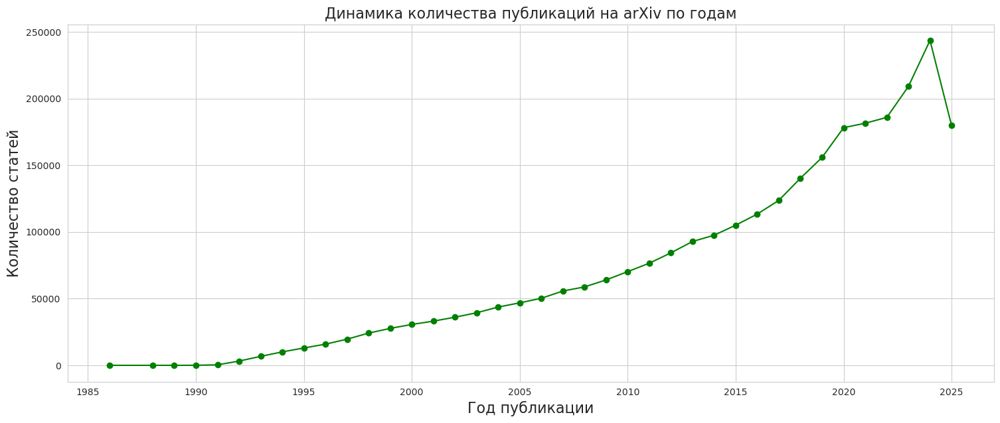

In [28]:
"""
Наблюдаем экспоненциальный рост количеству статей по годам. 
Количество статей в 2025 году уменьшилось по сравнению с предыдущим годом, но этому есть оправдание: 2025 год не закончился
"""
sns.set_style("whitegrid")
plt.figure(figsize=(18, 7))
trend_detection_all_year.plot(kind='line', marker='o', linestyle='-', color='g')
plt.title('Динамика количества публикаций на arXiv по годам', fontsize=16)
plt.xlabel('Год публикации', fontsize=16)
plt.ylabel('Количество статей', fontsize=16)
plt.grid(True)
# plt.yscale('log')
plt.show()

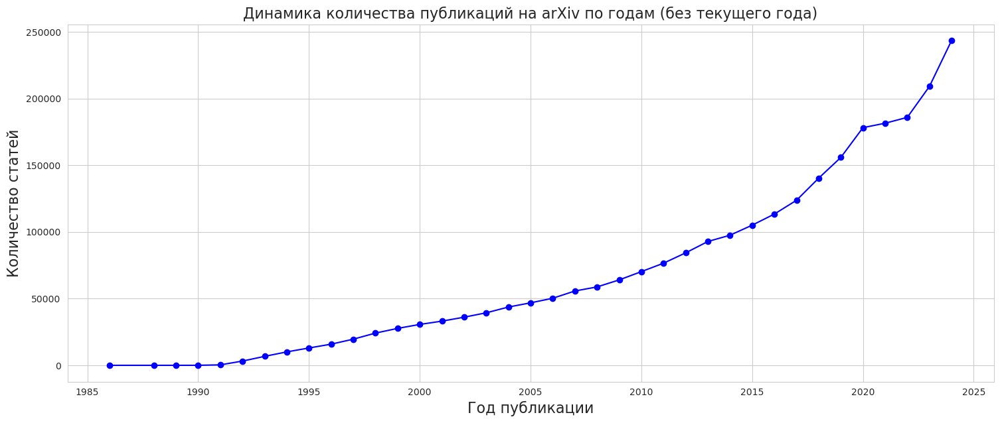

In [29]:
"""
Для того, чтобы не искажать результат, уберем 2025 год. То есть оставим только полные данные.
"""
sns.set_style("whitegrid")
plt.figure(figsize=(18, 7))
trend_detection_current.plot(kind='line', marker='o', linestyle='-', color='b')
plt.title('Динамика количества публикаций на arXiv по годам (без текущего года)', fontsize=16)
plt.xlabel('Год публикации', fontsize=16)
plt.ylabel('Количество статей', fontsize=16)
plt.grid(True)
plt.savefig("./pictures/dynamics_all_years.png", dpi=300, bbox_inches='tight')
plt.show()

In [30]:
year_stats = trend_detection.groupby('year').size()
count_2023 = year_stats.get(2023, 0)
count_2024 = year_stats.get(2024, 0)
growth = ((count_2024 - count_2023) / count_2023) * 100
print(f"2023: {count_2023} статей")
print(f"2024: {count_2024} статей")
print(f"Абсолютный прирост статей в 2024 году по сравнении с 2023: {count_2024 - count_2023} статей")
print(f"Относительный прирост: {growth:.2f}%")

2023: 209223 статей
2024: 243689 статей
Абсолютный прирост статей в 2024 году по сравнении с 2023: 34466 статей
Относительный прирост: 16.47%


In [31]:
trend_detection['data'] = pd.to_datetime(trend_detection['data'])
trend_detection['year_month'] = trend_detection['data'].dt.to_period('M')
monthly_counts = trend_detection.groupby('year_month').size()

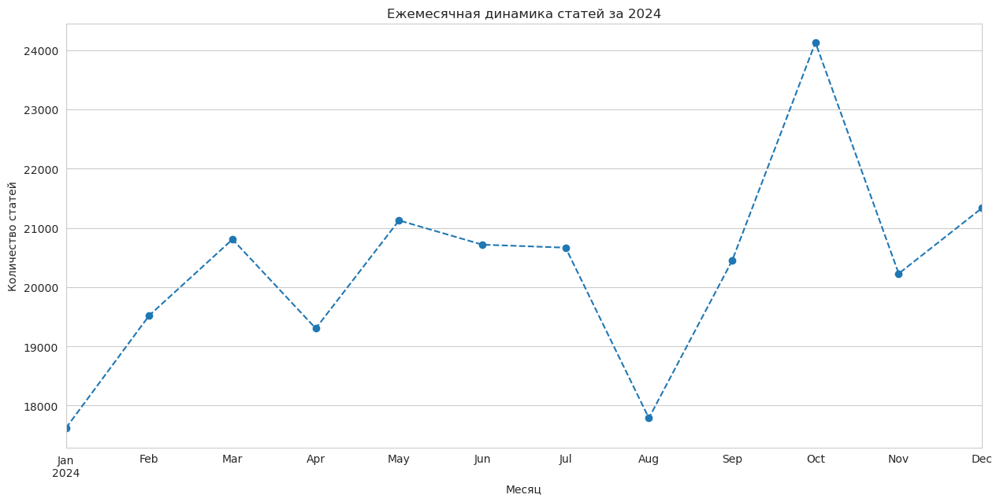

In [32]:
"""
В 2024 году ученые массово загружали свои работы на arXiv в октябре. И меньше всего в августе (все ушли в отпуск).
 Это согласуется с тем фактом, что большинство научных конференций также проводится в октябре-ноябре.
    * Лето -  время, свободное от преподавания (все погружаются в науку). А потом едут отдыхать :)
    * Сентябрь - новый учебный год. Все возвращаются из отпусков. Работа, проделанная летом, начинает оформляться в виде статей.
    * Октябрь. Летние исследования полностью обработаны, статьи написаны  и готовы к публикации.
"""

# можно посмотреть на динамику по месяцам (поиск сезонности)
# можно посмотреть сезонность по каждой категории :)
recent_monthly_counts = monthly_counts.loc['2024']
recent_monthly_counts.plot(
    figsize=(15, 7),
    title='Ежемесячная динамика статей за 2024',
    xlabel='Месяц',
    ylabel='Количество статей',
    grid=True,
    marker='o',
    linestyle='--'
)
plt.show()

------

## Расширение данных

> Для начала нужно произвести сбор дополнительной информации с оф. сайта

> Стоит отметить, что далее исходные данные будут делиться на 4 набора: 

    * исходный (весь временной промежуток)
    * набор данных без 2025 года, так как за этот год данные не собраны до конца. И это может исказить некоторые результаты.
    * актуальный: 2021-2024 год (за них информация считается полной)
    * отдельный набор с данными за 2025 год.

**Так как тренды выявляются на актуальных (и желательно полных) данных. То данные старше 2021 года будем считать неактуальными, а данные за 2025 актуальными, но не до конца полными. Но старая информация поможет выявить направление трендов с годами.**

In [33]:
"""
На сайте показано как расшифровывать таблицу (и можно посмотреть код страницы)
"""
# таблица сверстана не через table, через pandas ее не получится извлечь
url = requests.get('https://arxiv.org/category_taxonomy').text
soup = BeautifulSoup(url,'lxml')
# ищем <div id="category_taxonomy_list" class="large-data-list">
root = soup.find('div',{'id':'category_taxonomy_list'}) 
tags = root.find_all(["h2","h3","h4","p"], recursive=True)


# чтобы не путаться, назовем так, как на сайте
group_names = []
archive_names = []
archive_ids = []
category_names = []
category_ids = []
category_descriptions = []


for tag in tags:
    # <h2 class="accordion-head"> - категории
    if tag.name == "h2":
        group_name = tag.text   
        archive_id = tag.text
        archive_name = tag.text
    elif tag.name == "h3":
        raw = tag.text
        archive_id = re.sub(r"(.*)\((.*)\)",r"\2",raw)
        archive_name = re.sub(r"(.*)\((.*)\)",r"\1",raw)
    elif tag.name == "h4":
        raw = tag.text
        # print(raw)
        category_id = re.sub(r"(.*) \((.*)\)",r"\1",raw)
        category_name = re.sub(r"(.*) \((.*)\)",r"\2",raw)
    elif tag.name == "p":
        description = tag.text
        group_names.append(group_name) 
        archive_names.append(archive_name) # этот признак будет полезен для физики
        archive_ids.append(archive_id) # тоже для физики
        category_names.append(category_name)
        category_ids.append(category_id)
        category_descriptions.append(description)

category_taxonomy = pd.DataFrame({
    'group_name' : group_names,
    'archive_name' : archive_names,
    'archive_id' : archive_ids,
    'category_name' : category_names,
    'category_id' : category_ids,
    'category_description': category_descriptions
    
})

category_taxonomy.to_csv("./data/category_taxonomy.csv", index=False)

In [34]:
# category_taxonomy = pd.read_csv("./data/category_taxonomy.csv")
display(category_taxonomy.head())

,group_name,archive_name,archive_id,category_name,category_id,category_description
0,Computer Science,Computer Science,Computer Science,Artificial Intelligence,cs.AI,"Covers all areas of AI except Vision, Robotics..."
1,Computer Science,Computer Science,Computer Science,Hardware Architecture,cs.AR,Covers systems organization and hardware archi...
2,Computer Science,Computer Science,Computer Science,Computational Complexity,cs.CC,"Covers models of computation, complexity class..."
3,Computer Science,Computer Science,Computer Science,"Computational Engineering, Finance, and Science",cs.CE,Covers applications of computer science to the...
4,Computer Science,Computer Science,Computer Science,Computational Geometry,cs.CG,Roughly includes material in ACM Subject Class...


In [35]:
category_taxonomy[category_taxonomy.duplicated()] # дубликатов нет

,group_name,archive_name,archive_id,category_name,category_id,category_description


In [36]:
"""
df_arxiv: данные за весь временной промежуток
df_arxiv_current: данные за 2020-2024 года
df_arxiv_2025: данные за 2025 год
"""

trend_detection['categories_split'] = trend_detection['categories'].str.split()
# trend_detection.head()

# для каждой категории в списке создаем отдельную строку
# то есть, если у одной группы несколько категорий. например, 2: math.AC и cond-mat.dis-nn ,
# то результатом будут две строчки для каждой категории
trend_detection_expanded = trend_detection.explode('categories_split')
display(trend_detection_expanded.head())


df_arxiv = trend_detection_expanded.merge(
    category_taxonomy, 
    left_on='categories_split', 
    right_on='category_id',
    how='left'
)
df_arxiv = df_arxiv.reset_index(drop=True)
# display("Уникальные category_id", df_arxiv["categories_split"].unique())
original_category_ids = df_arxiv["categories_split"].unique()
# df_arxiv.head()
# df_arxiv = df_arxiv.drop('categories_split', axis=1) # пока не удаляем


# df_arxiv_current = df_arxiv.query('2020 <= year <= 2024').reset_index(drop=True)
# display(df_arxiv_current.head(3))
# df_arxiv_2025 = df_arxiv[df_arxiv['year'] == 2025].reset_index(drop=True)

,id,title,categories,abstract,data,year,year_month,categories_split
0,704.0001,Calculation of prompt diphoton production cros...,hep-ph,A fully differential calculation in perturba...,2007-04-02 19:18:42+00:00,2007,2007-04,hep-ph
1,704.0002,Sparsity-certifying Graph Decompositions,math.CO cs.CG,"We describe a new algorithm, the $(k,\ell)$-...",2007-03-31 02:26:18+00:00,2007,2007-03,math.CO
1,704.0002,Sparsity-certifying Graph Decompositions,math.CO cs.CG,"We describe a new algorithm, the $(k,\ell)$-...",2007-03-31 02:26:18+00:00,2007,2007-03,cs.CG
2,704.0003,The evolution of the Earth-Moon system based o...,physics.gen-ph,The evolution of Earth-Moon system is descri...,2007-04-01 20:46:54+00:00,2007,2007-04,physics.gen-ph
3,704.0004,A determinant of Stirling cycle numbers counts...,math.CO,We show that a determinant of Stirling cycle...,2007-03-31 03:16:14+00:00,2007,2007-03,math.CO


In [37]:
df_arxiv.head()

,id,title,categories,abstract,data,year,year_month,categories_split,group_name,archive_name,archive_id,category_name,category_id,category_description
0,704.0001,Calculation of prompt diphoton production cros...,hep-ph,A fully differential calculation in perturba...,2007-04-02 19:18:42+00:00,2007,2007-04,hep-ph,Physics,High Energy Physics - Phenomenology,hep-ph,High Energy Physics - Phenomenology,hep-ph,Theoretical particle physics and its interrela...
1,704.0002,Sparsity-certifying Graph Decompositions,math.CO cs.CG,"We describe a new algorithm, the $(k,\ell)$-...",2007-03-31 02:26:18+00:00,2007,2007-03,math.CO,Mathematics,Mathematics,Mathematics,Combinatorics,math.CO,"Discrete mathematics, graph theory, enumeratio..."
2,704.0002,Sparsity-certifying Graph Decompositions,math.CO cs.CG,"We describe a new algorithm, the $(k,\ell)$-...",2007-03-31 02:26:18+00:00,2007,2007-03,cs.CG,Computer Science,Computer Science,Computer Science,Computational Geometry,cs.CG,Roughly includes material in ACM Subject Class...
3,704.0003,The evolution of the Earth-Moon system based o...,physics.gen-ph,The evolution of Earth-Moon system is descri...,2007-04-01 20:46:54+00:00,2007,2007-04,physics.gen-ph,Physics,Physics,physics,General Physics,physics.gen-ph,Description coming soon
4,704.0004,A determinant of Stirling cycle numbers counts...,math.CO,We show that a determinant of Stirling cycle...,2007-03-31 03:16:14+00:00,2007,2007-03,math.CO,Mathematics,Mathematics,Mathematics,Combinatorics,math.CO,"Discrete mathematics, graph theory, enumeratio..."


In [38]:
df_arxiv[df_arxiv.duplicated()]

,id,title,categories,abstract,data,year,year_month,categories_split,group_name,archive_name,archive_id,category_name,category_id,category_description


In [39]:
print("Абсолютное значение пропусков в таблице: ", len(df_arxiv[df_arxiv.isnull().any(axis=1)]))
print("Всего значений в таблице: ", len(df_arxiv))
print("Обработка пропусков в % по каждому признаку")
check_nan(df_arxiv)

Абсолютное значение пропусков в таблице:  132202
Всего значений в таблице:  4848598
Обработка пропусков в % по каждому признаку


,missing_percent
group_name,2.73%
archive_name,2.73%
archive_id,2.73%
category_name,2.73%
category_id,2.73%
category_description,2.73%


In [40]:
# сравним уникальные category_id из исходного датасета с category_id с сайта (более современные category_id)

# category_ids # сайт
# original_category_ids # из исходных данных

""""
 В исходном наборе данных присутсвуют устаревшие id категорий (которых нет на сайте). Поэтому образуются пропуски.
 Новые id категории имеют названия через точку "."
"""
print("Только списке с сайта (нет в исходных):", list(set(category_ids) - set(original_category_ids)))
print("Только в списке с исходными данными:", list(set(original_category_ids) - set(category_ids)))
print("Перечение (общие) id категорий", list(set(category_ids).intersection(set(original_category_ids))))

Только списке с сайта (нет в исходных): []
Только в списке с исходными данными: ['q-alg', 'solv-int', 'cond-mat', 'astro-ph', 'cmp-lg', 'bayes-an', 'chem-ph', 'atom-ph', 'acc-phys', 'adap-org', 'supr-con', 'patt-sol', 'alg-geom', 'chao-dyn', 'comp-gas', 'plasm-ph', 'funct-an', 'mtrl-th', 'dg-ga', 'ao-sci', 'q-bio']
Перечение (общие) id категорий ['q-fin.PM', 'cs.MS', 'gr-qc', 'math.AC', 'eess.SY', 'physics.plasm-ph', 'econ.TH', 'stat.OT', 'cs.FL', 'math.CV', 'q-bio.QM', 'q-bio.TO', 'q-fin.MF', 'cs.CY', 'hep-ph', 'cs.DL', 'eess.AS', 'cs.MM', 'math.AP', 'physics.atm-clus', 'math.NA', 'physics.pop-ph', 'cs.NA', 'cs.NE', 'physics.hist-ph', 'math-ph', 'nlin.PS', 'nlin.CG', 'q-fin.PR', 'cs.CE', 'astro-ph.HE', 'cond-mat.mtrl-sci', 'math.AG', 'math.NT', 'nlin.AO', 'math.GR', 'math.PR', 'physics.soc-ph', 'cs.DC', 'physics.atom-ph', 'q-bio.PE', 'math.QA', 'math.MP', 'cs.NI', 'q-fin.GN', 'physics.ao-ph', 'math.DS', 'astro-ph.SR', 'cs.CC', 'physics.ed-ph', 'q-bio.MN', 'econ.EM', 'cs.GT', 'cs.IR', 

In [41]:
# only_website = set(category_ids) - set(original_category_ids)
# only_original = set(original_category_ids) - set(category_ids)
# intersection = set(category_ids).intersection(set(original_category_ids))

new_ids_with_dots = [cat_id for cat_id in category_ids if '.' in str(cat_id)]
old_ids_without_dots = [cat_id for cat_id in original_category_ids if '.' not in str(cat_id)]


print("Проверка гипотезы о том, что все новые названия id категорий имеют точки:")
print("=" * 150)

if new_ids_with_dots:
    new_dots_percent = len(new_ids_with_dots) / len(category_ids) * 100
    print(f"id с точками в новых данных: {new_dots_percent:.1f}%")
    print("Примеры новых id категорий без точек: ", [cat_id for cat_id in category_ids if '.' not in str(cat_id)])
    print("Пример новых id категорий с точками: ", new_ids_with_dots)
    
print("-" * 150)
if old_ids_without_dots:
    old_no_dots_percent = len(old_ids_without_dots) / len(original_category_ids) * 100
    print(f"старых id без точек: {old_no_dots_percent:.1f}%")
    print("Пример старых id с точками: ", [cat_id for cat_id in original_category_ids if '.' in str(cat_id)])
    print("Пример старых id без точек: ", old_ids_without_dots)

print("=" * 150)
print("Гипотеза провалена")

Проверка гипотезы о том, что все новые названия id категорий имеют точки:
id с точками в новых данных: 94.2%
Примеры новых id категорий без точек:  ['gr-qc', 'hep-ex', 'hep-lat', 'hep-ph', 'hep-th', 'math-ph', 'nucl-ex', 'nucl-th', 'quant-ph']
Пример новых id категорий с точками:  ['cs.AI', 'cs.AR', 'cs.CC', 'cs.CE', 'cs.CG', 'cs.CL', 'cs.CR', 'cs.CV', 'cs.CY', 'cs.DB', 'cs.DC', 'cs.DL', 'cs.DM', 'cs.DS', 'cs.ET', 'cs.FL', 'cs.GL', 'cs.GR', 'cs.GT', 'cs.HC', 'cs.IR', 'cs.IT', 'cs.LG', 'cs.LO', 'cs.MA', 'cs.MM', 'cs.MS', 'cs.NA', 'cs.NE', 'cs.NI', 'cs.OH', 'cs.OS', 'cs.PF', 'cs.PL', 'cs.RO', 'cs.SC', 'cs.SD', 'cs.SE', 'cs.SI', 'cs.SY', 'econ.EM', 'econ.GN', 'econ.TH', 'eess.AS', 'eess.IV', 'eess.SP', 'eess.SY', 'math.AC', 'math.AG', 'math.AP', 'math.AT', 'math.CA', 'math.CO', 'math.CT', 'math.CV', 'math.DG', 'math.DS', 'math.FA', 'math.GM', 'math.GN', 'math.GR', 'math.GT', 'math.HO', 'math.IT', 'math.KT', 'math.LO', 'math.MG', 'math.MP', 'math.NA', 'math.NT', 'math.OA', 'math.OC', 'math

In [42]:
"""
Классификация у физики самая сложная :)
"""
print("Проверка гипотезы о том, что все новые id категорий без точек принадлежат к разделу физики")
print("=" * 100)
categories_without_dots = [cat_id for cat_id in category_ids if '.' not in str(cat_id)]
print("Новые категории без точек: ", categories_without_dots)
print(f"Всего новых категорий без точек: {len(categories_without_dots)}")

physics_categories = df_arxiv[df_arxiv['category_id'].isin(categories_without_dots)]

all_physics = all(physics_categories['group_name'] == 'Physics')
print(f"Все категории без точек относятся к Physics: {all_physics}")

Проверка гипотезы о том, что все новые id категорий без точек принадлежат к разделу физики
Новые категории без точек:  ['gr-qc', 'hep-ex', 'hep-lat', 'hep-ph', 'hep-th', 'math-ph', 'nucl-ex', 'nucl-th', 'quant-ph']
Всего новых категорий без точек: 9
Все категории без точек относятся к Physics: True


In [43]:
"""
в исходном наборе данных присуствуют старые названия id категорий
"""
# на глаз (их можно восстановить):
# atom-ph=physics.atom-ph
# chem-ph = physics.chem-ph
# plasm-ph=physics.plasm-ph
# supr-con=cond-mat.supr-con
nan_category_id = list(df_arxiv[df_arxiv.isnull().any(axis=1)]["categories_split"].unique())
display(df_arxiv[df_arxiv.isnull().any(axis=1)]["categories_split"].unique())
print("Пересечение id категорий с сайта и там, где есть пропуски", list(set(nan_category_id).intersection(set(category_ids))))

array(['astro-ph', 'acc-phys', 'adap-org', 'q-bio', 'cond-mat',
       'chao-dyn', 'patt-sol', 'dg-ga', 'solv-int', 'bayes-an',
       'comp-gas', 'alg-geom', 'funct-an', 'q-alg', 'ao-sci', 'atom-ph',
       'chem-ph', 'plasm-ph', 'mtrl-th', 'cmp-lg', 'supr-con'],
      dtype=object)

Пересечение id категорий с сайта и там, где есть пропуски []


In [44]:
# Можно попробовать восстановить id категорий. 
sorted(list(df_arxiv[df_arxiv.isnull().any(axis=1)]["year"].unique()))

[1991,
 1992,
 1993,
 1994,
 1995,
 1996,
 1997,
 1998,
 1999,
 2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2019]

In [45]:
""""
Видимо, arxiv в 2019 году перешел на новую классификацию :)
Но в 2019 году один раз кто-то ошибся.
"""

df_with_nulls = df_arxiv[df_arxiv.isnull().any(axis=1)]

nulls_by_year = df_with_nulls.groupby('year').size().reset_index(name='count_nulls')
nulls_by_year = nulls_by_year.sort_values('year')

print("Количество образовавшихся пропусков из-за несоответствия классификации")
display(nulls_by_year)

Количество образовавшихся пропусков из-за несоответствия классификации


,year,count_nulls
0,1991,3
1,1992,532
2,1993,1957
3,1994,3906
4,1995,6140
5,1996,7373
6,1997,7451
7,1998,7747
8,1999,8636
9,2000,8226


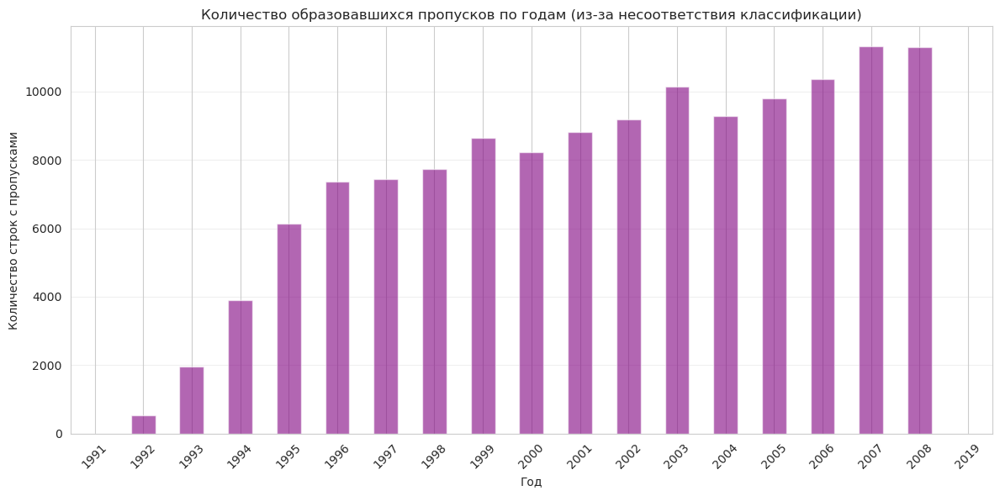

In [46]:
nulls_by_year = df_with_nulls.groupby('year').size().sort_index()

plt.figure(figsize=(12, 6))
nulls_by_year.plot(kind='bar', color='purple', alpha=0.6)
plt.title('Количество образовавшихся пропусков по годам (из-за несоответствия классификации)')
plt.xlabel('Год')
plt.ylabel('Количество строк с пропусками')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

In [47]:
"""
Анализ проводится на исходных расширенных данных.
Поэтому суммарное количество статей больше
"""
total_by_year = df_arxiv.groupby('year').size()
nulls_by_year = df_with_nulls.groupby('year').size()
percentage_nulls = (nulls_by_year / total_by_year * 100).fillna(0)
result_df = pd.DataFrame({
    'total_articles': total_by_year,
    'articles_with_nulls': nulls_by_year,
    'percentage_nulls': percentage_nulls.round(2)
}).sort_index()

print("Статистика пропусков по годам:")
result_df

Статистика пропусков по годам:


,total_articles,articles_with_nulls,percentage_nulls
year,,,
1986,2,NaN,0.00
1988,1,NaN,0.00
1989,10,NaN,0.00
1990,35,NaN,0.00
1991,377,3.0,0.80
1992,3963,532.0,13.42
1993,8902,1957.0,21.98
1994,13853,3906.0,28.20
1995,18267,6140.0,33.61


In [48]:
df_with_nulls = df_arxiv[df_arxiv.isnull().any(axis=1)]
nulls_by_category = df_with_nulls['categories_split'].value_counts().reset_index()
nulls_by_category.columns = ['categories_split', 'null_count']
total_nulls = len(df_arxiv)
nulls_by_category['percentage_of_total_nulls'] = (nulls_by_category['null_count'] / total_nulls * 100).round(4)
nulls_by_category = nulls_by_category.sort_values('percentage_of_total_nulls', ascending=False)

print("Процент всех пропусков по категориям:")
print(nulls_by_category)

Процент всех пропусков по категориям:
   categories_split  null_count  percentage_of_total_nulls
0          astro-ph      105380                     2.1734
1          cond-mat       14215                     0.2932
2          chao-dyn        2398                     0.0495
3             q-alg        1578                     0.0325
4          alg-geom        1423                     0.0293
5          solv-int        1413                     0.0291
6             q-bio        1356                     0.0280
7            cmp-lg         894                     0.0184
8             dg-ga         732                     0.0151
9          patt-sol         650                     0.0134
10         adap-org         584                     0.0120
11         funct-an         427                     0.0088
12          mtrl-th         262                     0.0054
13          chem-ph         251                     0.0052
14         comp-gas         221                     0.0046
15         supr-co

In [49]:
# category_ids
# nan_category_id

In [50]:
category_mapping = {}
for old_cat in nan_category_id:
    # ищем новые категории, которые заканчиваются на старую категорию (после точки)
    # или ищем полное (так как проверка гипотех показала, что в новых названиях необязательно есть точка)
    # нужно именно полное соответсвие (потому что, например, q-bio стало делиться на q-bio.TO и тд)
    matching_new_cats = [new_cat for new_cat in category_ids
                        if new_cat.endswith('.' + old_cat) or new_cat == old_cat]
    if matching_new_cats:
        category_mapping[old_cat] = matching_new_cats[0]
    else:
        print(f"Не найдено соответствие для: {old_cat}")
print("Словарь преобразования:")
for old, new in category_mapping.items():
    print(f"{old} -> {new}")

Не найдено соответствие для: astro-ph
Не найдено соответствие для: acc-phys
Не найдено соответствие для: adap-org
Не найдено соответствие для: q-bio
Не найдено соответствие для: cond-mat
Не найдено соответствие для: chao-dyn
Не найдено соответствие для: patt-sol
Не найдено соответствие для: dg-ga
Не найдено соответствие для: solv-int
Не найдено соответствие для: bayes-an
Не найдено соответствие для: comp-gas
Не найдено соответствие для: alg-geom
Не найдено соответствие для: funct-an
Не найдено соответствие для: q-alg
Не найдено соответствие для: ao-sci
Не найдено соответствие для: mtrl-th
Не найдено соответствие для: cmp-lg
Словарь преобразования:
atom-ph -> physics.atom-ph
chem-ph -> physics.chem-ph
plasm-ph -> physics.plasm-ph
supr-con -> cond-mat.supr-con


In [51]:
# В целом нужно иметь привычку уметь восстанавливать данные
categories_to_recover = list(category_mapping.keys())
recovered_stats = nulls_by_category[nulls_by_category['categories_split'].isin(categories_to_recover)]
total_percentage_recovered = recovered_stats['percentage_of_total_nulls'].sum()
print("Категории, для которых будут восстановлены данные, и их доля от всего датасета:")
print(recovered_stats.set_index('categories_split'))
print(f"Общий процент данных, который получится восстановить: {total_percentage_recovered:.4f}%")

Категории, для которых будут восстановлены данные, и их доля от всего датасета:
                  null_count  percentage_of_total_nulls
categories_split                                       
chem-ph                  251                     0.0052
supr-con                 175                     0.0036
atom-ph                  123                     0.0025
plasm-ph                  38                     0.0008
Общий процент данных, который получится восстановить: 0.0121%


In [52]:
category_mapping

{'atom-ph': 'physics.atom-ph',
 'chem-ph': 'physics.chem-ph',
 'plasm-ph': 'physics.plasm-ph',
 'supr-con': 'cond-mat.supr-con'}

In [53]:
df_arxiv['categories_split'] = df_arxiv['categories_split'].replace(category_mapping)

In [54]:
df_arxiv[df_arxiv.isnull().any(axis=1)]["categories_split"].unique()

array(['astro-ph', 'acc-phys', 'adap-org', 'q-bio', 'cond-mat',
       'chao-dyn', 'patt-sol', 'dg-ga', 'solv-int', 'bayes-an',
       'comp-gas', 'alg-geom', 'funct-an', 'q-alg', 'ao-sci',
       'physics.atom-ph', 'physics.chem-ph', 'physics.plasm-ph',
       'mtrl-th', 'cmp-lg', 'cond-mat.supr-con'], dtype=object)

In [55]:
# удаляем пропуски (их не восстановить)
df_arxiv.dropna(inplace=True)

In [56]:
check_nan(df_arxiv)

,missing_percent


In [57]:
df_arxiv[df_arxiv.duplicated()]

,id,title,categories,abstract,data,year,year_month,categories_split,group_name,archive_name,archive_id,category_name,category_id,category_description


In [58]:
# добавляем недостающую информацию
lookup_table = category_taxonomy.set_index('category_id')
updated_values = list(category_mapping.values())
mask = df_arxiv['categories_split'].isin(updated_values)
for col_to_update in lookup_table.columns:
    source_series = df_arxiv.loc[mask, 'categories_split']
    df_arxiv.loc[mask, col_to_update] = source_series.map(lookup_table[col_to_update])


In [59]:
df_arxiv[df_arxiv.duplicated()]

,id,title,categories,abstract,data,year,year_month,categories_split,group_name,archive_name,archive_id,category_name,category_id,category_description


In [60]:
check_nan(df_arxiv)

,missing_percent


In [61]:
df_arxiv = df_arxiv.drop('categories_split', axis=1).reset_index(drop=True) # можно удалить

In [62]:
# делим данные еще на 3 набора
df_arxiv_complete = df_arxiv[df_arxiv["year"] != 2025].reset_index(drop=True) # весь период без 2025 года
"""Сделаем это перед тематическим моделированием"""
# актуальным набором данных будем считать с 2021 года 
# (год, когда физика и информатика сравнялись по популярности)
# df_arxiv_current = df_arxiv.query('2021 <= year <= 2024').reset_index(drop=True)
# df_arxiv_2025 = df_arxiv[df_arxiv['year'] == 2025].reset_index(drop=True)

print(f"Всего данных в исходном расширенном наборе: {len(df_arxiv):,}")
print(f"Всего данных в расширенном наборе без 2025 года: {len(df_arxiv_complete):,}")
# print(f"Всего данных в актуальном наборе (2021-2024 года): {len(df_arxiv_current):,}")
# print(f"Всего данных за 2025 год: {len(df_arxiv_2025):,}")

Всего данных в исходном расширенном наборе: 4,716,396
Всего данных в расширенном наборе без 2025 года: 4,385,706


-----

## Анализ главных категорий (признак group_name)


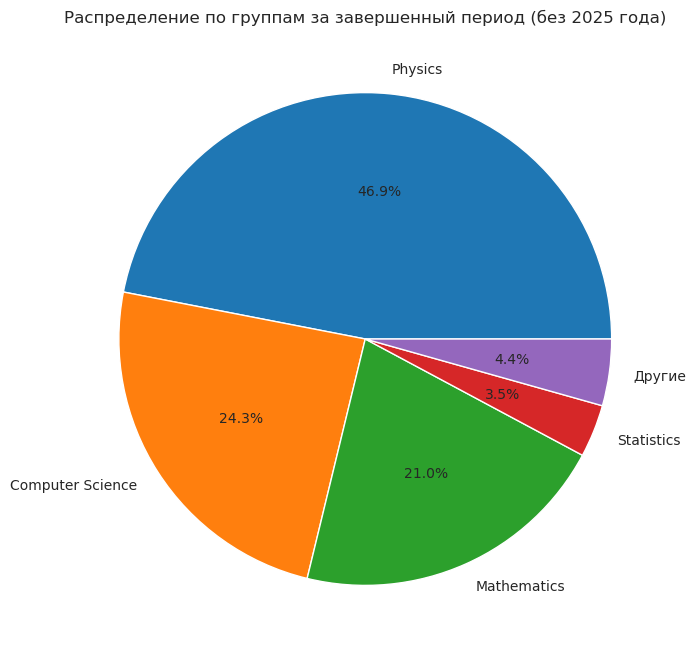

Статистика за весь завершенный период (без 2025 года):
1. Physics: 2058882 статей
2. Computer Science: 1064216 статей
3. Mathematics: 919529 статей
4. Statistics: 151534 статей
Другие: 191545 статей


In [63]:
"""
 Суммарно больше всего статей по физике.
"""
group_counts = df_arxiv_complete['group_name'].value_counts()
top_4 = group_counts.head(4)
other = group_counts[4:].sum()

labels = list(top_4.index) + ['Другие']
sizes = list(top_4.values) + [other]

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%')
plt.title('Распределение по группам за завершенный период (без 2025 года)')
plt.show()

print("Статистика за весь завершенный период (без 2025 года):")
for i, (group, count) in enumerate(top_4.items(), 1):
    print(f"{i}. {group}: {count} статей")
print(f"Другие: {other} статей")

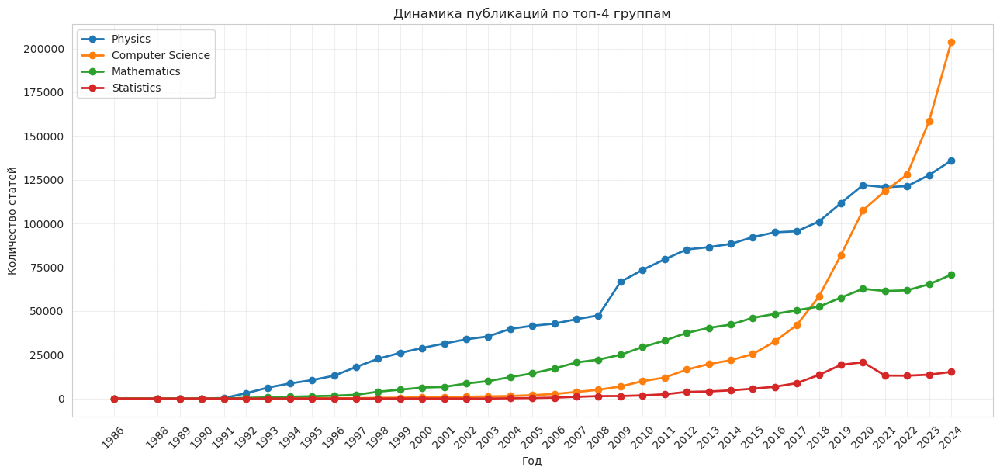

Количество статей по годам:
group_name  Computer Science  Mathematics  Physics  Statistics
year                                                          
1986                       0            0        2           0
1988                       0            0        1           0
1989                       0           10        0           0
1990                       2           32        1           0
1991                       3           66      305           0
1992                       1          408     3020           0
1993                       7          670     6264           0
1994                     251         1043     8645           1
1995                     255         1329    10534           0
1996                     237         1621    13066           0
1997                     197         2159    18023           1
1998                     409         3909    22734           1
1999                     492         5085    26089           2
2000                     76

In [64]:

"""
Хоть по физике и больше всего статей. В 2021 году физика и информатика сравнялись по популярности. 
И с 2022 года информатика стала популярнее физики.

"""

top_4_groups = df_arxiv_complete['group_name'].value_counts().head(4).index.tolist()
yearly_counts = df_arxiv_complete[df_arxiv_complete['group_name'].isin(top_4_groups)].groupby(['year', 'group_name']).size().unstack(fill_value=0)

plt.figure(figsize=(13, 6))
for group in top_4_groups:
    plt.plot(yearly_counts.index, yearly_counts[group], marker='o', label=group, linewidth=2)

plt.xlabel('Год')
plt.ylabel('Количество статей')
plt.title('Динамика публикаций по топ-4 группам')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xticks(yearly_counts.index)
plt.tight_layout()
plt.xticks(yearly_counts.index, rotation=45)
plt.show()

print("Количество статей по годам:")
print(yearly_counts)

In [65]:
pivot_table = df_arxiv.pivot_table(
    index='year',
    columns='group_name',
    values='id', # считаем по id (можно любое поле)
    aggfunc='count',
    fill_value=0 # заполняем пропуски 0
)

pivot_table.style.background_gradient(cmap='PuBu')

group_name,Computer Science,Economics,Electrical Engineering and Systems Science,Mathematics,Physics,Quantitative Biology,Quantitative Finance,Statistics
year,,,,,,,,
1986,0,0,0,0,2,0,0,0
1988,0,0,0,0,1,0,0,0
1989,0,0,0,10,0,0,0,0
1990,2,0,0,32,1,0,0,0
1991,3,0,0,66,305,0,0,0
1992,1,0,0,408,3020,2,0,0
1993,7,0,0,670,6264,4,0,0
1994,251,0,0,1043,8645,7,0,1
1995,255,0,0,1329,10534,9,0,0


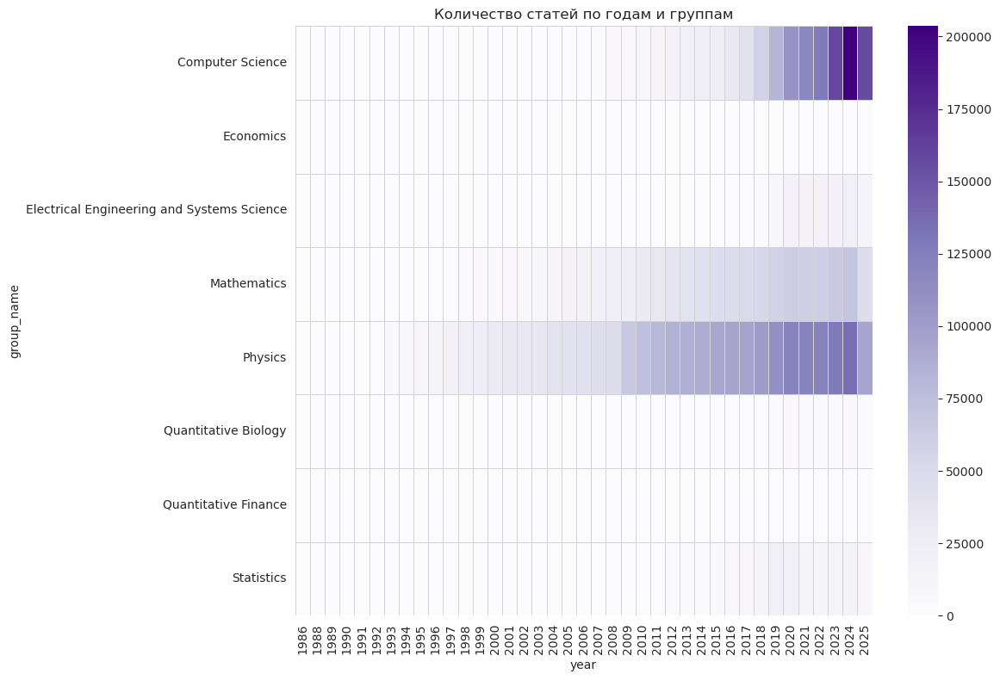

In [66]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Количество статей по годам и группам")
plt.tight_layout()
plt.show()

-------------------

## Physics




In [67]:
df_physics_only = df_arxiv[df_arxiv['group_name'] == 'Physics']
pivot_table_physics = df_physics_only.pivot_table(
    index='year',
    columns='archive_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_physics.style.background_gradient(cmap='YlOrRd'))

archive_name,Astrophysics,Condensed Matter,General Relativity and Quantum Cosmology,High Energy Physics - Experiment,High Energy Physics - Lattice,High Energy Physics - Phenomenology,High Energy Physics - Theory,Mathematical Physics,Nonlinear Sciences,Nuclear Experiment,Nuclear Theory,Physics,Quantum Physics
year,,,,,,,,,,,,,
1986,0,0,0,0,0,0,1,0,0,0,0,1,0
1988,0,0,0,0,0,0,1,0,0,0,0,0,0
1990,0,0,0,0,0,0,0,1,0,0,0,0,0
1991,0,0,0,0,0,0,302,0,3,0,0,0,0
1992,0,0,167,0,387,855,1520,5,19,0,64,0,3
1993,0,14,601,0,480,1995,2418,8,339,0,407,1,1
1994,0,37,979,96,591,2894,2974,7,411,7,564,45,40
1995,0,138,1096,202,589,3445,3094,9,566,46,785,127,437
1996,1,858,1216,275,731,3939,3429,44,692,87,930,260,604


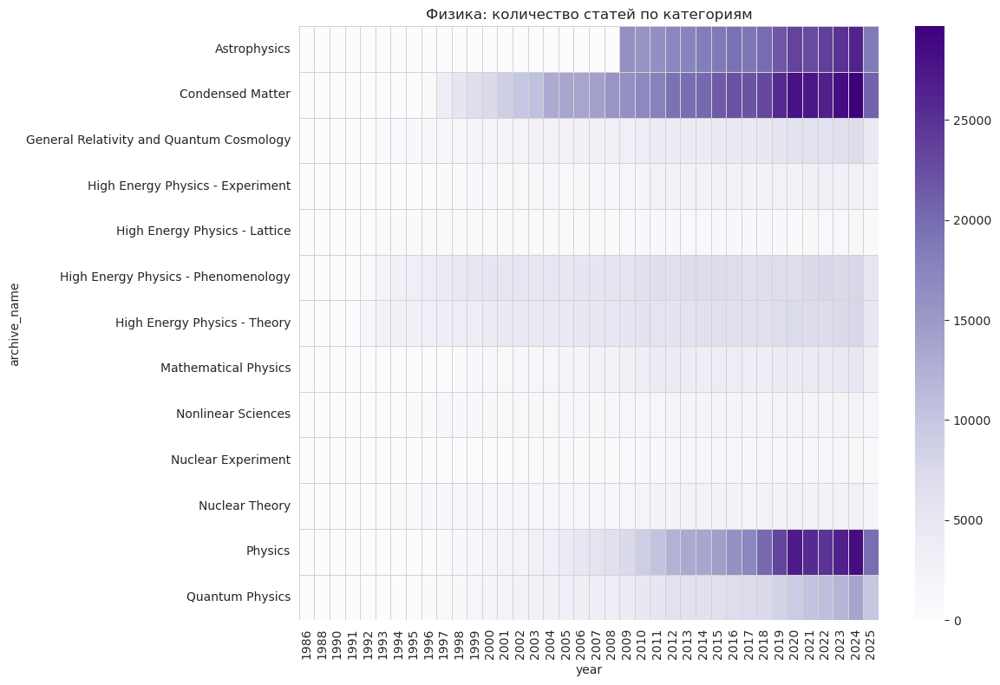

In [68]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_physics.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Физика: количество статей по категориям")
plt.tight_layout()
plt.show()

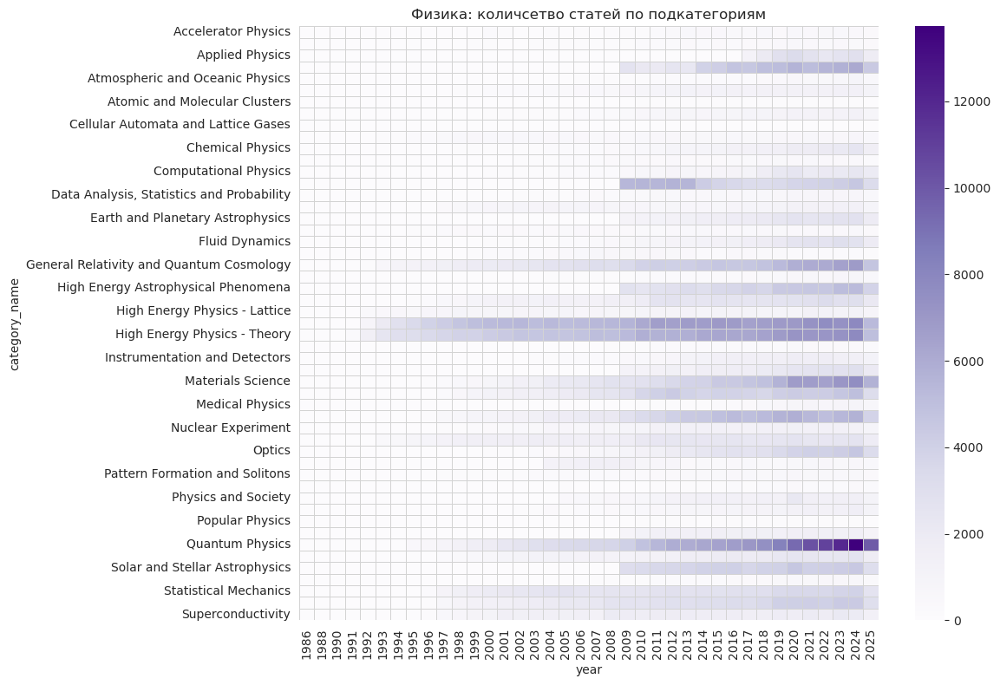

In [69]:
pivot_table_physics_category = df_physics_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
) # тяжело читается

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_physics_category.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Физика: количсетво статей по подкатегориям")
plt.tight_layout()
plt.show()

---------

## Computer Science

In [70]:
df_cs_only = df_arxiv[df_arxiv['group_name'] == 'Computer Science']
pivot_table_cs = df_cs_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_cs.style.background_gradient(cmap='YlOrRd'))

category_name,Artificial Intelligence,Computation and Language,Computational Complexity,"Computational Engineering, Finance, and Science",Computational Geometry,Computer Science and Game Theory,Computer Vision and Pattern Recognition,Computers and Society,Cryptography and Security,Data Structures and Algorithms,Databases,Digital Libraries,Discrete Mathematics,"Distributed, Parallel, and Cluster Computing",Emerging Technologies,Formal Languages and Automata Theory,General Literature,Graphics,Hardware Architecture,Human-Computer Interaction,Information Retrieval,Information Theory,Logic in Computer Science,Machine Learning,Mathematical Software,Multiagent Systems,Multimedia,Networking and Internet Architecture,Neural and Evolutionary Computing,Numerical Analysis,Operating Systems,Other Computer Science,Performance,Programming Languages,Robotics,Social and Information Networks,Software Engineering,Sound,Symbolic Computation,Systems and Control
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1990,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1991,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1992,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1993,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1994,14,223,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1995,27,225,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1996,28,202,1,0,0,0,0,0,2,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1997,20,164,2,1,0,0,0,0,0,5,0,0,0,0,1,0,0,0,0,0,0,0,1,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1998,30,113,31,0,12,0,3,2,6,10,8,7,3,11,2,1,3,5,4,8,1,1,18,7,2,6,2,62,15,3,2,0,3,12,2,0,11,0,3,0


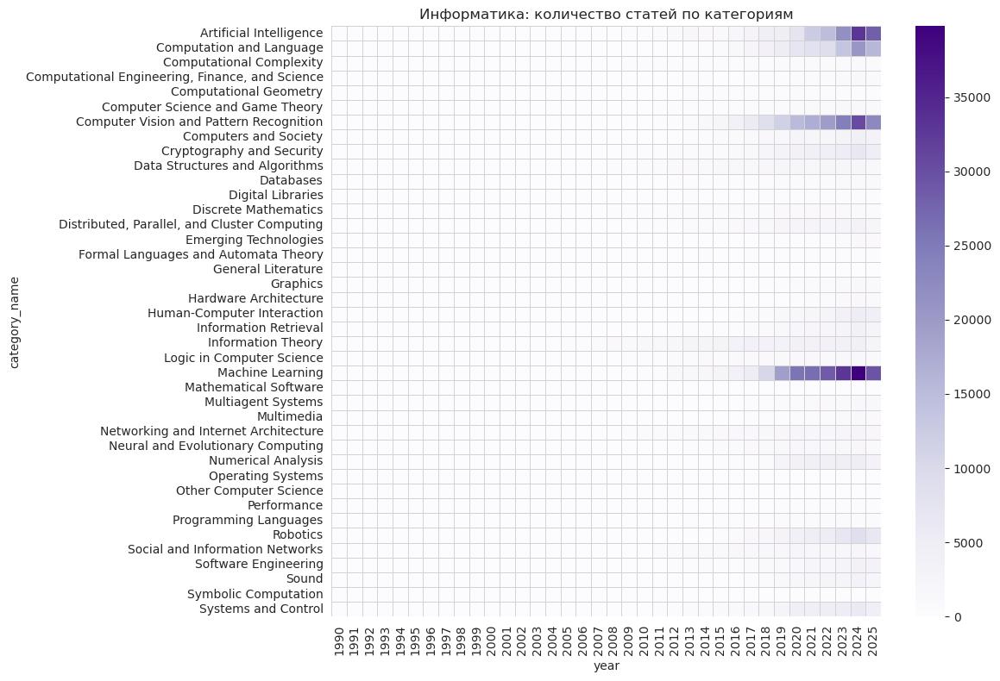

In [71]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_cs.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Информатика: количество статей по категориям")
plt.tight_layout()
plt.show()

-------------

## Economics

In [72]:
df_economics_only = df_arxiv[df_arxiv['group_name'] == 'Economics']
pivot_table_economics = df_economics_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_economics.style.background_gradient(cmap='YlOrRd'))

category_name,Econometrics,General Economics,Theoretical Economics
year,,,
2003,0,0,1
2005,1,0,0
2007,3,0,1
2008,1,0,2
2009,5,0,2
2010,2,1,0
2011,5,0,1
2012,5,0,3
2013,11,1,3


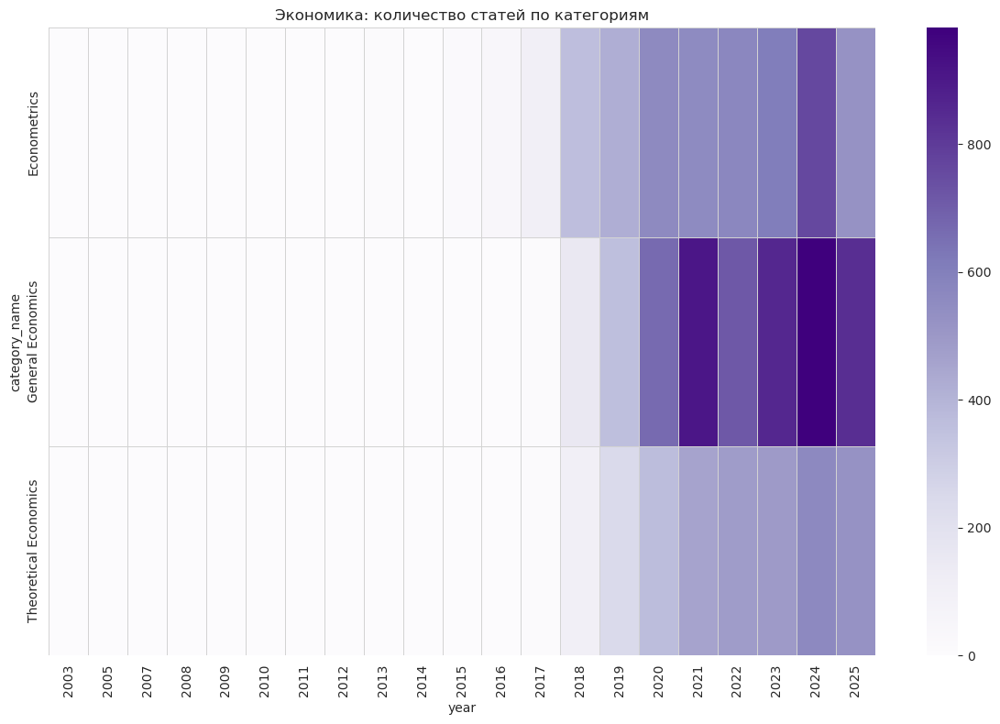

In [73]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_economics.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Экономика: количество статей по категориям")
plt.tight_layout()
plt.show()

--------------

## Electrical Engineering and Systems Science

In [74]:
df_eess_only = df_arxiv[df_arxiv['group_name'] == 'Electrical Engineering and Systems Science']
pivot_table_eess = df_eess_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_eess.style.background_gradient(cmap='YlOrRd'))

category_name,Audio and Speech Processing,Image and Video Processing,Signal Processing,Systems and Control
year,,,,
2009,0,0,0,1
2010,1,1,0,1
2011,2,2,0,1
2012,1,1,1,3
2013,1,2,3,1
2014,0,1,1,2
2015,4,5,9,5
2016,5,5,21,9
2017,207,96,429,30


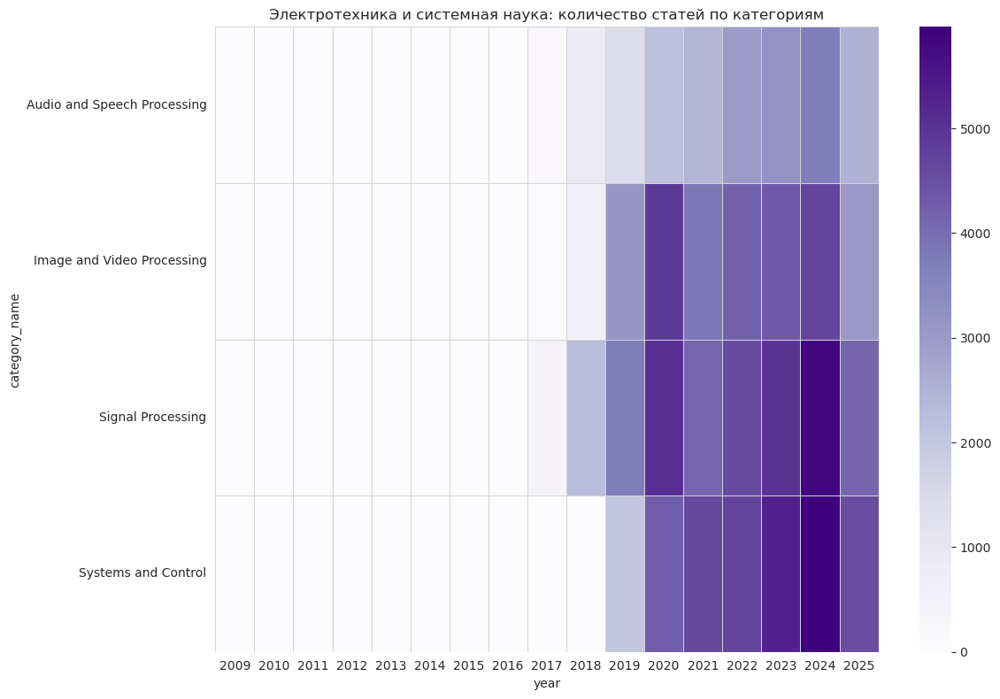

In [75]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_eess.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Электротехника и системная наука: количество статей по категориям")
plt.tight_layout()
plt.show()

--------------

## Mathematics

In [76]:
df_mathematics_only = df_arxiv[df_arxiv['group_name'] == 'Mathematics']
pivot_table_mathematics = df_mathematics_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_mathematics.style.background_gradient(cmap='YlOrRd'))

category_name,Algebraic Geometry,Algebraic Topology,Analysis of PDEs,Category Theory,Classical Analysis and ODEs,Combinatorics,Commutative Algebra,Complex Variables,Differential Geometry,Dynamical Systems,Functional Analysis,General Mathematics,General Topology,Geometric Topology,Group Theory,History and Overview,Information Theory,K-Theory and Homology,Logic,Mathematical Physics,Metric Geometry,Number Theory,Numerical Analysis,Operator Algebras,Optimization and Control,Probability,Quantum Algebra,Representation Theory,Rings and Algebras,Spectral Theory,Statistics Theory,Symplectic Geometry
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1989,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,0,0,0,0,0,0
1990,0,0,0,0,0,1,0,1,1,6,13,0,0,1,0,0,0,0,3,1,2,0,0,0,0,2,1,0,0,0,0,0
1991,1,0,0,0,0,1,0,0,2,22,16,0,0,2,1,0,0,0,6,0,0,0,1,1,0,0,13,0,0,0,0,0
1992,81,2,8,0,7,7,1,18,24,21,70,0,3,9,9,2,0,0,48,5,6,5,2,24,0,1,42,7,2,2,0,2
1993,134,3,2,0,45,15,3,7,22,15,72,0,5,8,15,1,1,2,65,8,3,2,8,28,1,4,178,3,9,3,0,8
1994,229,3,2,0,55,42,8,14,92,27,97,0,3,15,14,4,0,1,72,7,7,15,2,36,0,3,274,10,6,1,1,3
1995,286,10,6,2,35,48,10,32,164,30,75,0,1,8,19,0,1,1,71,9,10,20,0,34,2,4,425,18,5,1,0,2
1996,354,0,1,0,20,13,11,43,230,39,112,0,6,15,23,0,1,0,70,44,9,15,3,51,0,6,520,18,14,3,0,0
1997,387,10,9,1,16,71,12,28,317,27,129,0,8,57,34,1,0,1,75,215,12,25,4,68,2,19,585,14,19,9,1,3


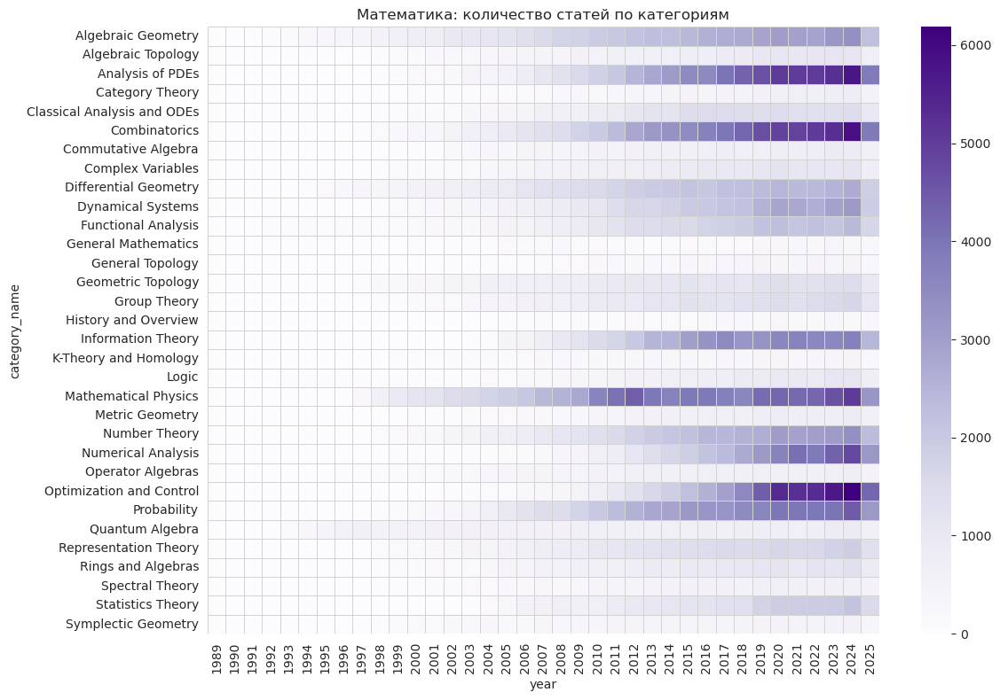

In [77]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_mathematics.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Математика: количество статей по категориям")
plt.tight_layout()
plt.show()

-----

## Quantitative Biology

In [78]:
df_qbio_only = df_arxiv[df_arxiv['group_name'] == 'Quantitative Biology']
pivot_table_qbio = df_qbio_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_qbio.style.background_gradient(cmap='YlOrRd'))

category_name,Biomolecules,Cell Behavior,Genomics,Molecular Networks,Neurons and Cognition,Other Quantitative Biology,Populations and Evolution,Quantitative Methods,Subcellular Processes,Tissues and Organs
year,,,,,,,,,,
1992,0,0,0,0,0,0,0,2,0,0
1993,1,0,0,0,1,0,2,0,0,0
1994,2,0,1,1,2,0,1,0,0,0
1995,1,2,1,0,1,0,2,1,1,0
1996,2,0,2,0,1,0,5,1,0,0
1997,9,1,2,2,2,0,4,1,0,0
1998,7,1,1,0,13,1,10,8,0,0
1999,22,3,0,4,12,2,21,5,3,1
2000,18,3,5,6,15,4,18,4,2,2


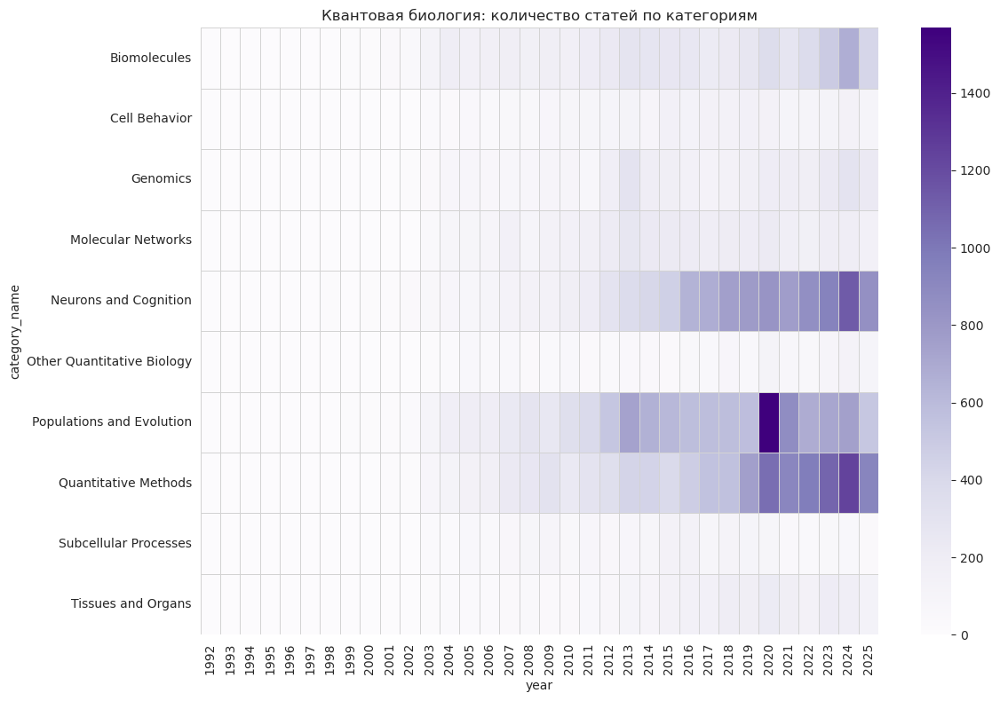

In [79]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_qbio.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Квантовая биология: количество статей по категориям")
plt.tight_layout()
plt.show()

-----------

## Quantitative Finance

In [80]:
df_qfinance_only = df_arxiv[df_arxiv['group_name'] == 'Quantitative Finance']
pivot_table_qfinance = df_qfinance_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_qfinance.style.background_gradient(cmap='YlOrRd'))

category_name,Computational Finance,Economics,General Finance,Mathematical Finance,Portfolio Management,Pricing of Securities,Risk Management,Statistical Finance,Trading and Market Microstructure
year,,,,,,,,,
1997,0,0,3,0,1,3,0,12,1
1998,3,0,4,0,5,13,2,11,4
1999,3,0,4,0,3,6,0,26,12
2000,2,0,16,0,3,7,1,35,16
2001,3,0,13,0,3,4,8,46,27
2002,2,0,16,0,13,18,5,40,23
2003,5,0,27,0,6,5,7,58,20
2004,4,0,32,0,3,16,7,66,20
2005,12,0,47,0,6,14,7,93,23


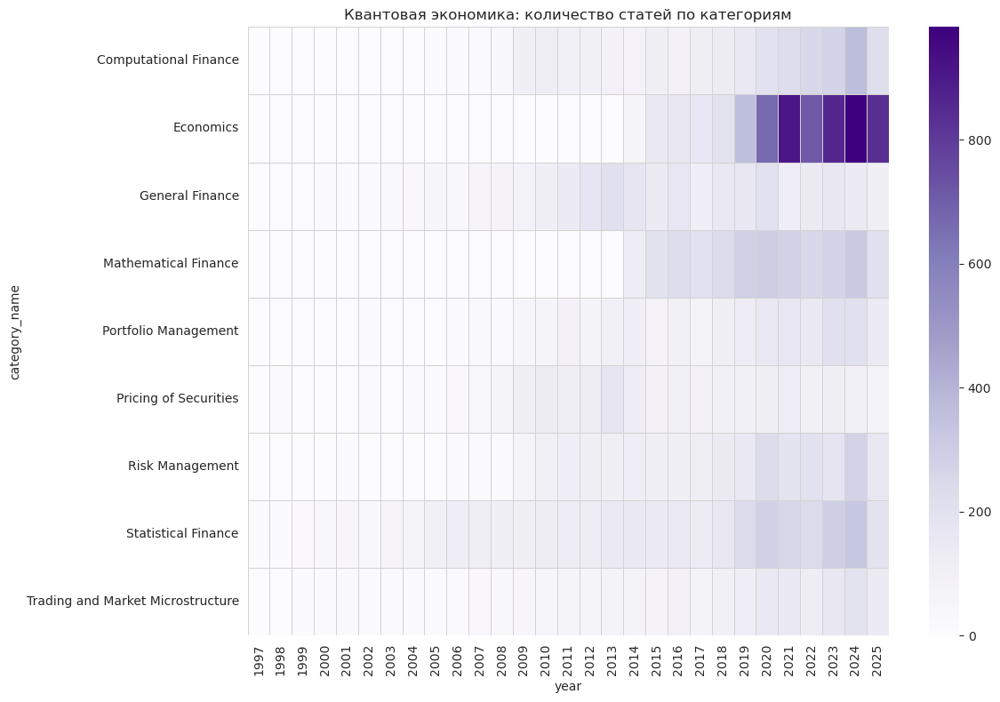

In [81]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_qfinance.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Квантовая экономика: количество статей по категориям")
plt.tight_layout()
plt.show()

-----------

## Statistics

In [82]:
df_statistics_only = df_arxiv[df_arxiv['group_name'] == 'Statistics']
pivot_table_statistics = df_statistics_only.pivot_table(
    index='year',
    columns='category_name',
    values='id',
    aggfunc='count',
    fill_value=0
)
display(pivot_table_statistics.style.background_gradient(cmap='YlOrRd'))

category_name,Applications,Computation,Machine Learning,Methodology,Other Statistics,Statistics Theory
year,,,,,,
1994,0,0,0,0,0,1
1997,0,0,0,0,0,1
1998,0,0,0,0,0,1
1999,0,0,0,0,0,2
2000,0,0,0,0,0,9
2001,0,0,0,0,0,17
2002,1,0,1,0,0,24
2003,0,0,0,0,0,37
2004,1,0,2,0,0,159


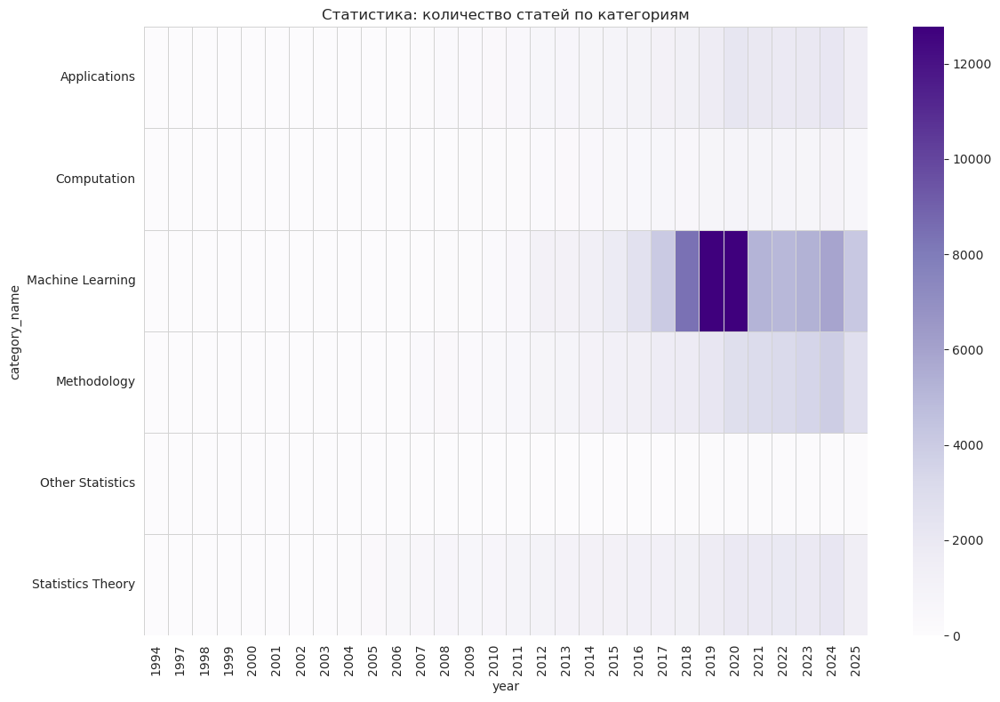

In [83]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table_statistics.T, cmap="Purples", linewidths=0.5, linecolor='lightgray')
plt.title("Статистика: количество статей по категориям")
plt.tight_layout()
plt.show()

-------------------
# TOPIC MODELING

Проверим два популярных алгоритма для тематического моделирования: 

1. Латентное размещение Дирихле (LDA). Для LDA нужно использовать CountVectorizer.
2. Неотрицательная матричная факторизация (NMF). Для данного моделирования правильно использоваь TfidfVectorizer.

------------------

## Шаг 1: Подготовка и очистка текста

In [ ]:
# lemmatizer = WordNetLemmatizer()
# stop_words = set(stopwords.words('english')) # у нас описание на английском языке

# def preprocess_text(text):
#     text = re.sub(r'[^a-zA-Z]', ' ', text) # оставляем только буквы (убираем спец символы)
#      # приводим текст к нижнему регистру и разбиваем на слова
#     words = text.lower().split()
#     # лемматизация и удаление стоп-слов (не несут смысловой нагрузки)
#     # len(w) > 2 - борьба с шумом
#     lemmatized_words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words and len(w) > 2]
#     return " ".join(lemmatized_words)

# tqdm.pandas(desc="🍂🍂🍂🍂")
# df_arxiv['processed_abstract'] = df_arxiv['abstract'].progress_apply(preprocess_text)

# df_arxiv.to_csv("./data/df_arxiv.csv")

🍂🍂🍂🍂:   0%|          | 0/4716396 [00:00<?, ?it/s]

In [2]:
arxiv = pd.read_csv("./data/df_arxiv.csv")

In [3]:
# после очистки текста выяснилось, что кто-то не прописывал abstract к своим статьям
arxiv[arxiv['processed_abstract'].isnull()]

,Unnamed: 0,id,title,categories,abstract,data,year,year_month,group_name,archive_name,archive_id,category_name,category_id,category_description,processed_abstract
1239239,1239239,1609.01476,Can decay be ascribed to classical noise?,quant-ph math-ph math.MP,No.\n,2016-09-06 10:18:58+00:00,2016,2016-09,Physics,Quantum Physics,quant-ph,Quantum Physics,quant-ph,Description coming soon,NaN
1239240,1239240,1609.01476,Can decay be ascribed to classical noise?,quant-ph math-ph math.MP,No.\n,2016-09-06 10:18:58+00:00,2016,2016-09,Physics,Mathematical Physics,math-ph,Mathematical Physics,math-ph,Articles in this category focus on areas of re...,NaN
1239241,1239241,1609.01476,Can decay be ascribed to classical noise?,quant-ph math-ph math.MP,No.\n,2016-09-06 10:18:58+00:00,2016,2016-09,Mathematics,Mathematics,Mathematics,Mathematical Physics,math.MP,math.MP is an alias for math-ph. Articles in t...,NaN
1761863,1761863,1902.02322,Is AmI (Attacks Meet Interpretability) Robust ...,cs.LG cs.AI cs.CR stat.ML,No.\n,2019-02-06 18:38:02+00:00,2019,2019-02,Computer Science,Computer Science,Computer Science,Machine Learning,cs.LG,Papers on all aspects of machine learning rese...,NaN
1761864,1761864,1902.02322,Is AmI (Attacks Meet Interpretability) Robust ...,cs.LG cs.AI cs.CR stat.ML,No.\n,2019-02-06 18:38:02+00:00,2019,2019-02,Computer Science,Computer Science,Computer Science,Artificial Intelligence,cs.AI,"Covers all areas of AI except Vision, Robotics...",NaN
1761865,1761865,1902.02322,Is AmI (Attacks Meet Interpretability) Robust ...,cs.LG cs.AI cs.CR stat.ML,No.\n,2019-02-06 18:38:02+00:00,2019,2019-02,Computer Science,Computer Science,Computer Science,Cryptography and Security,cs.CR,Covers all areas of cryptography and security ...,NaN
1761866,1761866,1902.02322,Is AmI (Attacks Meet Interpretability) Robust ...,cs.LG cs.AI cs.CR stat.ML,No.\n,2019-02-06 18:38:02+00:00,2019,2019-02,Statistics,Statistics,Statistics,Machine Learning,stat.ML,"Covers machine learning papers (supervised, un...",NaN
3123576,3123576,2303.11802,Could planet/sun conjunctions be used to predi...,physics.geo-ph,No.\n,2023-03-21 12:36:15+00:00,2023,2023-03,Physics,Physics,physics,Geophysics,physics.geo-ph,Atmospheric physics. Biogeosciences. Computati...,NaN
4151855,4151855,2507.03413,Is it true that most sets are Sidon?,math.NT math.GN,No.,2025-07-04 09:22:09+00:00,2025,2025-07,Mathematics,Mathematics,Mathematics,Number Theory,math.NT,"Prime numbers, diophantine equations, analytic...",NaN
4151856,4151856,2507.03413,Is it true that most sets are Sidon?,math.NT math.GN,No.,2025-07-04 09:22:09+00:00,2025,2025-07,Mathematics,Mathematics,Mathematics,General Topology,math.GN,"Continuum theory, point-set topology, spaces w...",NaN


In [4]:
arxiv.dropna(inplace=True)

In [5]:
arxiv_current = arxiv.query('2023 <= year <= 2024').reset_index(drop=True)
arxiv_2025 = arxiv[arxiv['year'] == 2025].reset_index(drop=True)

In [6]:
arxiv_2025['group_name'].unique()

array(['Computer Science', 'Mathematics', 'Physics', 'Statistics',
       'Quantitative Biology',
       'Electrical Engineering and Systems Science', 'Economics',
       'Quantitative Finance'], dtype=object)

In [7]:
arxiv_2025_cs = arxiv_2025[arxiv_2025['group_name'] == "Computer Science"].reset_index(drop=True)
arxiv_2025_math = arxiv_2025[arxiv_2025['group_name'] == 'Mathematics'].reset_index(drop=True)
arxiv_2025_ph = arxiv_2025[arxiv_2025['group_name'] == 'Physics'].reset_index(drop=True)
arxiv_2025_stat = arxiv_2025[arxiv_2025['group_name'] == 'Statistics'].reset_index(drop=True)
arxiv_2025_qbio = arxiv_2025[arxiv_2025['group_name'] == 'Quantitative Biology'].reset_index(drop=True)
arxiv_2025_eess = arxiv_2025[arxiv_2025['group_name'] == 'Electrical Engineering and Systems Science'].reset_index(drop=True)
arxiv_2025_econ = arxiv_2025[arxiv_2025['group_name'] == 'Economics'].reset_index(drop=True)
arxiv_2025_qfin = arxiv_2025[arxiv_2025['group_name'] == 'Quantitative Finance'].reset_index(drop=True)

In [8]:
"""
    Облако слов до и после очистки 
"""
def create_word_cloud(df, title = None):
    smpl = min(50000, len(df))
    text_before = " ".join(abstract for abstract in df['abstract'].sample(smpl, random_state=RANDOM_STATE))
    text_after = " ".join(abstract for abstract in df['processed_abstract'].sample(smpl, random_state=RANDOM_STATE))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(title, fontsize=24, y=0.95)
    

    wordcloud_before = WordCloud(
        width=800,
        height=800,
        background_color='white',
        colormap='magma',
        max_words=120
    ).generate(text_before)

    ax1.imshow(wordcloud_before, interpolation='bilinear')
    ax1.set_title('Облако слов ДО очистки', fontsize=20)
    ax1.axis('off')

    wordcloud_after = WordCloud(
        width=800,
        height=800,
        background_color='white',
        colormap='viridis',
        max_words=120
    ).generate(text_after)

    ax2.imshow(wordcloud_after, interpolation='bilinear')
    ax2.set_title('Облако слов ПОСЛЕ очистки', fontsize=20)
    ax2.axis('off')

    plt.tight_layout(pad=3.0)
    plt.show()

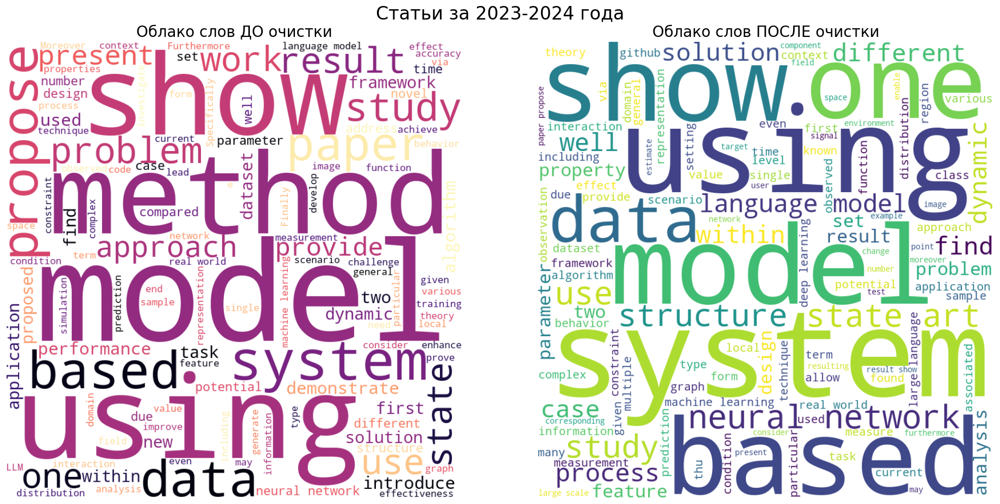

In [9]:
create_word_cloud(arxiv_current, title = "Статьи за 2023-2024 года")

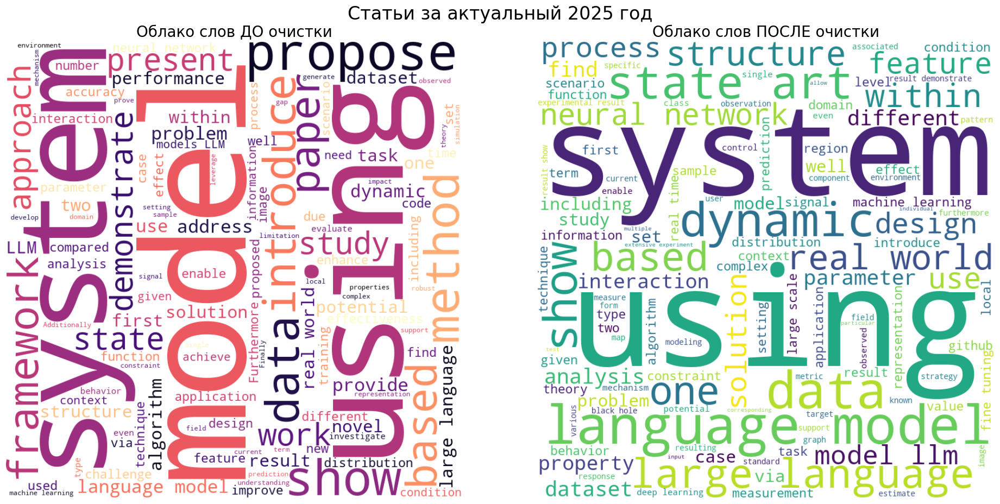

In [10]:
create_word_cloud(arxiv_2025, title = "Статьи за актуальный 2025 год")

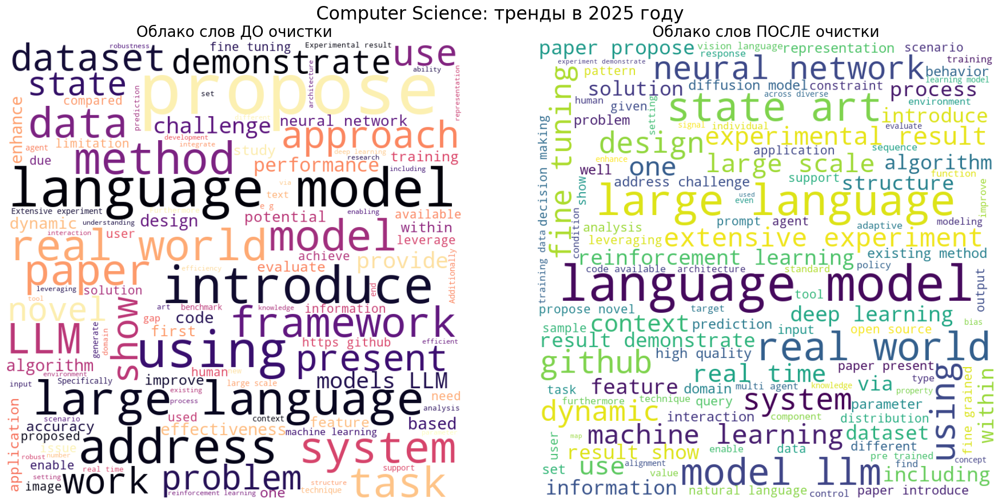

In [11]:
"""
    Посмотрим, что выстрельнуло в 2025 году по отдельным категориям
"""
create_word_cloud(arxiv_2025_cs, title = "Computer Science: тренды в 2025 году")

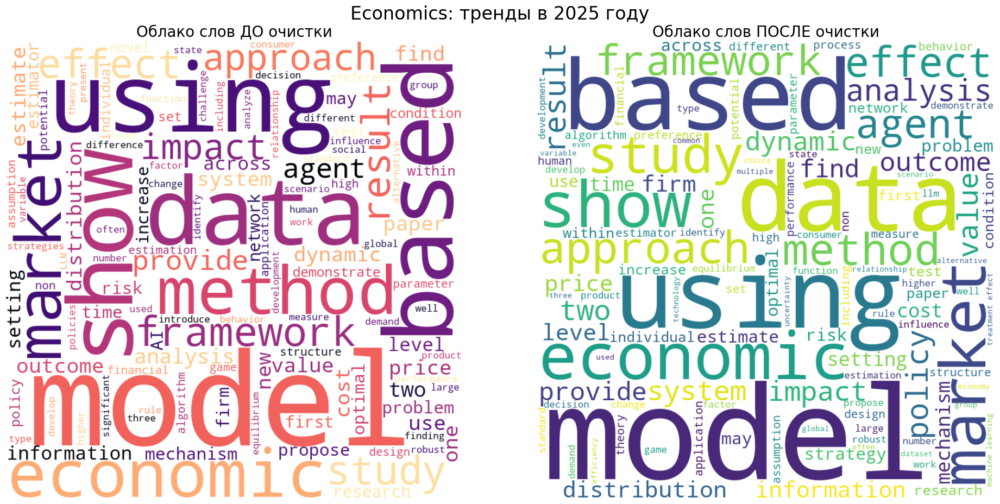

In [12]:
create_word_cloud(arxiv_2025_econ, title = "Economics: тренды в 2025 году")

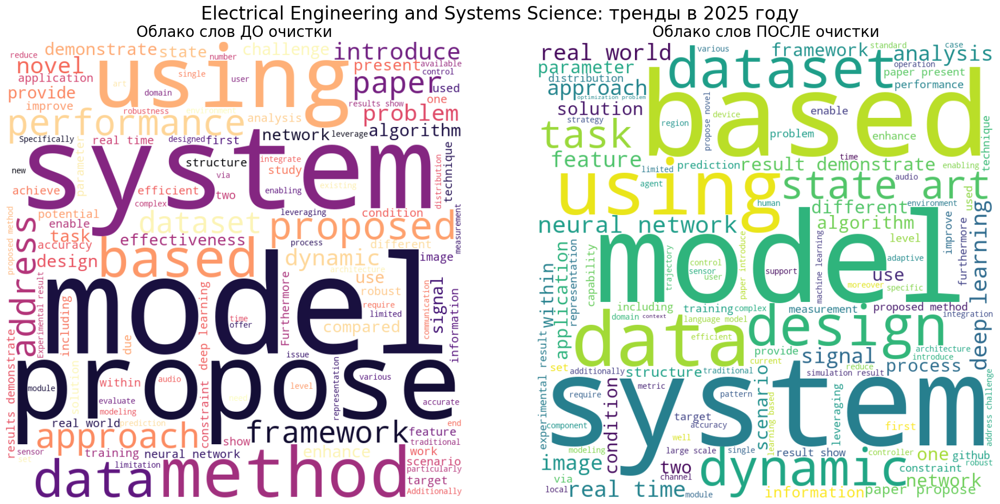

In [13]:
create_word_cloud(arxiv_2025_eess, title = "Electrical Engineering and Systems Science: тренды в 2025 году")

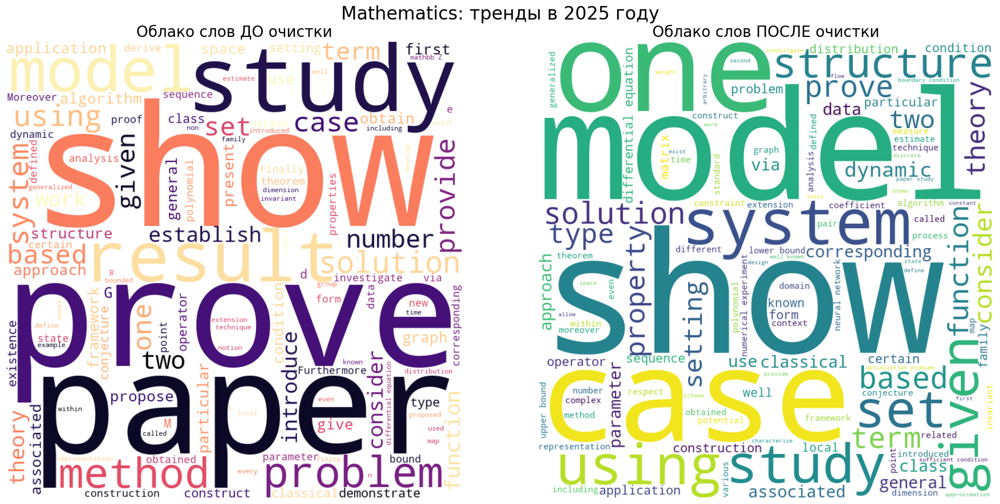

In [14]:
create_word_cloud(arxiv_2025_math, title = "Mathematics: тренды в 2025 году")

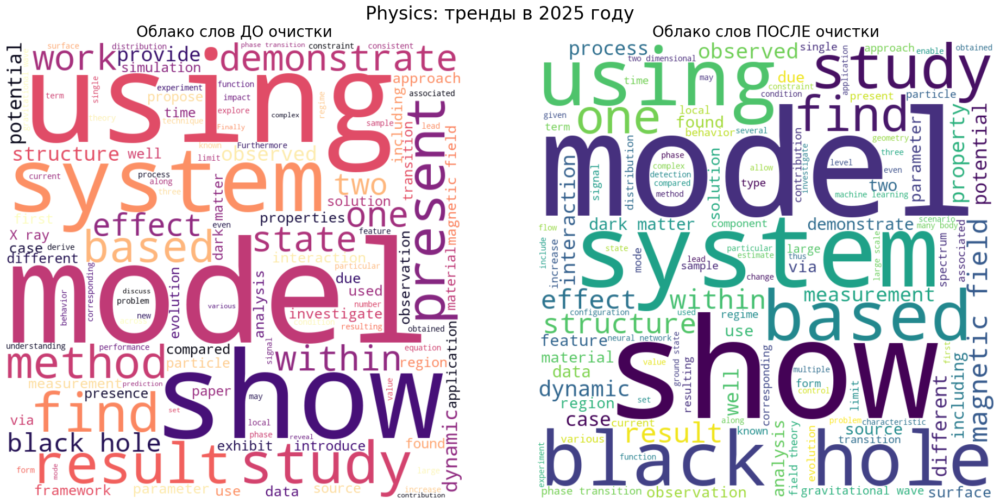

In [15]:
create_word_cloud(arxiv_2025_ph, title = "Physics: тренды в 2025 году")

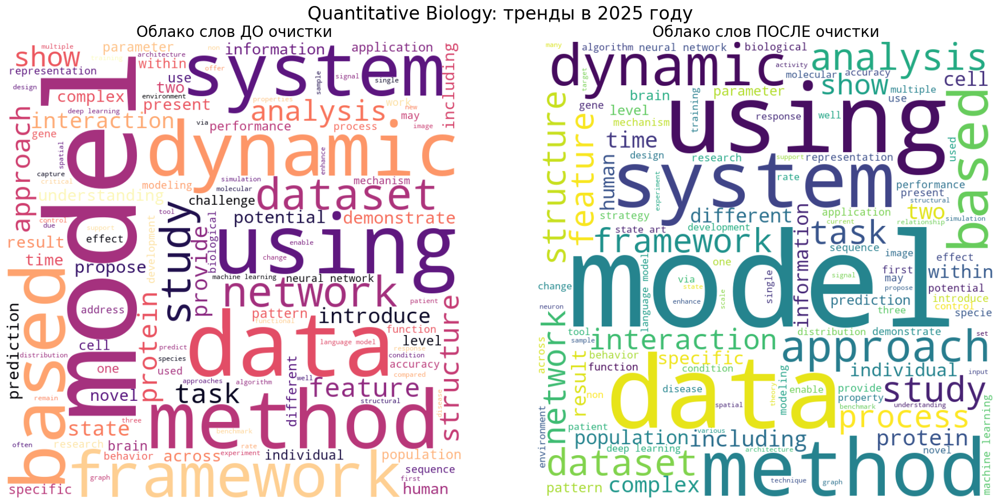

In [16]:
create_word_cloud(arxiv_2025_qbio, title = "Quantitative Biology: тренды в 2025 году")

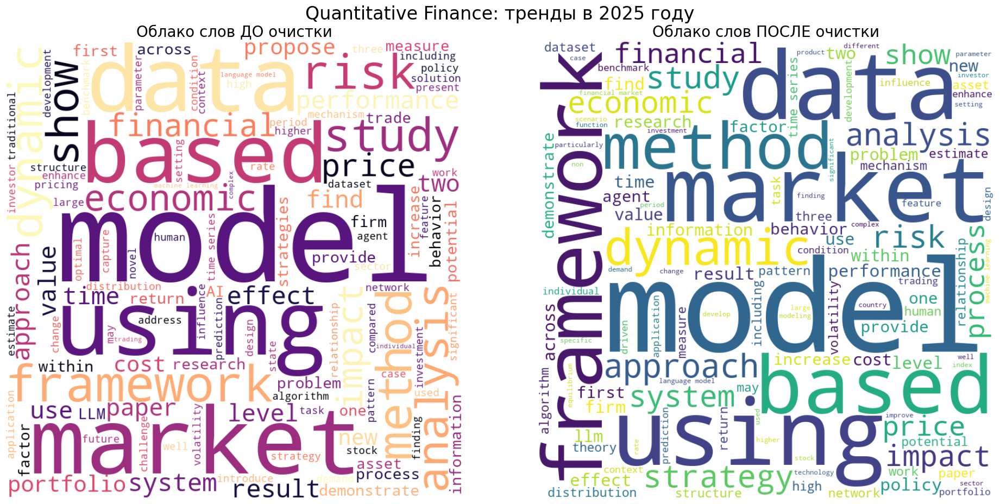

In [17]:
create_word_cloud(arxiv_2025_qfin, title = "Quantitative Finance: тренды в 2025 году")

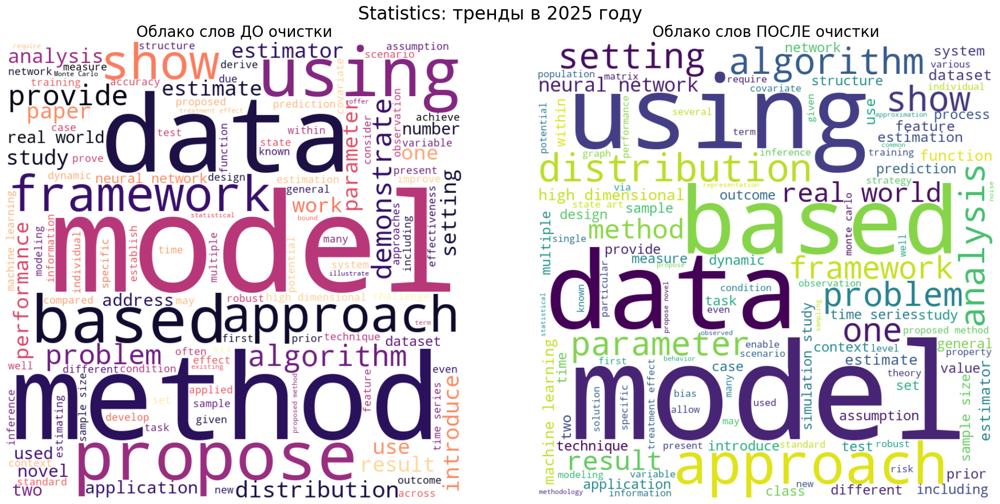

In [18]:
create_word_cloud(arxiv_2025_stat, title = "Statistics: тренды в 2025 году")

---------------

## Шаг 2: Векторизация текста


In [19]:
def create_tfidf_matrix(df, title= None):
    # Создаем векторизатор
    # max_df=0.95 - игнорировать слова, которые встречаются чаще чем в 95% документов
    # min_df=5 - игнорировать слова, которые встречаются реже чем в 5 документах
    vectorizer = TfidfVectorizer(max_df=0.95, min_df=5, stop_words='english')

    # Обучаем его на наших данных и преобразуем их в матрицу
    tfidf_matrix = vectorizer.fit_transform(df['processed_abstract'])
    print("Получившаяся матрица: ", tfidf_matrix)
    print(f"Размер матрицы (shape): {tfidf_matrix.shape}")

    print(f"Количество ненулевых элементов (nnz): {tfidf_matrix.nnz}")

    # плотность матрицы (какой процент ячеек не равен нулю)
    density = (tfidf_matrix.nnz / (tfidf_matrix.shape[0] * tfidf_matrix.shape[1])) * 100
    print(f"Плотность матрицы: {density:.6f}%")

    
    # список всех слов из векторизатора
    feature_names = vectorizer.get_feature_names_out()

    # сумма TF-IDF значения для каждого слова по всем документам
    total_tfidf_scores = np.asarray(tfidf_matrix.sum(axis=0)).ravel()

    df_tfidf = pd.DataFrame({
        'word': feature_names,
        'tfidf_score': total_tfidf_scores
    })

    df_tfidf_top20 = df_tfidf.sort_values(by='tfidf_score', ascending=False).head(20)

    plt.figure(figsize=(12, 8))
    sns.barplot(
        x='tfidf_score',
        y='word',
        data=df_tfidf_top20,
        palette='rocket'
    )

    plt.title(f'{title}: Топ-20 самых "важных" слов в корпусе по TF-IDF', fontsize=18)
    plt.xlabel('Суммарный TF-IDF вес', fontsize=12)
    plt.ylabel('Слово', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.show()
    
    return vectorizer, tfidf_matrix

Получившаяся матрица:    (0, 75886)	0.06953360240780264
  (0, 43608)	0.18169161769291117
  (0, 83118)	0.35313251327043305
  (0, 4846)	0.07900461591800416
  (0, 82939)	0.37188788772443726
  (0, 59803)	0.05270123787391724
  (0, 83134)	0.03470134534049942
  (0, 11072)	0.034438468235149164
  (0, 79189)	0.07027144730247283
  (0, 36538)	0.07897389883008578
  (0, 35796)	0.0720792326651409
  (0, 76874)	0.03209476951953332
  (0, 27004)	0.06446379764628289
  (0, 65520)	0.0801359763972613
  (0, 36663)	0.09349566849547211
  (0, 5041)	0.11899147852245033
  (0, 25050)	0.034586434004107186
  (0, 74160)	0.040857288515707815
  (0, 27533)	0.04187943265068963
  (0, 900)	0.07401740409043232
  (0, 79160)	0.22386539493334193
  (0, 37849)	0.05601073392389895
  (0, 34894)	0.07585836889679125
  (0, 18324)	0.07122785002424963
  (0, 78259)	0.08325624786974095
  :	:
  (847403, 10767)	0.06894467753149072
  (847403, 36972)	0.0642323387563364
  (847403, 23605)	0.05398107448036309
  (847403, 79398)	0.0671360552015904

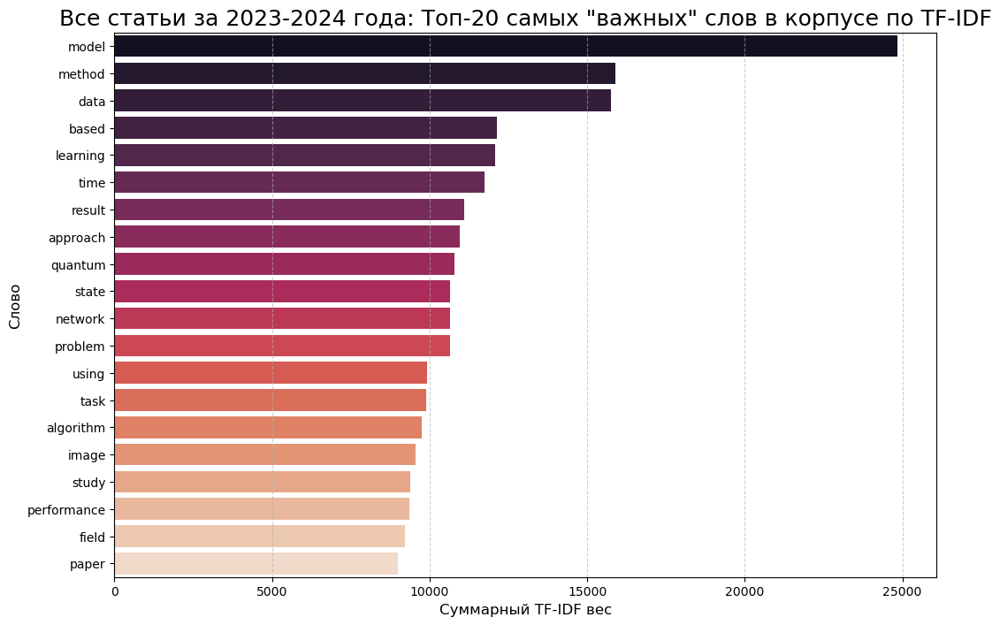

In [20]:
vectorizer_current, tfidf_matrix_current = create_tfidf_matrix(arxiv_current, title= "Статьи за 2023-2024 года")

Получившаяся матрица:    (0, 44845)	0.07639597398444344
  (0, 2454)	0.519825748864262
  (0, 47890)	0.0907173748066839
  (0, 44081)	0.06578614333959903
  (0, 18023)	0.06606234623735303
  (0, 44297)	0.09577848192646748
  (0, 30076)	0.07708638664287401
  (0, 25761)	0.04074683068998041
  (0, 25729)	0.047129553268885106
  (0, 30055)	0.11149421330690329
  (0, 26800)	0.1631776441606189
  (0, 19471)	0.09074959025260677
  (0, 12120)	0.08500912148662242
  (0, 23698)	0.04642291178448594
  (0, 23292)	0.07415295719851887
  (0, 18327)	0.11667384956179842
  (0, 5969)	0.32208245132305685
  (0, 22104)	0.19668298157962225
  (0, 30117)	0.14232049132395913
  (0, 14646)	0.06060604986897433
  (0, 35526)	0.07062582746551072
  (0, 14633)	0.13430161726812898
  (0, 19295)	0.09403168158432129
  (0, 16938)	0.13524386341719802
  (0, 26775)	0.0917976896190351
  :	:
  (330687, 40931)	0.09306224602670991
  (330687, 33918)	0.06819104577956131
  (330687, 46194)	0.07982364855617964
  (330687, 8260)	0.07898560870403874
 

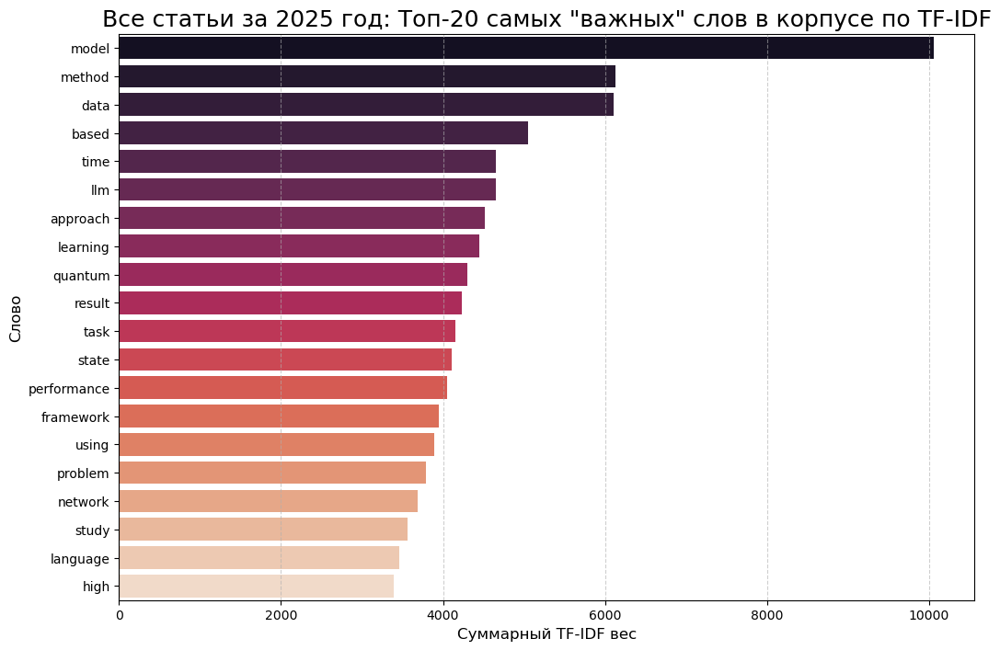

In [21]:
vectorizer_2025, tfidf_matrix_2025 = create_tfidf_matrix(arxiv_2025, title = "Все статьи за 2025 год")

Получившаяся матрица:    (0, 26529)	0.07693494721398474
  (0, 1511)	0.5350022833246587
  (0, 28292)	0.07367583290181406
  (0, 26048)	0.06790192140736111
  (0, 11114)	0.07056022448359696
  (0, 26188)	0.08926556443585396
  (0, 17881)	0.07470430487825969
  (0, 15407)	0.03596123359604342
  (0, 15388)	0.03724018091456945
  (0, 17863)	0.09642491920617391
  (0, 15996)	0.1329952741846659
  (0, 11879)	0.09130578481662184
  (0, 7427)	0.08089598374248476
  (0, 14421)	0.041478715192444275
  (0, 14143)	0.07398453733316378
  (0, 11272)	0.11401830172898463
  (0, 3424)	0.34041701929076695
  (0, 13298)	0.19165110404212082
  (0, 17916)	0.13229046435470743
  (0, 9003)	0.05769158378412997
  (0, 20907)	0.06966864778567143
  (0, 8993)	0.13644836720332995
  (0, 11764)	0.08891592243780742
  (0, 10430)	0.12942696083177982
  (0, 15981)	0.08316544080360691
  :	:
  (156160, 10985)	0.06770939392279177
  (156160, 29101)	0.32059368712142544
  (156160, 29847)	0.08508872932589931
  (156160, 1934)	0.10067934011538232
 

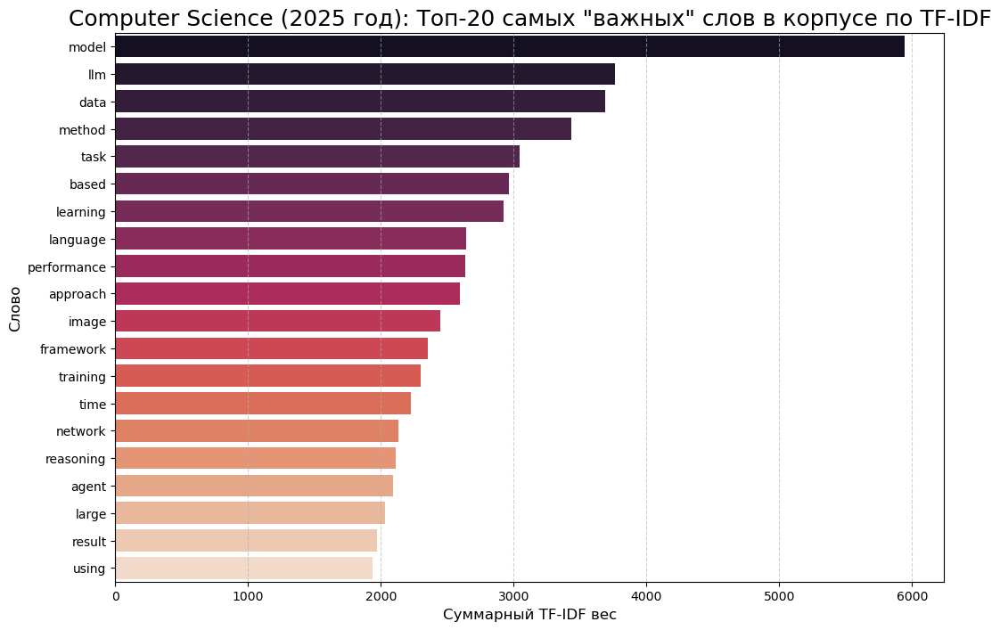

In [22]:
vectorizer_2025_cs, tfidf_matrix_2025_cs = create_tfidf_matrix(arxiv_2025_cs, title = "Computer Science (2025 год)")

Получившаяся матрица:    (0, 1757)	0.048037877459303865
  (0, 1844)	0.05583396711323286
  (0, 1969)	0.03527150766874008
  (0, 1967)	0.04756634936057136
  (0, 2223)	0.0210904712443582
  (0, 2041)	0.15445346685011038
  (0, 339)	0.053891213357957914
  (0, 3125)	0.05606309937532839
  (0, 3561)	0.06930099726462467
  (0, 1966)	0.06741138445535236
  (0, 1804)	0.03695085427444647
  (0, 3035)	0.07650621499290935
  (0, 3753)	0.07074480752313723
  (0, 97)	0.07427127740125947
  (0, 273)	0.7279057314606977
  (0, 1231)	0.05300815759593865
  (0, 2825)	0.18561255532219842
  (0, 2105)	0.13368226382140186
  (0, 722)	0.11259319264585693
  (0, 2103)	0.07427127740125947
  (0, 2720)	0.06014147940486974
  (0, 3291)	0.043725914915626815
  (0, 96)	0.051644729390112706
  (0, 620)	0.07650621499290935
  (0, 2470)	0.025074441155520624
  :	:
  (1887, 3292)	0.09846460963048469
  (1887, 303)	0.12139570675425668
  (1887, 2136)	0.14129849790032345
  (1887, 3674)	0.07579260641220847
  (1887, 834)	0.1289518387771852
  (1

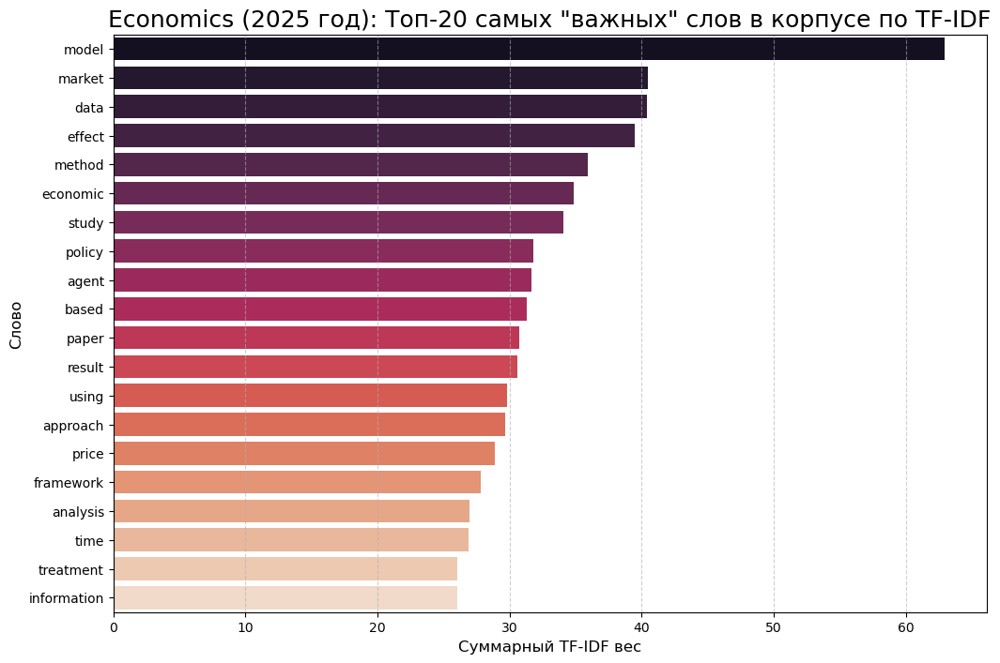

In [23]:
vectorizer_2025_econ, tfidf_matrix_2025_econ = create_tfidf_matrix(arxiv_2025_econ, title = "Economics (2025 год)")

Получившаяся матрица:    (0, 8339)	0.07605056204274414
  (0, 8434)	0.08260008664265969
  (0, 6109)	0.07412445047114821
  (0, 9032)	0.17297535418638124
  (0, 3478)	0.05214031431370699
  (0, 9476)	0.05070696208844615
  (0, 8259)	0.04933204039583168
  (0, 4984)	0.050877053027313726
  (0, 9624)	0.526945935357653
  (0, 2641)	0.05527531823557441
  (0, 958)	0.05792498309968006
  (0, 3594)	0.1053891870715306
  (0, 7825)	0.055715615182307936
  (0, 4628)	0.03364425999985093
  (0, 3114)	0.16163286260755685
  (0, 9121)	0.3093422464736357
  (0, 6306)	0.08566197261803767
  (0, 728)	0.08455234070957375
  (0, 2313)	0.09889504889628326
  (0, 2903)	0.05506107739001311
  (0, 7150)	0.040462652371280036
  (0, 1608)	0.05247803656904075
  (0, 6348)	0.0872574031326999
  (0, 751)	0.23846941037038122
  (0, 1795)	0.06442593960287754
  :	:
  (14256, 3103)	0.0757366072717013
  (14256, 3424)	0.15236529551774455
  (14256, 737)	0.11990221690460981
  (14256, 6575)	0.11395951843757568
  (14256, 2322)	0.0853135561495662

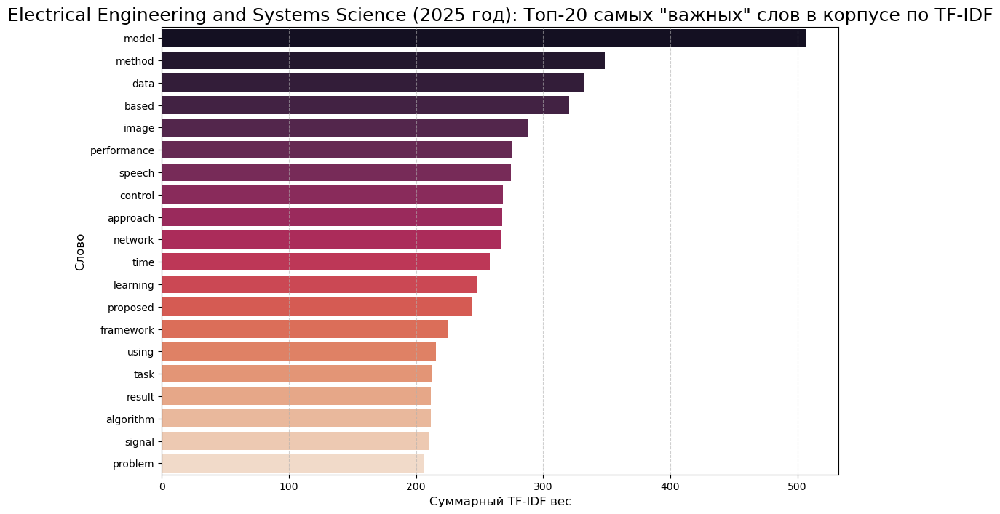

In [24]:
vectorizer_2025_eess, tfidf_matrix_2025_eess = create_tfidf_matrix(arxiv_2025_eess, 
                                        title = "Electrical Engineering and Systems Science (2025 год)")

Получившаяся матрица:    (0, 10904)	0.07748001569221272
  (0, 11111)	0.133606659510576
  (0, 2286)	0.28401003382844614
  (0, 13050)	0.17324910927392942
  (0, 14757)	0.19929018176489058
  (0, 12018)	0.3589091399709985
  (0, 362)	0.30604922236276255
  (0, 9523)	0.10671830162365578
  (0, 1081)	0.06259581051506222
  (0, 11118)	0.3577484030853806
  (0, 11580)	0.09404162050557818
  (0, 7078)	0.08543693040579221
  (0, 15271)	0.20744401718948322
  (0, 11720)	0.11535662862492298
  (0, 2123)	0.1124087496093333
  (0, 11701)	0.12554065681378968
  (0, 15177)	0.13474907054983584
  (0, 9231)	0.11752835513857993
  (0, 1890)	0.05978607056910052
  (0, 3674)	0.12246210861538928
  (0, 6691)	0.1334109333041665
  (0, 6841)	0.08663590643134529
  (0, 13572)	0.09124365159643061
  (0, 11456)	0.11463915898219325
  (0, 14924)	0.12954067702817793
  :	:
  (47471, 3452)	0.07956299418949538
  (47471, 5468)	0.16712013133345294
  (47471, 7440)	0.37075086663131246
  (47471, 10892)	0.2102107042781984
  (47471, 12797)	0.0

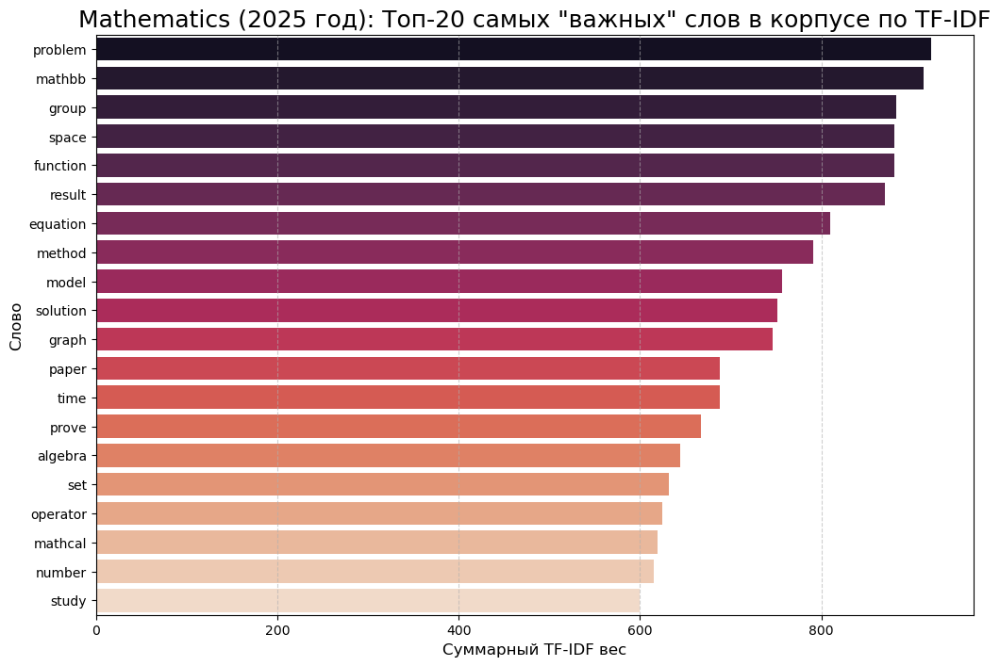

In [25]:
vectorizer_2025_math, tfidf_matrix_2025_math = create_tfidf_matrix(arxiv_2025_math, title = "Mathematics (2025 год)")

Получившаяся матрица:    (0, 16652)	0.05802392724016309
  (0, 11642)	0.043512920321254686
  (0, 10174)	0.06388717346506628
  (0, 17020)	0.031152200184418024
  (0, 21595)	0.17789639628302692
  (0, 4534)	0.07573593996915204
  (0, 18173)	0.2661194670764611
  (0, 1805)	0.04252499153933464
  (0, 5143)	0.18644359053568776
  (0, 207)	0.21919823922081394
  (0, 5627)	0.03995550792694492
  (0, 9806)	0.05919951832854295
  (0, 19794)	0.05983353328267514
  (0, 17512)	0.05570693539249522
  (0, 3217)	0.0562876868737993
  (0, 20264)	0.23852166244272624
  (0, 5122)	0.4707935664350342
  (0, 4299)	0.059744353336966136
  (0, 8719)	0.2064965103991648
  (0, 9839)	0.04494961804357955
  (0, 7439)	0.058301186967242874
  (0, 7042)	0.04667260683650086
  (0, 7575)	0.17363607586114227
  (0, 4435)	0.07016791020781592
  (0, 15057)	0.060045185165930166
  :	:
  (94474, 5611)	0.12047084553499729
  (94474, 15255)	0.06589620920633843
  (94474, 11477)	0.07280957735962058
  (94474, 4678)	0.1601926307874003
  (94474, 24120)

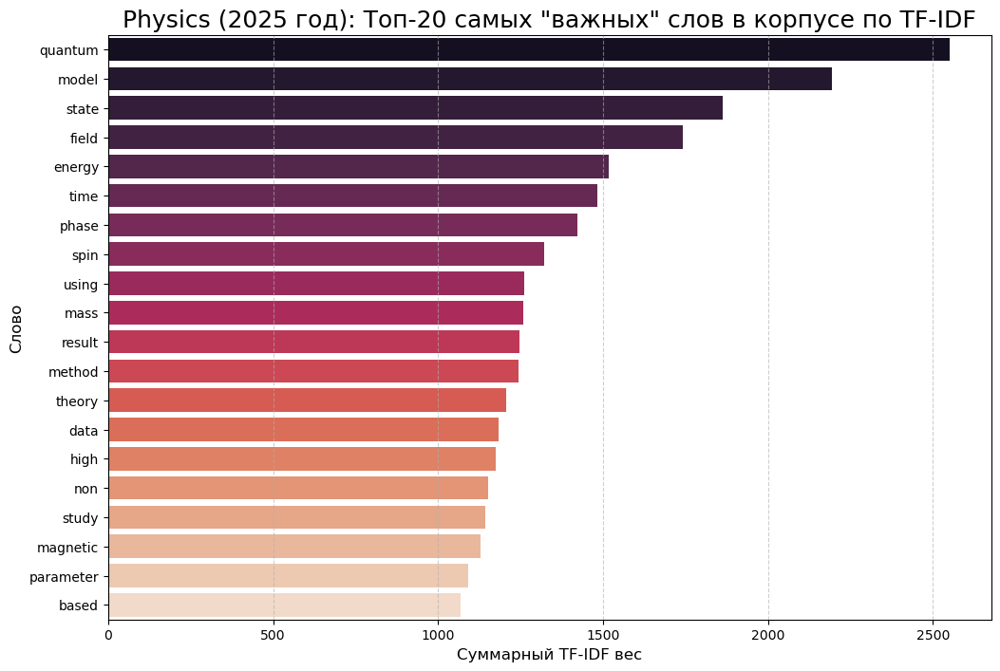

In [26]:
vectorizer_2025_ph, tfidf_matrix_2025_ph = create_tfidf_matrix(arxiv_2025_ph, title = "Physics (2025 год)")

Получившаяся матрица:    (0, 2494)	0.07275467647323206
  (0, 5453)	0.049994626523964115
  (0, 5686)	0.20953392262751797
  (0, 3073)	0.08340402165982302
  (0, 4933)	0.44788161455496694
  (0, 4595)	0.19559100205939994
  (0, 2436)	0.04445971095496037
  (0, 4036)	0.04901118526010782
  (0, 5064)	0.048975470022062734
  (0, 5385)	0.13974791635862055
  (0, 5687)	0.3435369951818343
  (0, 4596)	0.31302413909444304
  (0, 4270)	0.03868770905514322
  (0, 5738)	0.04406663768325206
  (0, 3049)	0.24289169635940253
  (0, 199)	0.04750943070821141
  (0, 2119)	0.06027665067747559
  (0, 3057)	0.04269656657699515
  (0, 1537)	0.10447734640874555
  (0, 5308)	0.02933606655188709
  (0, 1078)	0.04810150307130535
  (0, 4817)	0.06519700068646665
  (0, 1875)	0.08317638478260182
  (0, 4641)	0.048374212890923744
  (0, 3000)	0.039622878662163484
  :	:
  (3485, 4827)	0.06432972554407525
  (3485, 2409)	0.2717485441172053
  (3485, 3618)	0.08717649278164709
  (3485, 4326)	0.06358815523700247
  (3485, 5223)	0.0526612899716

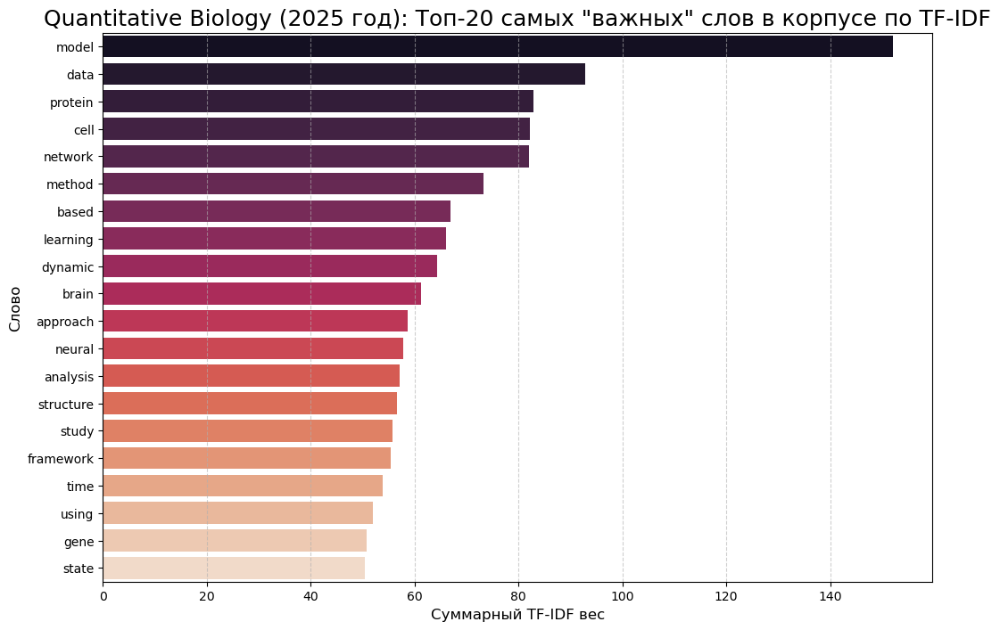

In [27]:
vectorizer_2025_qbio, tfidf_matrix_2025_qbio = create_tfidf_matrix(arxiv_2025_qbio, title = "Quantitative Biology (2025 год)")

Получившаяся матрица:    (0, 882)	0.244481931979694
  (0, 2077)	0.3490525229185863
  (0, 1976)	0.08150243326437401
  (0, 1052)	0.06870391000748684
  (0, 3428)	0.08748976689738208
  (0, 1800)	0.07969293183198972
  (0, 653)	0.045879208097278024
  (0, 3802)	0.04076245352830752
  (0, 264)	0.11964569818434717
  (0, 2494)	0.04900823961032455
  (0, 2006)	0.06947847117758586
  (0, 3989)	0.0835913493646859
  (0, 904)	0.15689465672851843
  (0, 3986)	0.04799142795447136
  (0, 2409)	0.0805675018049906
  (0, 3204)	0.06224104929268386
  (0, 674)	0.09093290275551252
  (0, 3066)	0.06908565725973108
  (0, 942)	0.04791003953391884
  (0, 2168)	0.03620971635343739
  (0, 220)	0.031061800582183063
  (0, 216)	0.05584279480889372
  (0, 69)	0.041755654770626975
  (0, 535)	0.08114451817971657
  (0, 406)	0.06200940038195596
  :	:
  (2106, 3192)	0.08001654098837636
  (2106, 3465)	0.07743800575093741
  (2106, 251)	0.0657096831331849
  (2106, 1147)	0.07932651201010536
  (2106, 1851)	0.06291847037498204
  (2106, 242

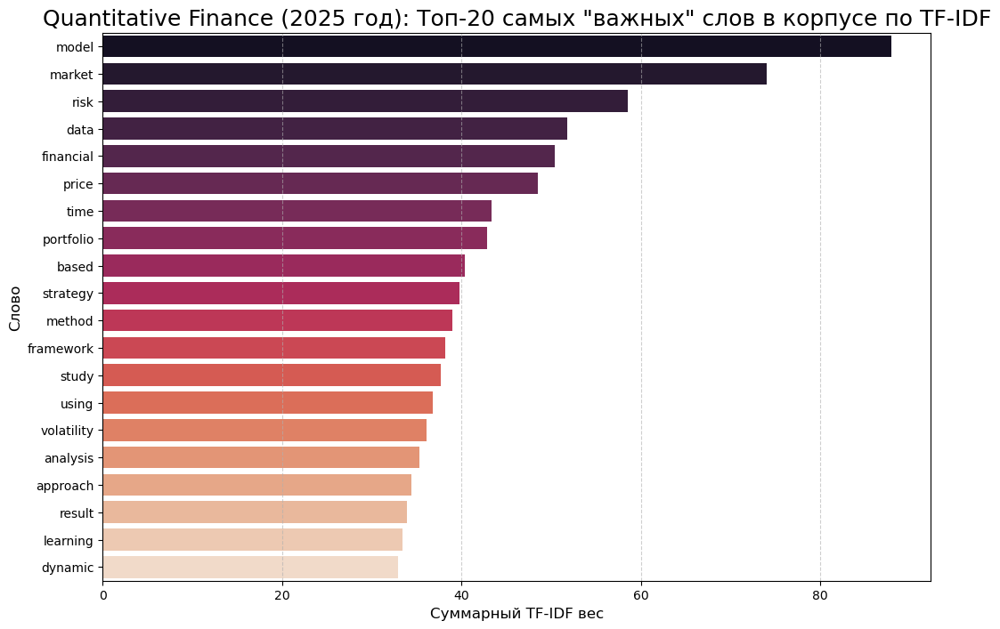

In [28]:
vectorizer_2025_qfin, tfidf_matrix_2025_qfin = create_tfidf_matrix(arxiv_2025_qfin, title = "Quantitative Finance (2025 год)")

Получившаяся матрица:    (0, 2093)	0.14859780727163013
  (0, 1244)	0.1305631641409062
  (0, 2957)	0.0621603242696093
  (0, 5514)	0.0378999233474697
  (0, 6779)	0.042031733546286934
  (0, 1698)	0.02499304632445903
  (0, 310)	0.03480237852248368
  (0, 4829)	0.1580763367355282
  (0, 380)	0.038582403423840325
  (0, 7666)	0.14630953643933486
  (0, 6311)	0.070565056360942
  (0, 2381)	0.07944390169709017
  (0, 2780)	0.0577512254083531
  (0, 4418)	0.05100960318868585
  (0, 2579)	0.08127197762915592
  (0, 3946)	0.18245073443133908
  (0, 6789)	0.4027134328766307
  (0, 2971)	0.08174032526980662
  (0, 6500)	0.0526142027540927
  (0, 5352)	0.09407020585453009
  (0, 5798)	0.05317982243622639
  (0, 7208)	0.037741130039575875
  (0, 5077)	0.03441374215258063
  (0, 5453)	0.0908201506836582
  (0, 4809)	0.03935396057905606
  :	:
  (10841, 7110)	0.07759095016508206
  (10841, 4864)	0.10670576650999697
  (10841, 2470)	0.07329118756356058
  (10841, 7659)	0.09020275779567448
  (10841, 7232)	0.08526458724098222


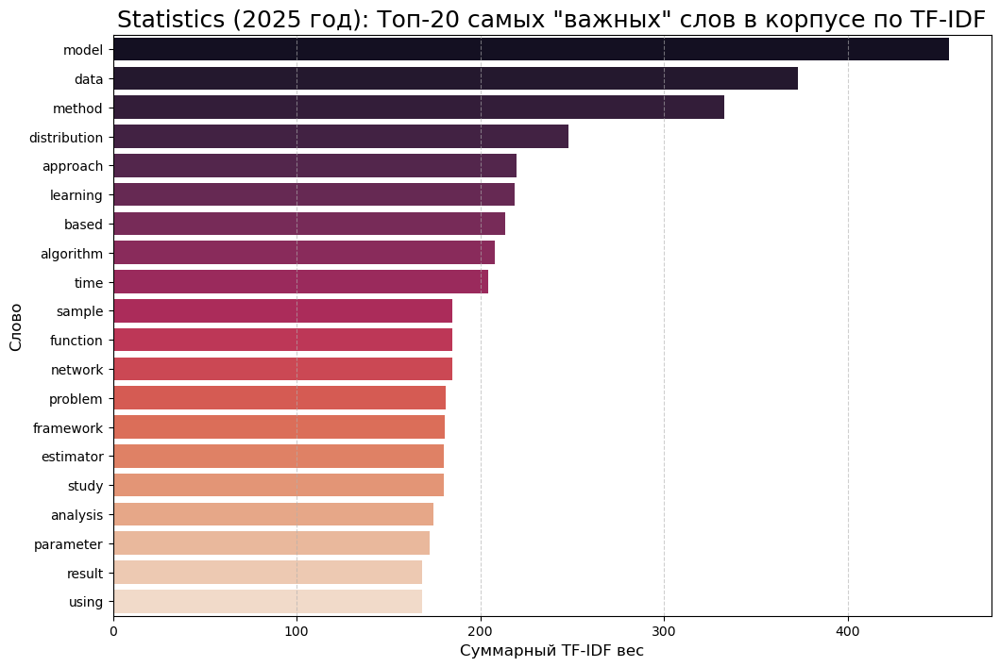

In [29]:
vectorizer_2025_stat, tfidf_matrix_2025_stat = create_tfidf_matrix(arxiv_2025_stat, title = "Statistics (2025 год)")

-----------

## Шаг 3: Обучение модели 

In [ ]:
# num_topics = 20
# nmf_model = NMF(n_components=num_topics, random_state=42)
# nmf_model.fit(tfidf_matrix)

In [30]:
def evaluate_coherence(df, vectorizer, tfidf_matrix, model_name='best_nmf_model.pkl'):
    texts = [doc.split() for doc in df['processed_abstract']]
    dictionary = Dictionary(texts)
    # фильтруем редкие и частые слова
    dictionary.filter_extremes(no_below=5, no_above=0.95)

    coherence_scores = []
    topic_range = range(5, 31, 5)
    
    best_coherence_score = -1
    best_nmf_model = None
    best_num_topics = 0

    for num_topics in tqdm(topic_range, desc="Calculating Coherence for NMF"):
        nmf_model = NMF(n_components=num_topics, init='nndsvd', random_state=RANDOM_STATE)
        nmf_model.fit(tfidf_matrix)

        topics = []
        feature_names = vectorizer.get_feature_names_out()
        for _, topic in enumerate(nmf_model.components_):
            top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]] # топ 10
            topics.append(top_words)

        cm = CoherenceModel(topics=topics, texts=texts, dictionary=dictionary, coherence='c_v')
        current_coherence = cm.get_coherence()
        coherence_scores.append(current_coherence)

        if current_coherence > best_coherence_score:
            best_coherence_score = current_coherence
            best_nmf_model = nmf_model
            # best_feature_names = feature_names
            best_num_topics = num_topics

    plt.figure(figsize=(10, 6))
    plt.plot(topic_range, coherence_scores, marker='o', linestyle='--')
    plt.title('Зависимость когерентности NMF от количества тем (C_v)')
    plt.xlabel('Количество тем')
    plt.ylabel('Coherence Score')
    plt.xticks(topic_range)
    plt.grid(True)
    plt.show()

    # -------------- сохранение лучшей модели ---------------
    os.makedirs("models", exist_ok=True)
    file_path = os.path.join("models", model_name)

    with open(file_path, 'wb') as f:
        pickle.dump(best_nmf_model, f)

    print(f"При оптимальном числе тем {best_num_topics}, score составил: {best_coherence_score}")
    return best_nmf_model, best_num_topics, best_coherence_score

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

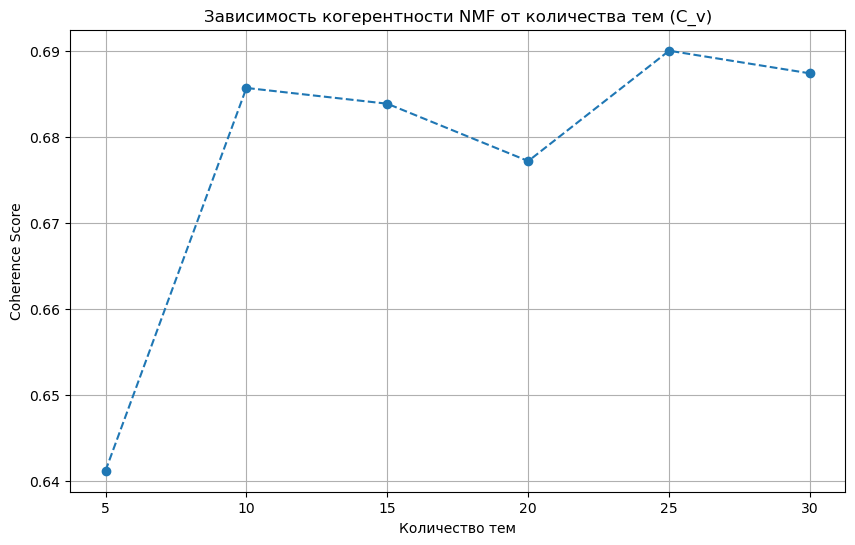

При оптимальном числе тем 25, score составил: 0.690037878725427


In [ ]:
"""
Все статьи за 2023-2024 год
"""
nmf_current, num_topics_current, coherence_score_current = evaluate_coherence(arxiv_current,
                                                                 vectorizer_current, 
                                                                 tfidf_matrix_current,
                                                                 model_name = "nmf_current.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

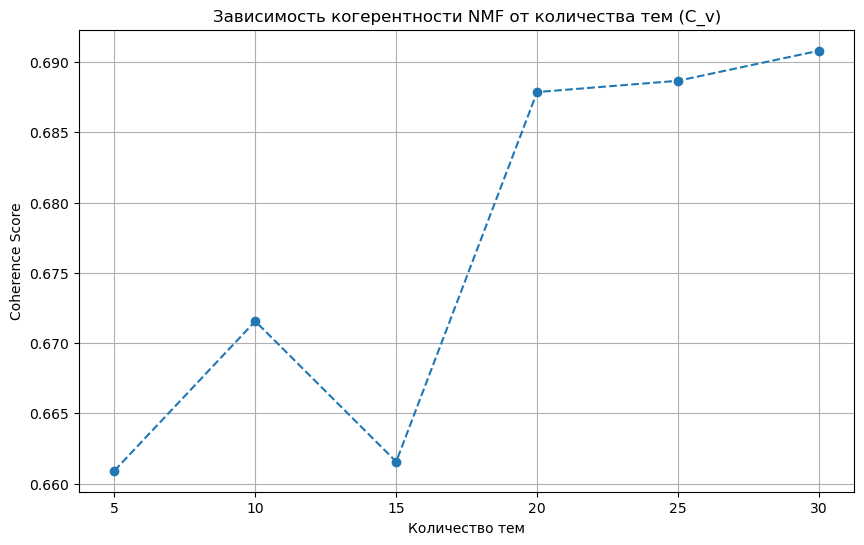

При оптимальном числе тем 30, score составил: 0.6908033957204557


In [ ]:
"""
Все статьи за 2025 год
"""

nmf_2025, num_topics_2025, coherence_score_2025 = evaluate_coherence(arxiv_2025,
                                                                 vectorizer_2025, 
                                                                 tfidf_matrix_2025,
                                                                 model_name = "nmf_2025.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

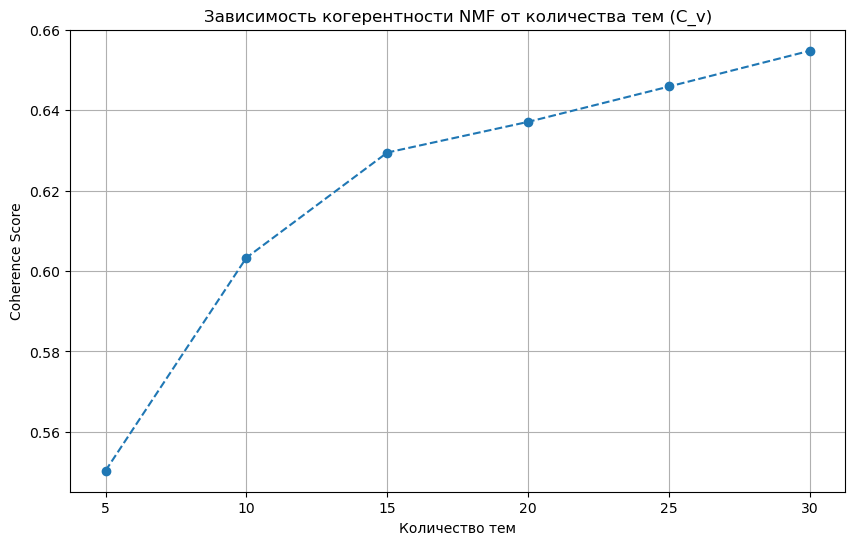

При оптимальном числе тем 30, score составил: 0.6547891243221498


In [ ]:
"""
Computer Science: 2025 год
"""
nmf_2025_cs, num_topics_2025_cs, coherence_score_cs = evaluate_coherence(arxiv_2025_cs,
                                                                 vectorizer_2025_cs, 
                                                                 tfidf_matrix_2025_cs,
                                                                 model_name = "nmf_2025_cs.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

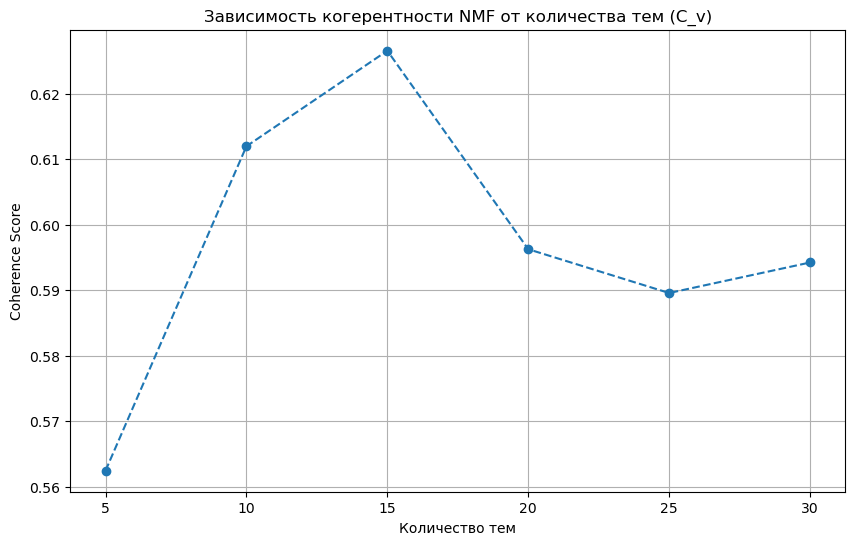

При оптимальном числе тем 15, score составил: 0.6265491131898568


In [ ]:
"""
Economics: 2025 год
"""
nmf_2025_econ, num_topics_2025_econ, coherence_score_econ = evaluate_coherence(arxiv_2025_econ,
                                                                 vectorizer_2025_econ, 
                                                                 tfidf_matrix_2025_econ,
                                                                 model_name = "nmf_2025_econ.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

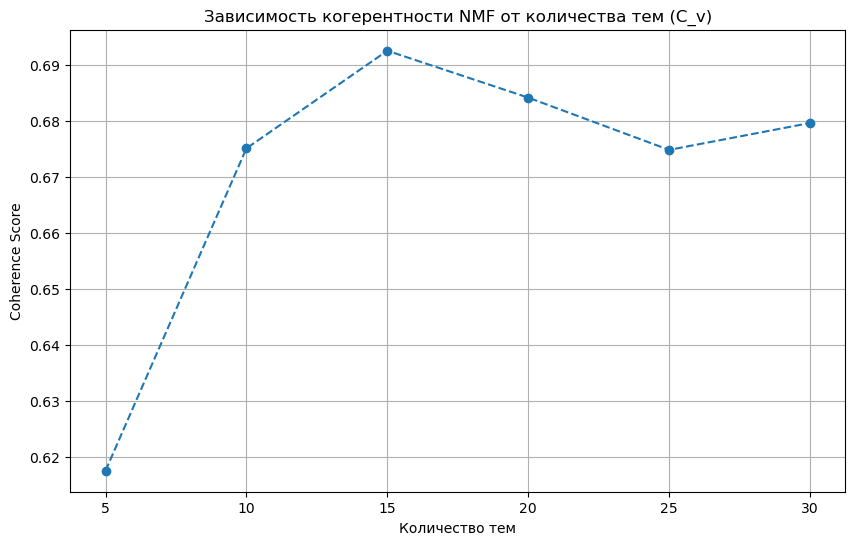

При оптимальном числе тем 15, score составил: 0.6925471763463326


In [ ]:
"""
Electrical Engineering and Systems Science: 2025 год
"""
nmf_2025_eess, num_topics_2025_eess, coherence_score_eess = evaluate_coherence(arxiv_2025_eess,
                                                                 vectorizer_2025_eess, 
                                                                 tfidf_matrix_2025_eess,
                                                                 model_name = "nmf_2025_eess.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

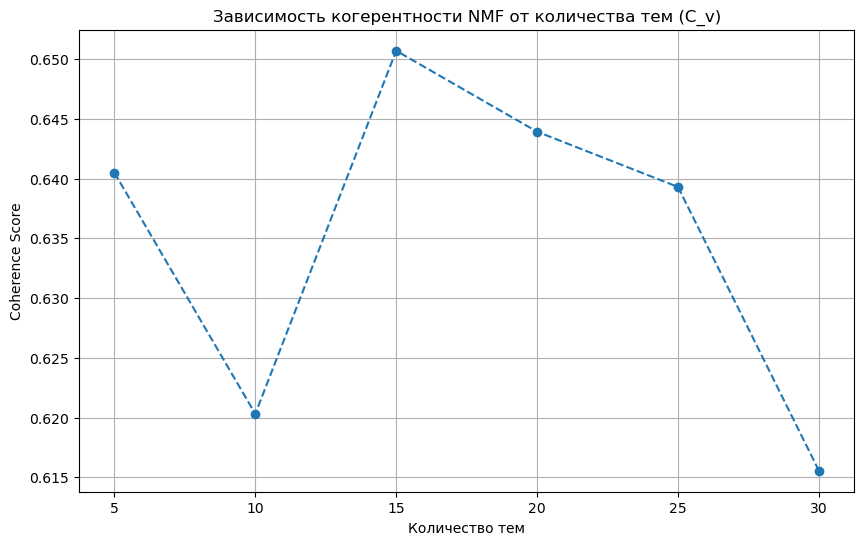

При оптимальном числе тем 15, score составил: 0.6506921070392856


In [ ]:
"""
Mathematics: 2025 год
"""
nmf_2025_math, num_topics_2025_math, coherence_score_math = evaluate_coherence(arxiv_2025_math,
                                                                 vectorizer_2025_math, 
                                                                 tfidf_matrix_2025_math,
                                                                 model_name = "nmf_2025_math.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

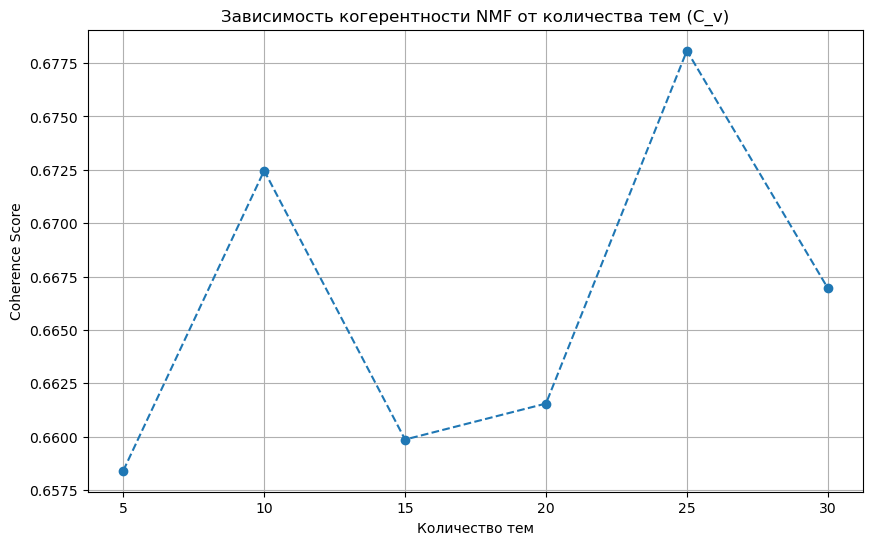

При оптимальном числе тем 25, score составил: 0.6780800563163383


In [37]:
"""
Physics: 2025 год
"""

nmf_2025_ph, num_topics_2025_ph, coherence_score_ph = evaluate_coherence(arxiv_2025_ph,
                                                                 vectorizer_2025_ph, 
                                                                 tfidf_matrix_2025_ph,
                                                                 model_name = "nmf_2025_ph.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

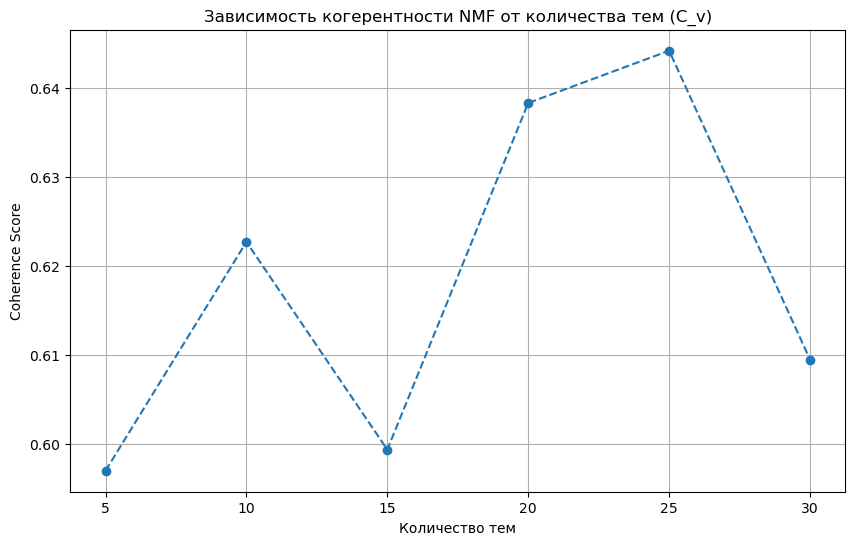

При оптимальном числе тем 25, score составил: 0.6441757719355259


In [38]:
"""
Quantitative Biology: 2025 год
"""
nmf_2025_qbio, num_topics_2025_qbio, coherence_score_qbio = evaluate_coherence(arxiv_2025_qbio,
                                                                 vectorizer_2025_qbio, 
                                                                 tfidf_matrix_2025_qbio,
                                                                 model_name = "nmf_2025_qbio.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

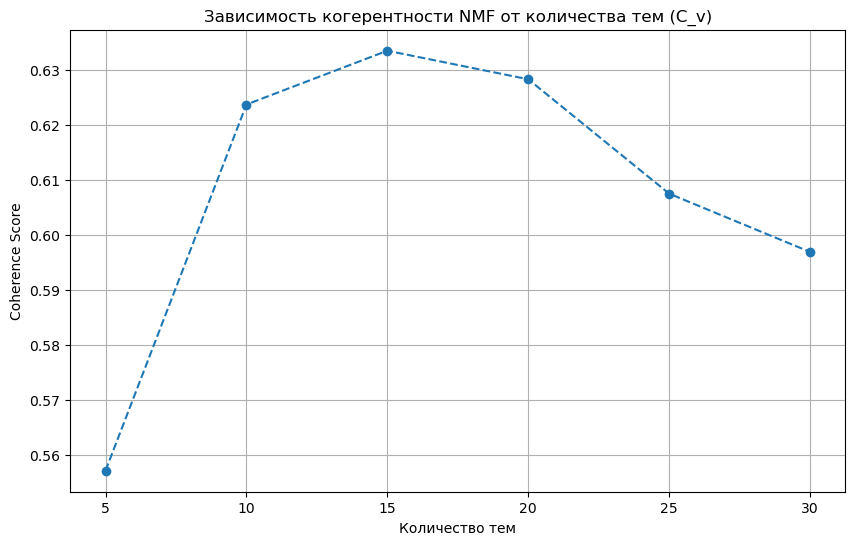

При оптимальном числе тем 15, score составил: 0.6334911198394424


In [39]:
"""
Quantitative Finance: 2025 год
"""
nmf_2025_qfin, num_topics_2025_qfin, coherence_score_qfin = evaluate_coherence(arxiv_2025_qfin,
                                                                 vectorizer_2025_qfin, 
                                                                 tfidf_matrix_2025_qfin,
                                                                 model_name = "nmf_2025_qfin.pkl")

Calculating Coherence for NMF:   0%|          | 0/6 [00:00<?, ?it/s]

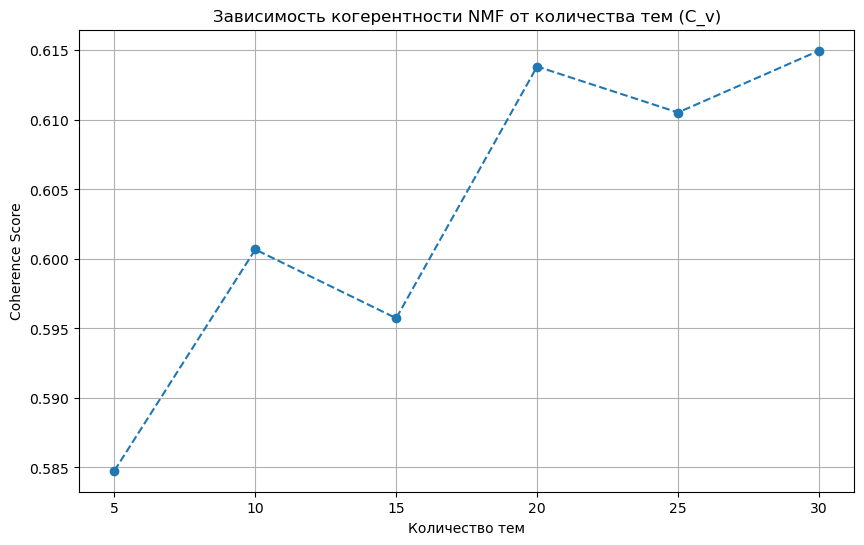

При оптимальном числе тем 30, score составил: 0.6149743318175062


In [40]:
"""
Statistics: 2025 год
"""
nmf_2025_stat, num_topics_2025_stat, coherence_score_stat = evaluate_coherence(arxiv_2025_stat,
                                                                 vectorizer_2025_stat, 
                                                                 tfidf_matrix_2025_stat,
                                                                 model_name = "nmf_2025_stat.pkl")

------


## Шаг 4: Интерпретация и визуализация тем

In [41]:
def display_topics(model, feature_names, num_top_words, title = None):
    print(f"{title}: {num_top_words} слов к каждой теме (гиперпараметр)")
    for topic_idx, topic in enumerate(model.components_):
        print(f"Тема №{topic_idx+1}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-num_top_words - 1:-1]]))

In [42]:
feature_names_current = vectorizer_current.get_feature_names_out()
display_topics(nmf_current, feature_names_current, 10, title="Статьи за 2023-2024 года")

Статьи за 2023-2024 года: 10 слов к каждой теме (гиперпараметр)
Тема №1:
data privacy synthetic learning machine analysis training real datasets research
Тема №2:
function distribution bound matrix random error estimator probability sample gaussian
Тема №3:
phase spin transition temperature state topological material symmetry electron interaction
Тема №4:
llm language large task reasoning prompt code human gpt knowledge
Тема №5:
quantum state classical circuit entanglement qubit gate qubits computing measurement
Тема №6:
image text diffusion segmentation quality medical generation visual resolution method
Тема №7:
graph node vertex edge gnns gnn number structure tree knowledge
Тема №8:
robot object human scene motion environment real world task pose
Тема №9:
star galaxy mass stellar cluster formation disk emission sim observation
Тема №10:
group algebra space theory symmetry operator lie finite manifold representation
Тема №11:
user communication channel design device power signal base

In [43]:
feature_names_2025 = vectorizer_2025.get_feature_names_out()
display_topics(nmf_2025, feature_names_2025, 10, title="Статьи за 2025 год")

Статьи за 2025 год: 10 слов к каждой теме (гиперпараметр)
Тема №1:
model language training fine parameter trained performance tuning large prediction
Тема №2:
phase transition temperature topological material state symmetry band lattice mode
Тема №3:
llm language large prompt task evaluation human fine gpt capability
Тема №4:
problem algorithm optimization optimal convergence constraint method convex gradient objective
Тема №5:
quantum classical circuit state entanglement qubit gate computing qubits measurement
Тема №6:
image diffusion text quality visual generation medical prompt segmentation imaging
Тема №7:
agent multi environment game action decision agentic framework autonomous marl
Тема №8:
graph vertex edge node gnns number gnn structure tree subgraph
Тема №9:
data privacy synthetic datasets real training dataset domain world quality
Тема №10:
energy dark matter neutrino particle mass decay photon quark detector
Тема №11:
learning task training policy reward reinforcement machin

In [44]:
feature_names_2025_cs = vectorizer_2025_cs.get_feature_names_out()
display_topics(nmf_2025_cs, feature_names_2025_cs, 10, title="Computer Science (2025 год)")

Computer Science (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
medical clinical segmentation patient disease imaging diagnosis diagnostic accuracy healthcare
Тема №2:
llm language large prompt response human evaluation text context gpt
Тема №3:
image text prompt resolution quality editing generated clip method style
Тема №4:
agent multi task environment game action agentic interaction framework decision
Тема №5:
reasoning cot chain step thought capability model benchmark answer thinking
Тема №6:
graph node gnns edge structure gnn vertex structural knowledge relationship
Тема №7:
video frame temporal motion content long audio understanding generation action
Тема №8:
problem algorithm function bound method optimization optimal numerical linear approximation
Тема №9:
memory energy resource inference device efficiency token computational quantization edge
Тема №10:
research human study tool analysis review development future student evaluation
Тема №11:
attack adversarial defe

In [45]:
feature_names_2025_econ = vectorizer_2025_econ.get_feature_names_out()
display_topics(nmf_2025_econ, feature_names_2025_econ, 10, title="Economics (2025 год)")

Economics (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
model data learning method approach forecasting factor machine forecast variable
Тема №2:
estimator test parameter sample inference method distribution asymptotic estimation function
Тема №3:
optimal mechanism buyer auction seller value problem design item platform
Тема №4:
llm human language large decision behavior experiment task gpt model
Тема №5:
treatment effect causal outcome inference average estimator difference unit assumption
Тема №6:
game player equilibrium nash strategy payoff concept play form solution
Тема №7:
price market consumer product firm demand cost pricing increase competition
Тема №8:
energy carbon emission renewable hydrogen electricity cost climate environmental production
Тема №9:
risk market financial portfolio return asset volatility stock investor bank
Тема №10:
agent contract learning principal equilibrium information action rational type setting
Тема №11:
rule preference choice voting se

In [46]:
feature_names_2025_eess = vectorizer_2025_eess.get_feature_names_out()
display_topics(nmf_2025_eess, feature_names_2025_eess, 10, title="Electrical Engineering and Systems Science (2025 год)")

Electrical Engineering and Systems Science (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
robot vehicle safety environment motion real agent autonomous trajectory planning
Тема №2:
model data learning training network deep classification performance neural detection
Тема №3:
speech language asr llm text model recognition tt token emotion
Тема №4:
control controller nonlinear stability mpc dynamic disturbance loop predictive state
Тема №5:
energy power grid load battery consumption network cost resource device
Тема №6:
audio music visual video sound text generation task language model
Тема №7:
antenna array user pinching beamforming position multiple mimo beam waveguide
Тема №8:
image diffusion reconstruction quality resolution imaging method compression high model
Тема №9:
sensing communication isac target integrated radar network wireless design beamforming
Тема №10:
ri reconfigurable surface intelligent riss element phase assisted star shift
Тема №11:
channel csi estimati

In [47]:
feature_names_2025_math = vectorizer_2025_math.get_feature_names_out()
display_topics(nmf_2025_math, feature_names_2025_math, 10, title="Mathematics (2025 год)")

Mathematics (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
method problem algorithm optimization convergence numerical gradient proposed optimal convex
Тема №2:
group subgroup finite action representation gamma abelian class automorphism element
Тема №3:
graph vertex edge number tree connected cycle set degree bound
Тема №4:
alpha omega lambda frac beta delta gamma left right infty
Тема №5:
model data network learning dynamic framework neural based approach state
Тема №6:
mathcal mathrm let set infty leq subset mathbf cap geq
Тема №7:
equation solution boundary time existence differential condition wave nonlinear initial
Тема №8:
algebra lie mathfrak module quantum representation structure graded hopf dimensional
Тема №9:
mathbb mathrm let time subset infty mathfrak geq leq set
Тема №10:
random matrix distribution measure bound process probability gaussian limit time
Тема №11:
operator space function spectral hilbert weighted inequality kernel property banach
Тема №12:
mani

In [48]:
feature_names_2025_ph = vectorizer_2025_ph.get_feature_names_out()
display_topics(nmf_2025_ph, feature_names_2025_ph, 10, title="Physics (2025 год)")

Physics (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
material temperature property electronic structure surface film band layer metal
Тема №2:
disk planet dust gas accretion line emission inner protoplanetary observation
Тема №3:
quantum classical entanglement information computing algorithm computer mechanic resource protocol
Тема №4:
equation solution function problem method operator differential matrix time nonlinear
Тема №5:
black hole horizon mass hawking schwarzschild accretion entropy gravitational gravity
Тема №6:
quark qcd collision meson decay mass heavy bar hadron production
Тема №7:
photon optical mode cavity frequency light laser photonic pulse single
Тема №8:
spin orbit coupling interaction orbital polarization current hall magnon polarized
Тема №9:
dark matter axion model cosmological energy cdm mass lambda universe
Тема №10:
theory field scalar gravity gauge model tensor inflation effective coupling
Тема №11:
symmetry breaking group chiral gauge mathbb bro

In [49]:
feature_names_2025_qbio = vectorizer_2025_qbio.get_feature_names_out()
display_topics(nmf_2025_qbio, feature_names_2025_qbio, 10, title="Quantitative Biology (2025 год)")

Quantitative Biology (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
learning task performance prediction representation model feature training deep transformer
Тема №2:
protein structure sequence structural prediction design binding folding residue function
Тема №3:
cell single cellular type seq scrna tissue differentiation cluster omics
Тема №4:
model parameter identifiability inference data diffusion estimation equation used time
Тема №5:
dynamic reaction state stochastic transition process energy phase equation simulation
Тема №6:
gene expression regulatory grn genetic perturbation spatial transcriptomics regulation disease
Тема №7:
drug molecule molecular target discovery ligand design generation chemical screening
Тема №8:
patient disease clinical risk study outcome data causal treatment feature
Тема №9:
llm language reasoning agent large model task knowledge scientific prompt
Тема №10:
data analysis method research omics challenge tool biological scientific review
Тем

In [50]:
feature_names_2025_qfin = vectorizer_2025_qfin.get_feature_names_out()
display_topics(nmf_2025_qfin, feature_names_2025_qfin, 10, title="Quantitative Finance (2025 год)")

Quantitative Finance (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
model data learning financial forecasting network performance prediction method deep
Тема №2:
llm human language financial large decision sentiment agent analysis task
Тема №3:
economic policy effect income impact study growth country research social
Тема №4:
portfolio variance security trade return markowitz volume random series consecutive
Тема №5:
market price stock information dynamic trading strategy investor trader asset
Тема №6:
optimal problem control strategy stochastic solution utility function process optimization
Тема №7:
volatility factor model implied calibration signature stochastic return dynamic surface
Тема №8:
risk measure credit default insurance value management financial portfolio var
Тема №9:
liquidity fee arbitrage transaction maker provider loss block provision amm
Тема №10:
firm network product supply production chain systemic level consumer economy
Тема №11:
option pricing model m

In [51]:
feature_names_2025_stat = vectorizer_2025_stat.get_feature_names_out()
display_topics(nmf_2025_stat, feature_names_2025_stat, 10, title="Statistics (2025 год)")

Statistics (2025 год): 10 слов к каждой теме (гиперпараметр)
Тема №1:
method approach proposed existing high based computational real estimation novel
Тема №2:
treatment effect outcome trial average covariates heterogeneity estimate patient individual
Тема №3:
estimator estimation asymptotic parameter variance likelihood mean sample bias inference
Тема №4:
optimization function problem gradient algorithm convergence convex loss objective stochastic
Тема №5:
risk event survival patient disease study clinical analysis measure population
Тема №6:
test statistic testing hypothesis power null sample procedure value control
Тема №7:
sampling algorithm monte carlo mcmc chain markov sampler sample target
Тема №8:
network neural layer deep architecture node training weight activation structure
Тема №9:
prediction conformal coverage set interval calibration confidence guarantee conditional score
Тема №10:
time series forecasting change forecast dynamic point process temporal state
Тема №11:
lear

--------------

## Шаг 5: Детектирование трендов

In [66]:
def create_heatmap(model, tfidf_matrix, df, title=None):
    topic_results = model.transform(tfidf_matrix)
    df['dominant_topic'] = topic_results.argmax(axis=1)
    trends = df.groupby(['year', 'dominant_topic']).size().unstack(fill_value=0)
    trends_normalized = trends.div(trends.sum(axis=1), axis=0) * 100
    trends_normalized.columns = [f'Тема {i+1}' for i in trends_normalized.columns]
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(trends_normalized.T, 
                cmap='BuPu', 
                annot=True, 
                fmt='.1f',
                cbar_kws={'label': 'Доля публикаций (%)'})
    
    plt.title(f'{title}: Heatmap популярности тем', fontsize=16)
    plt.xlabel('Год')
    plt.ylabel('Тема')
    plt.tight_layout()
    plt.show()

In [ ]:
# очень лень думать как оставить одну универсальную функцию......
# главное, что работает
def create_heatmap_2025(model, tfidf_matrix, df, title=None):
    topic_results = model.transform(tfidf_matrix)
    df['dominant_topic'] = topic_results.argmax(axis=1)
    trends = df.groupby(['year_month', 'dominant_topic']).size().unstack(fill_value=0)
    trends_normalized = trends.div(trends.sum(axis=1), axis=0) * 100
    trends_normalized.columns = [f'Тема {i+1}' for i in trends_normalized.columns]
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(trends_normalized.T, 
                cmap='BuPu', 
                annot=True, 
                fmt='.1f',
                cbar_kws={'label': 'Доля публикаций (%)'})
    
    plt.title(f'{title}: Heatmap популярности тем', fontsize=16)
    plt.xlabel('Год')
    plt.ylabel('Тема')
    plt.tight_layout()
    plt.show()

In [ ]:
def create_trends(model, tfidf_matrix, df, num_topics=5, title=None):
    topic_results = model.transform(tfidf_matrix)
    df['dominant_topic'] = topic_results.argmax(axis=1)
    trends = df.groupby(['year', 'dominant_topic']).size().unstack(fill_value=0)
    trends_normalized = trends.div(trends.sum(axis=1), axis=0) * 100
    
    plt.figure(figsize=(14, 8))
    
    # не все темы, топ 5
    top_topics = trends_normalized.mean().sort_values(ascending=False).head(num_topics).index
    
    for topic in top_topics:
        plt.plot(trends_normalized.index, trends_normalized[topic], 
                label=f'Тема {topic+1}', linewidth=2, marker='o')
    
    plt.title(f'{title}: Динамика ключевых тем', fontsize=16)
    plt.xlabel('Год')
    plt.ylabel('Доля публикаций (%)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# лень делать одну универсальную функцию
# для 2025 года тренды анализируем по месяцам
def create_trends_2025(model, tfidf_matrix, df, num_topics=5, title=None):
    topic_results = model.transform(tfidf_matrix)
    df['dominant_topic'] = topic_results.argmax(axis=1)
    trends = df.groupby(['year_month', 'dominant_topic']).size().unstack(fill_value=0)
    trends_normalized = trends.div(trends.sum(axis=1), axis=0) * 100
    
    plt.figure(figsize=(14, 8))
    
    # не все темы, топ 5
    top_topics = trends_normalized.mean().sort_values(ascending=False).head(num_topics).index
    
    for topic in top_topics:
        plt.plot(trends_normalized.index, trends_normalized[topic], 
                label=f'Тема {topic+1}', linewidth=2, marker='o')
    
    plt.title(f'{title}: Динамика ключевых тем', fontsize=16)
    plt.xlabel('Год')
    plt.ylabel('Доля публикаций (%)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

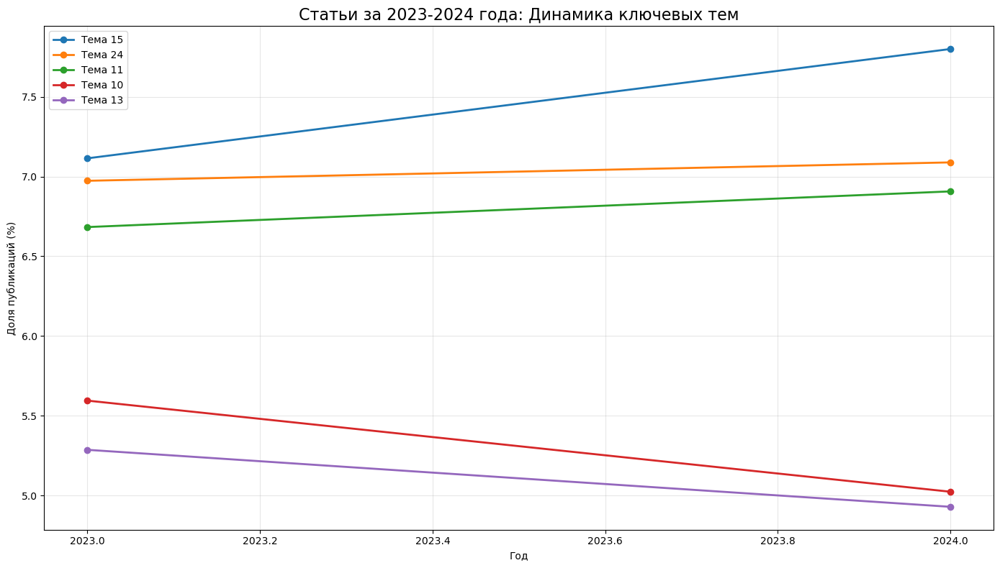

In [57]:
create_trends(nmf_current, tfidf_matrix_current, arxiv_current, title = "Статьи за 2023-2024 года")

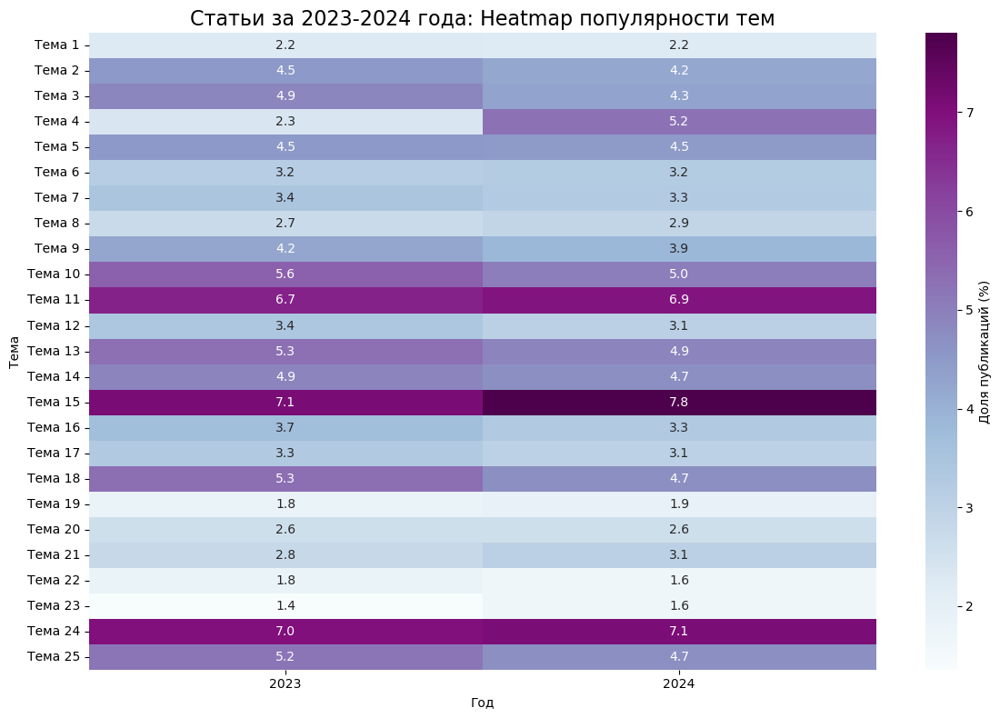

In [67]:
create_heatmap(nmf_current, tfidf_matrix_current, arxiv_current, title = "Статьи за 2023-2024 года")

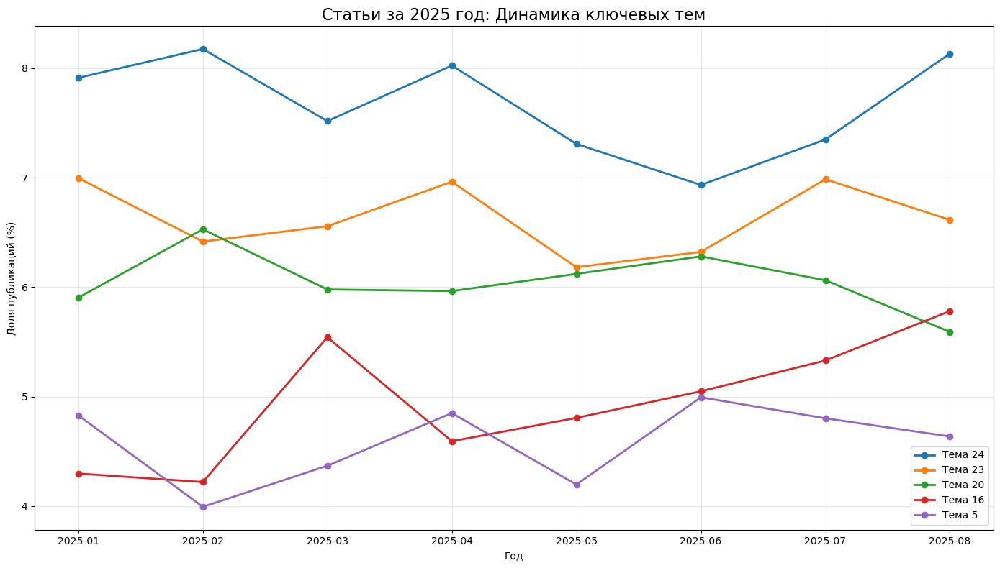

In [70]:
create_trends_2025(nmf_2025, tfidf_matrix_2025, arxiv_2025, title = "Статьи за 2025 год")

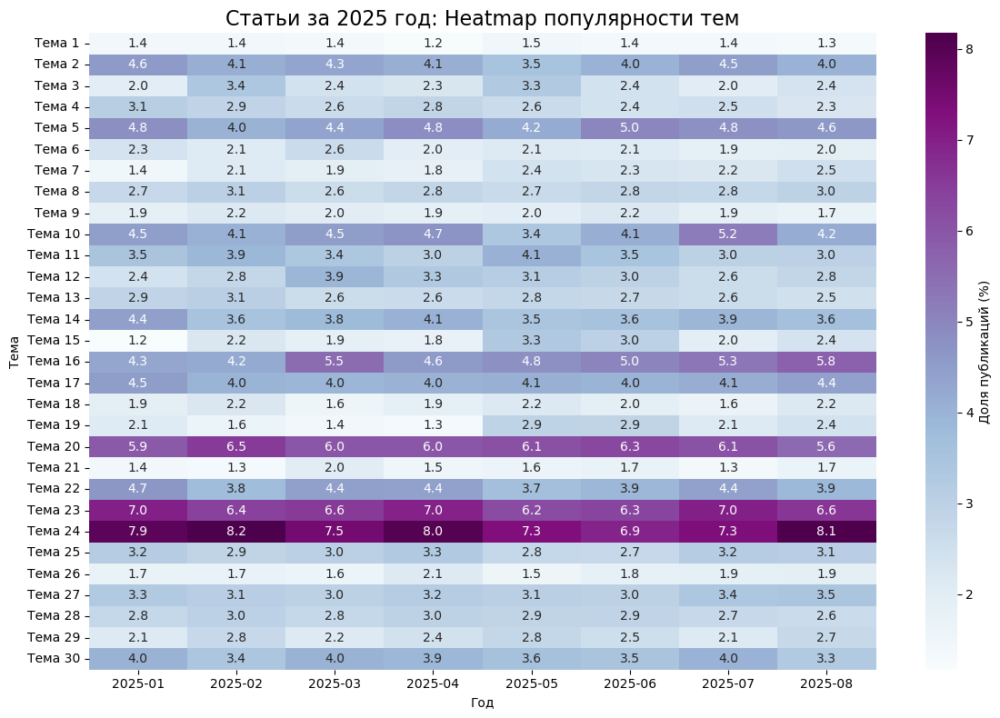

In [72]:
create_heatmap_2025(nmf_2025, tfidf_matrix_2025, arxiv_2025, title = "Статьи за 2025 год")

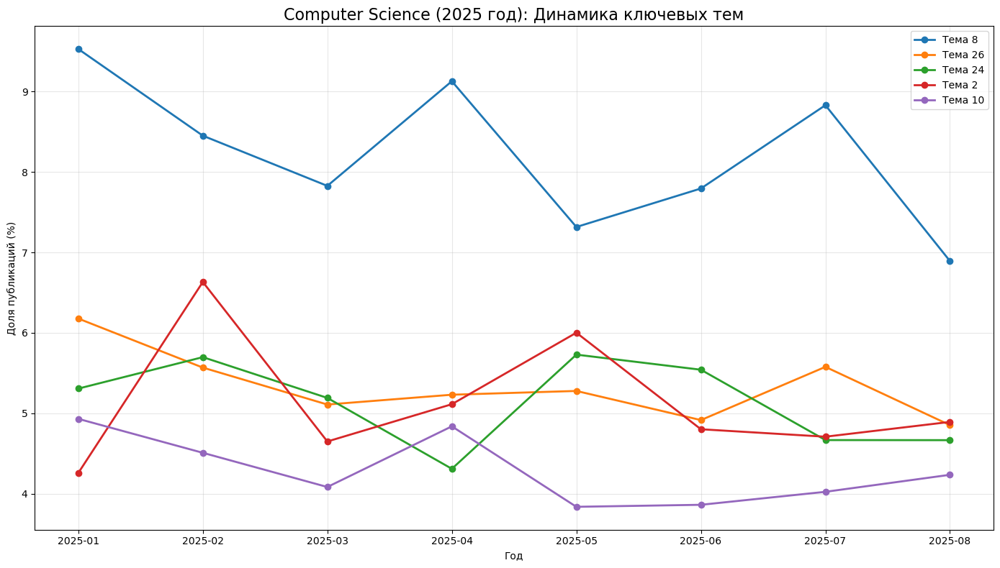

In [73]:
create_trends_2025(nmf_2025_cs, tfidf_matrix_2025_cs, arxiv_2025_cs, title = "Computer Science (2025 год)")

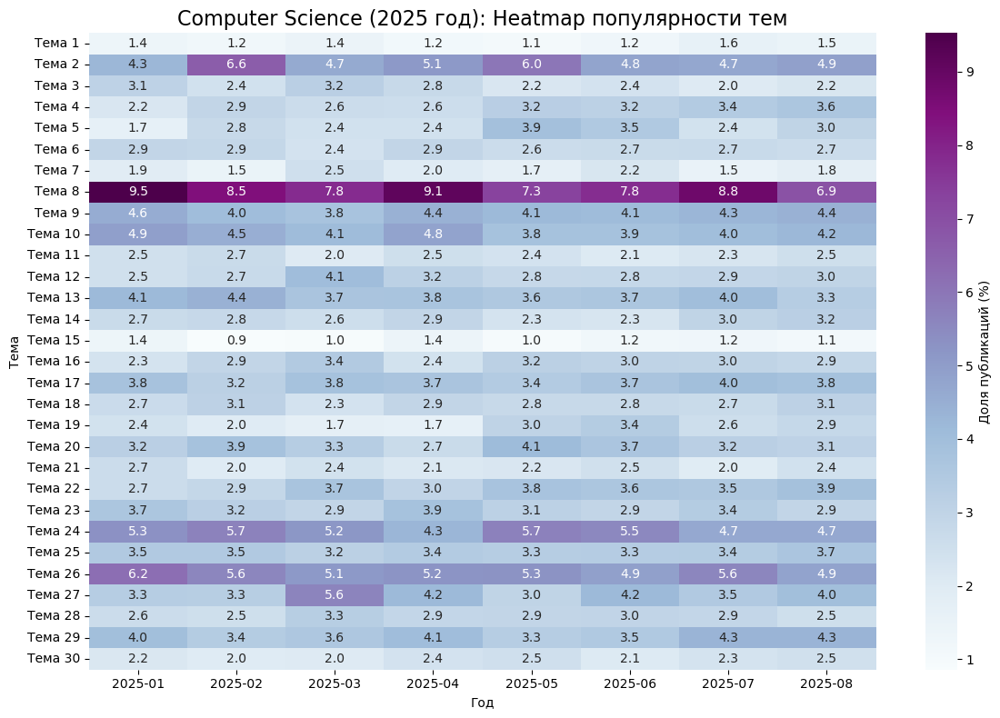

In [74]:
create_heatmap_2025(nmf_2025_cs, tfidf_matrix_2025_cs, arxiv_2025_cs, title = "Computer Science (2025 год)")

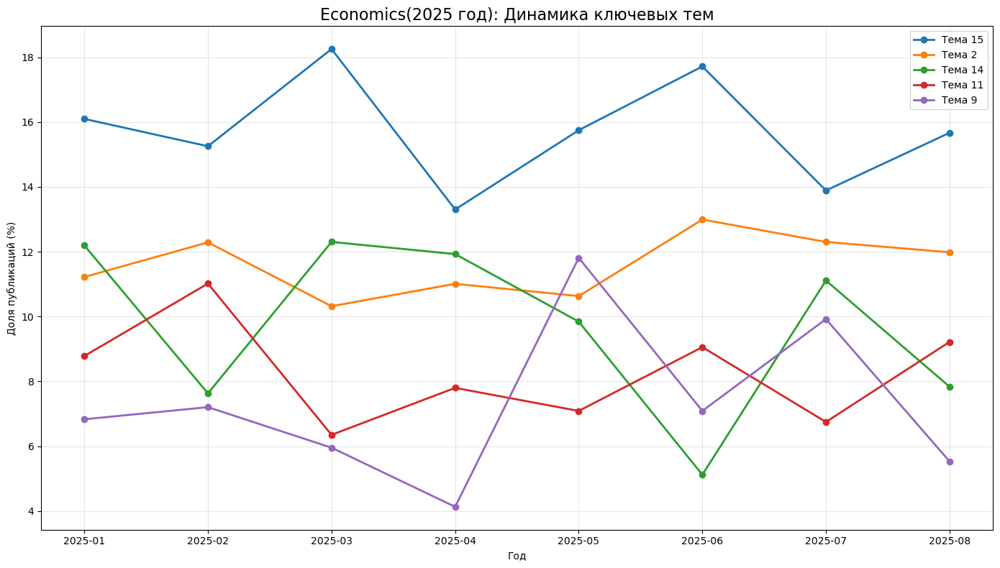

In [77]:
create_trends_2025(nmf_2025_econ, tfidf_matrix_2025_econ, arxiv_2025_econ, title = "Economics(2025 год)")

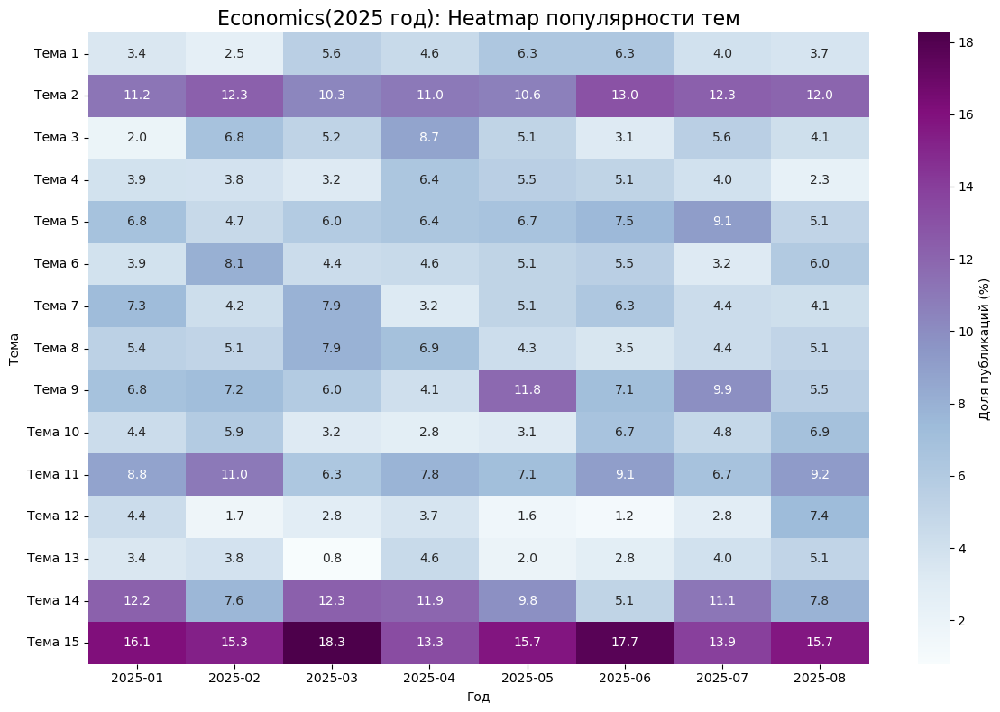

In [78]:
create_heatmap_2025(nmf_2025_econ, tfidf_matrix_2025_econ, arxiv_2025_econ, title = "Economics(2025 год)")

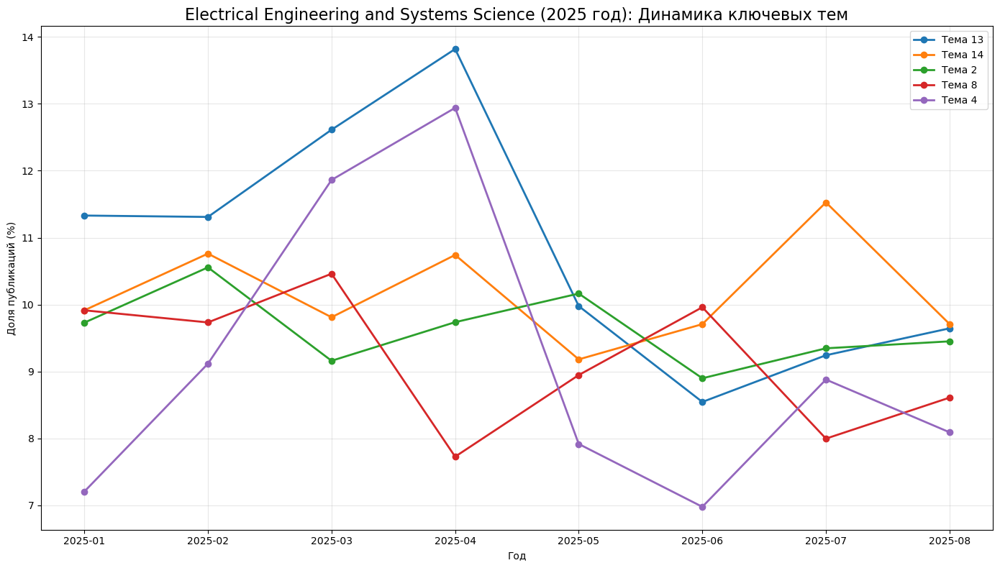

In [79]:
create_trends_2025(nmf_2025_eess, tfidf_matrix_2025_eess, arxiv_2025_eess, 
              title = "Electrical Engineering and Systems Science (2025 год)")

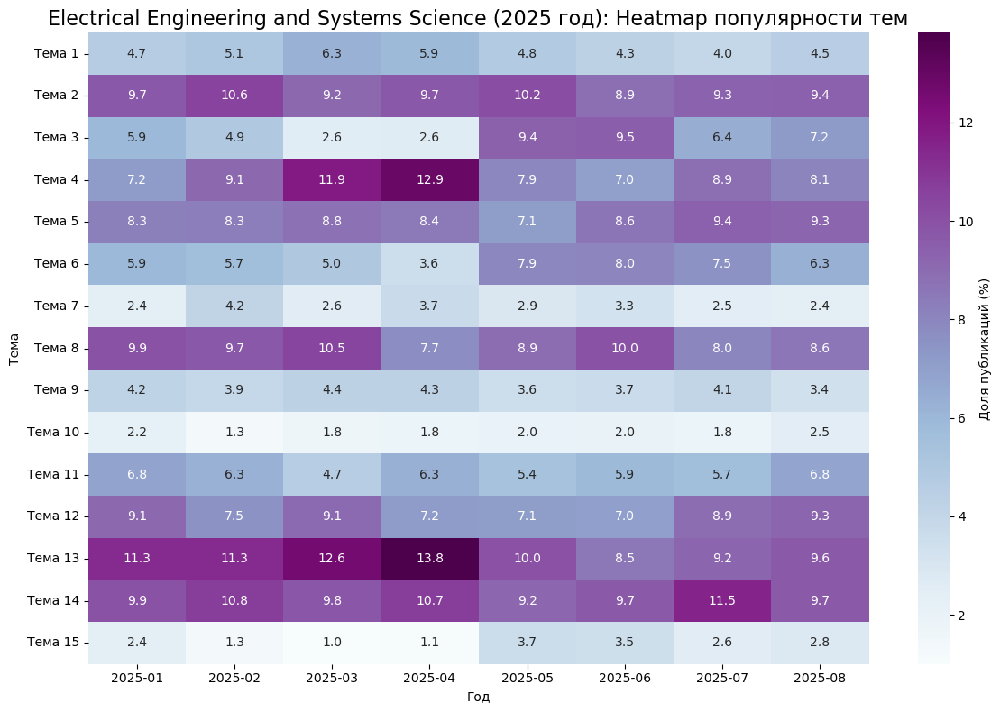

In [80]:
create_heatmap_2025(nmf_2025_eess, tfidf_matrix_2025_eess, arxiv_2025_eess, 
              title = "Electrical Engineering and Systems Science (2025 год)")

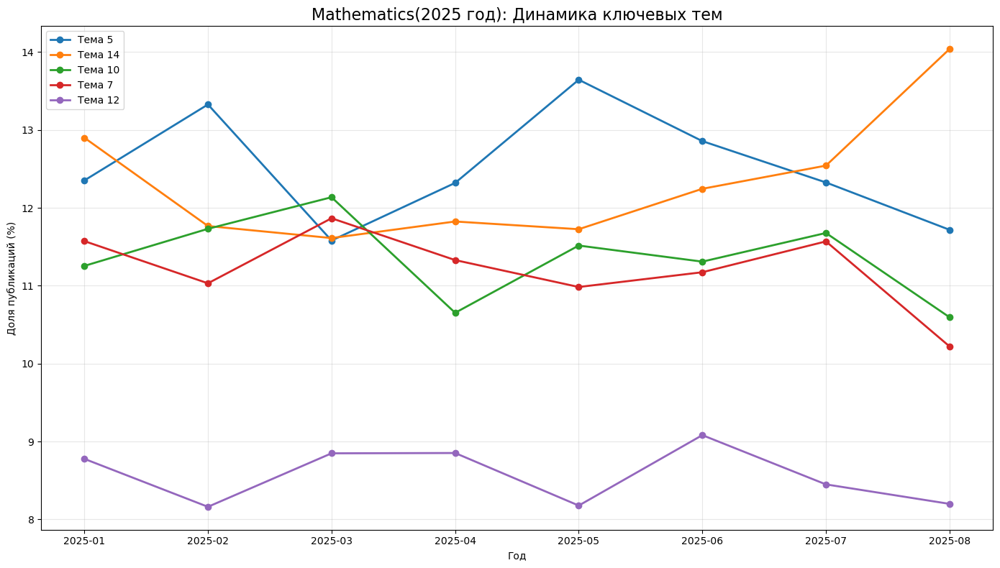

In [81]:
create_trends_2025(nmf_2025_math, tfidf_matrix_2025_math, arxiv_2025_math, 
              title = "Mathematics(2025 год)")

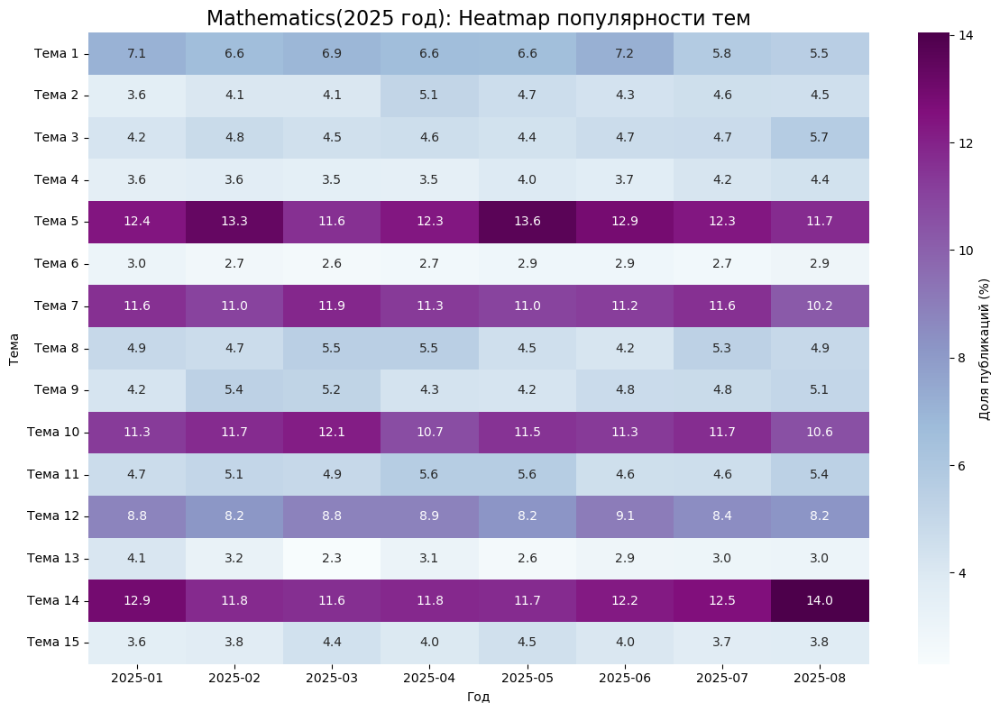

In [82]:
create_heatmap_2025(nmf_2025_math, tfidf_matrix_2025_math, arxiv_2025_math, 
              title = "Mathematics(2025 год)")

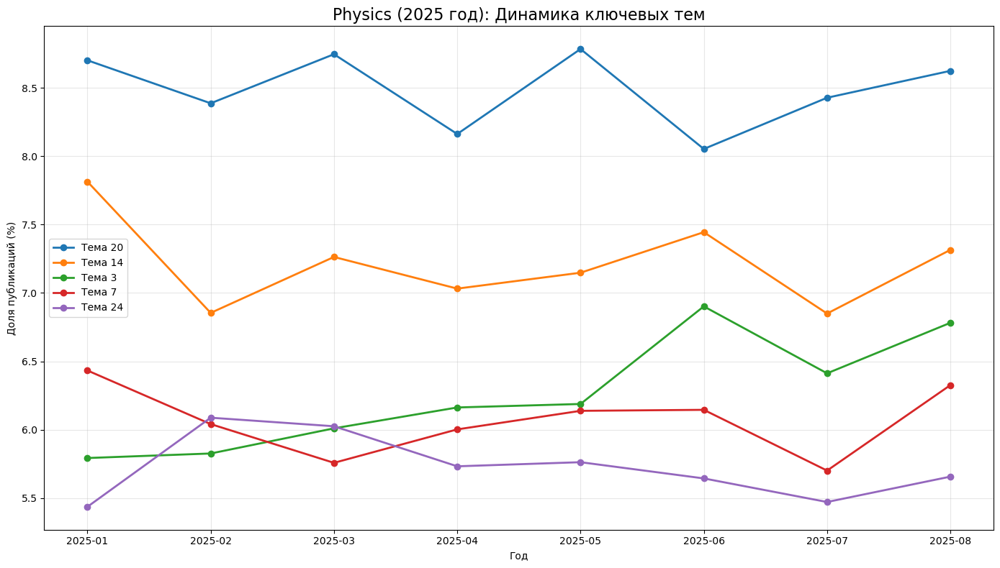

In [83]:
create_trends_2025(nmf_2025_ph, tfidf_matrix_2025_ph, arxiv_2025_ph, title = "Physics (2025 год)")

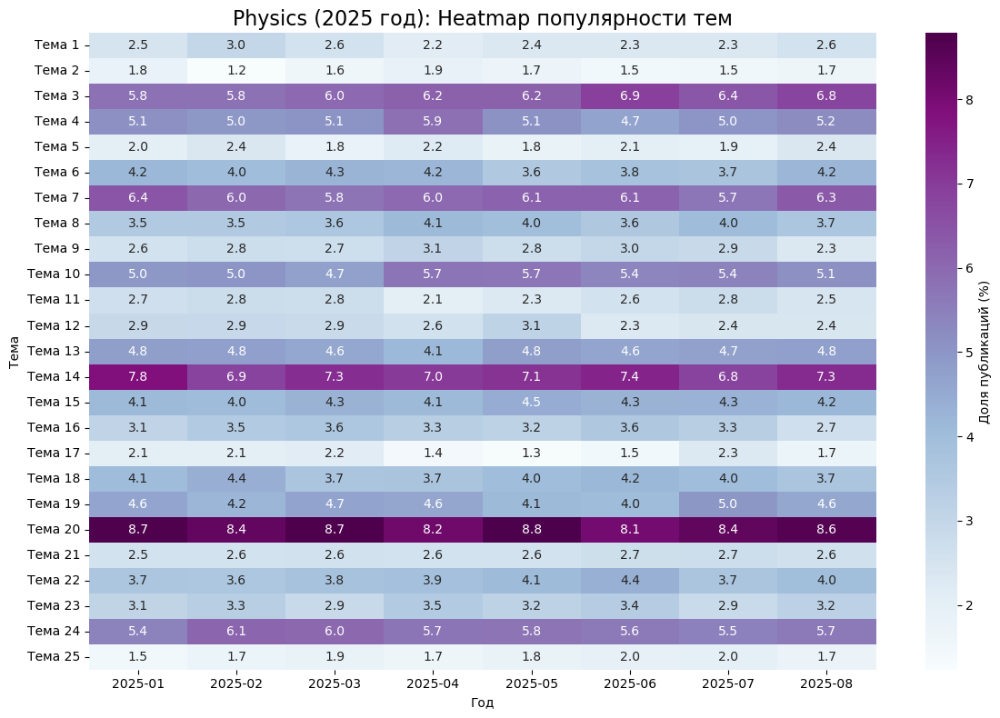

In [84]:
create_heatmap_2025(nmf_2025_ph, tfidf_matrix_2025_ph, arxiv_2025_ph, title = "Physics (2025 год)")

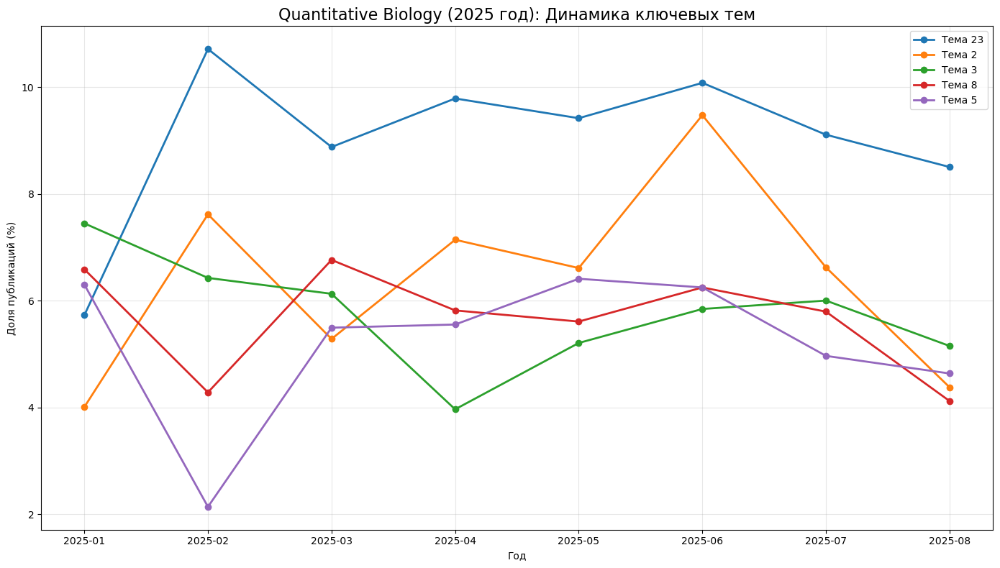

In [85]:
create_trends_2025(nmf_2025_qbio, tfidf_matrix_2025_qbio, arxiv_2025_qbio, title = "Quantitative Biology (2025 год)")

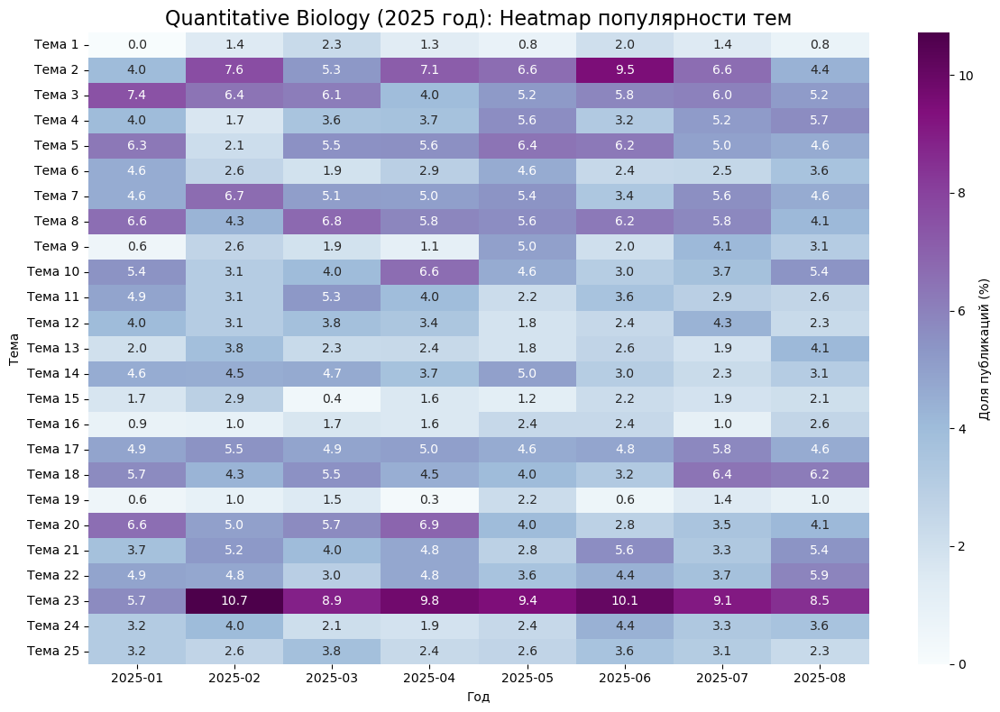

In [86]:
create_heatmap_2025(nmf_2025_qbio, tfidf_matrix_2025_qbio, arxiv_2025_qbio, title = "Quantitative Biology (2025 год)")

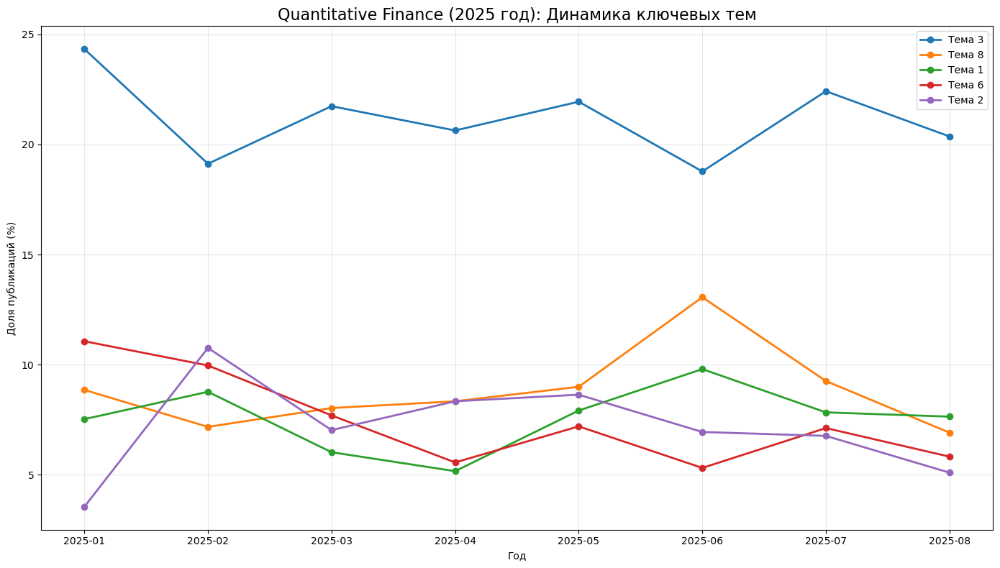

In [87]:
create_trends_2025(nmf_2025_qfin, tfidf_matrix_2025_qfin, arxiv_2025_qfin, title = "Quantitative Finance (2025 год)")

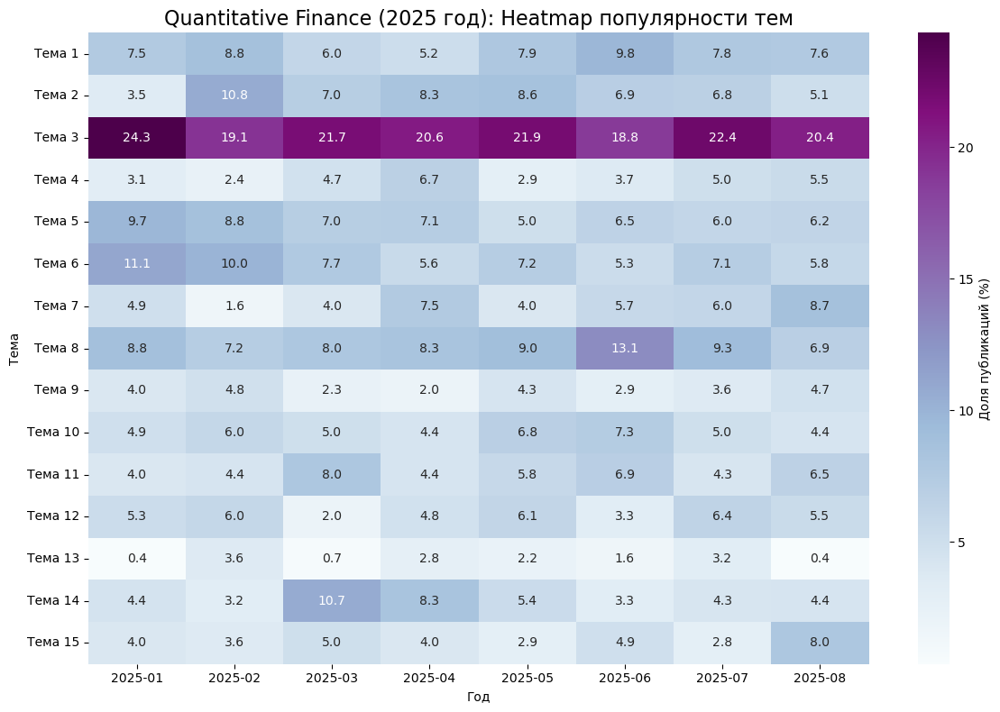

In [88]:
create_heatmap_2025(nmf_2025_qfin, tfidf_matrix_2025_qfin, arxiv_2025_qfin, title = "Quantitative Finance (2025 год)")

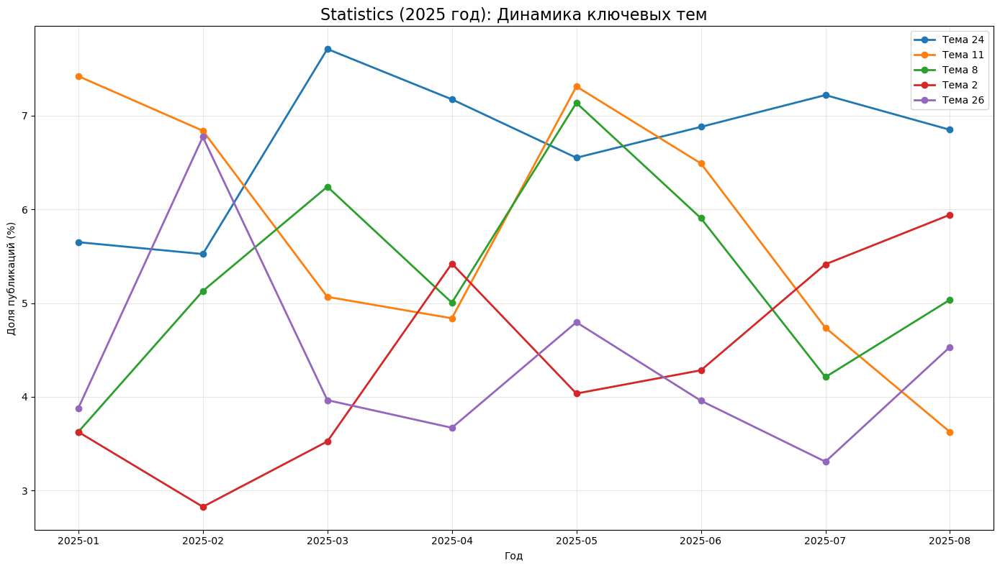

In [89]:
create_trends_2025(nmf_2025_stat, tfidf_matrix_2025_stat, arxiv_2025_stat, title = "Statistics (2025 год)")

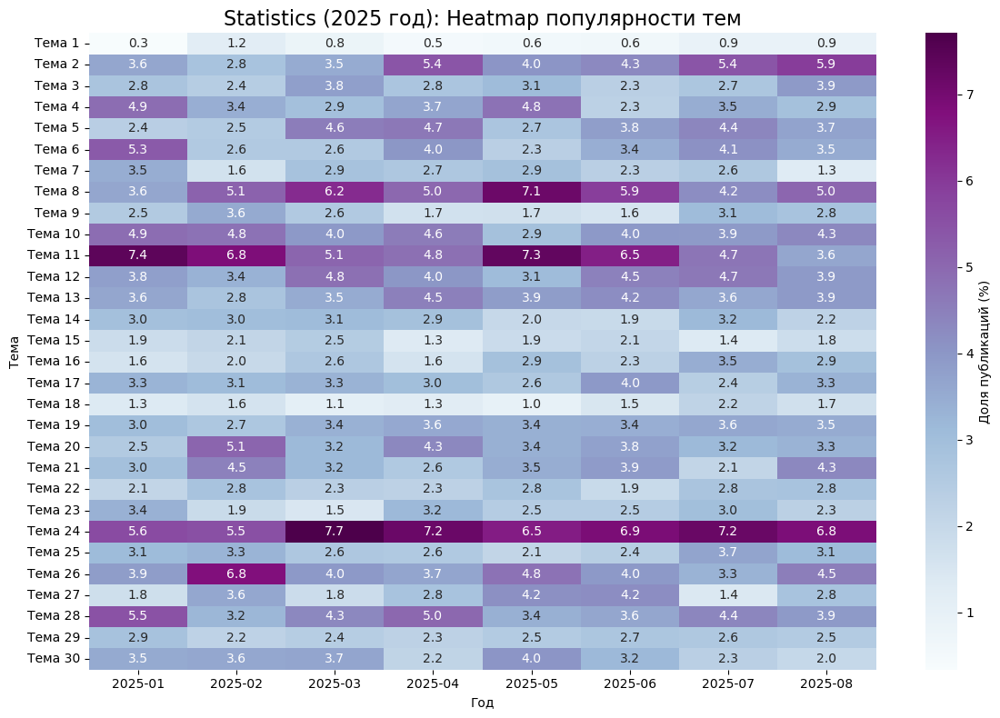

In [90]:
create_heatmap_2025(nmf_2025_stat, tfidf_matrix_2025_stat, arxiv_2025_stat, title = "Statistics (2025 год)")

--------------------

# LDA: Topic Modeling

In [9]:
def create_count_matrix(df, title=None):
    count_vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
    count_matrix = count_vectorizer.fit_transform(df['processed_abstract'])
    
    print("Получившаяся матрица: ", count_matrix)
    print(f"Размер матрицы (shape): {count_matrix.shape}")
    print(f"Количество ненулевых элементов (nnz): {count_matrix.nnz}")

    density = (count_matrix.nnz / (count_matrix.shape[0] * count_matrix.shape[1])) * 100
    print(f"Плотность матрицы: {density:.6f}%")
    feature_names = count_vectorizer.get_feature_names_out()

    total_count_scores = np.asarray(count_matrix.sum(axis=0)).ravel()

    df_count = pd.DataFrame({
        'word': feature_names,
        'count_score': total_count_scores
    })

    df_count_top20 = df_count.sort_values(by='count_score', ascending=False).head(20)

    plt.figure(figsize=(12, 8))
    sns.barplot(
        x='count_score',
        y='word',
        data=df_count_top20,
        palette='viridis'
    )

    plt.title(f'{title}: Топ-20 самых частых слов в корпусе', fontsize=18)
    plt.xlabel('Суммарная частота', fontsize=12)
    plt.ylabel('Слово', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.show()
    
    return count_vectorizer, count_matrix

Получившаяся матрица:    (0, 75886)	1
  (0, 43608)	4
  (0, 83118)	6
  (0, 4846)	1
  (0, 82939)	4
  (0, 59803)	1
  (0, 83134)	1
  (0, 11072)	1
  (0, 79189)	2
  (0, 36538)	1
  (0, 35796)	1
  (0, 76874)	1
  (0, 27004)	1
  (0, 65520)	2
  (0, 36663)	2
  (0, 5041)	1
  (0, 25050)	1
  (0, 74160)	1
  (0, 27533)	1
  (0, 900)	1
  (0, 79160)	3
  (0, 37849)	1
  (0, 34894)	1
  (0, 18324)	1
  (0, 78259)	1
  :	:
  (847403, 10767)	1
  (847403, 36972)	1
  (847403, 23605)	1
  (847403, 79398)	1
  (847403, 68267)	1
  (847403, 23624)	1
  (847403, 53799)	1
  (847403, 21940)	1
  (847403, 20886)	1
  (847403, 75945)	1
  (847403, 71652)	3
  (847403, 25171)	1
  (847403, 15410)	1
  (847403, 79303)	1
  (847403, 10421)	1
  (847403, 13618)	2
  (847403, 10365)	1
  (847403, 81443)	1
  (847403, 36774)	1
  (847403, 8220)	1
  (847403, 924)	1
  (847403, 51832)	1
  (847403, 4897)	1
  (847403, 76636)	1
  (847403, 39644)	1
Размер матрицы (shape): (847404, 87488)
Количество ненулевых элементов (nnz): 60545843
Плотность матрицы

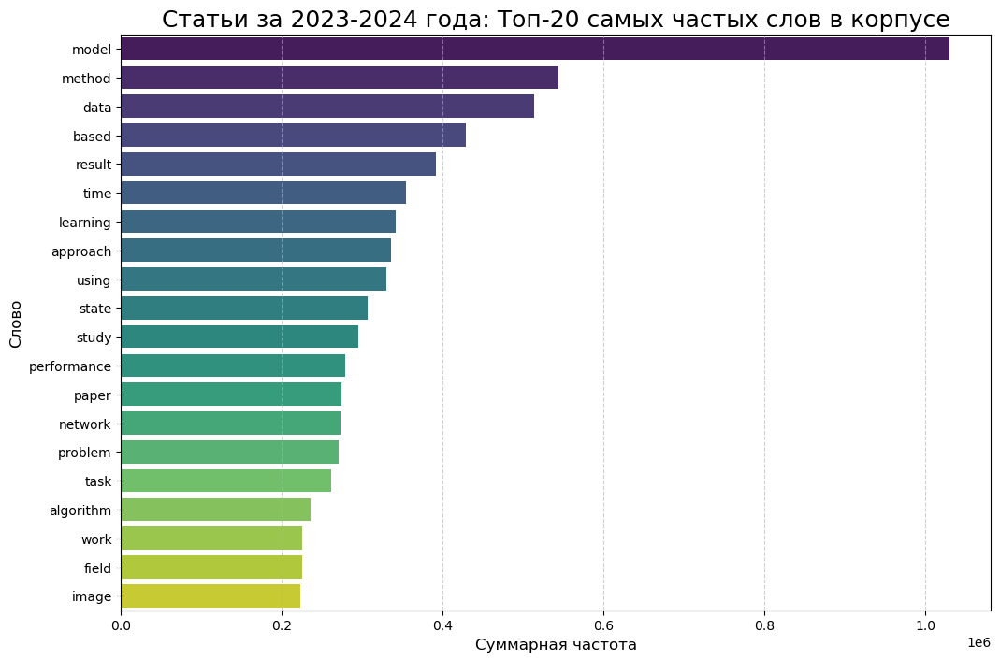

In [10]:
count_vectorizer_current, count_matrix_current = create_count_matrix(arxiv_current, title= "Статьи за 2023-2024 года")

Получившаяся матрица:    (0, 44845)	1
  (0, 2454)	5
  (0, 47890)	2
  (0, 44081)	1
  (0, 18023)	1
  (0, 44297)	1
  (0, 30076)	1
  (0, 25761)	1
  (0, 25729)	1
  (0, 30055)	4
  (0, 26800)	3
  (0, 19471)	1
  (0, 12120)	1
  (0, 23698)	1
  (0, 23292)	1
  (0, 18327)	1
  (0, 5969)	2
  (0, 22104)	1
  (0, 30117)	2
  (0, 14646)	1
  (0, 35526)	1
  (0, 14633)	1
  (0, 19295)	1
  (0, 16938)	1
  (0, 26775)	1
  :	:
  (330687, 40931)	1
  (330687, 33918)	1
  (330687, 46194)	1
  (330687, 8260)	1
  (330687, 8936)	1
  (330687, 23065)	1
  (330687, 50552)	1
  (330687, 3115)	1
  (330687, 31810)	1
  (330687, 12164)	1
  (330687, 52901)	3
  (330687, 6181)	1
  (330687, 9322)	1
  (330687, 15200)	1
  (330687, 714)	2
  (330687, 52903)	3
  (330687, 23191)	1
  (330687, 38082)	1
  (330687, 31942)	1
  (330687, 25244)	1
  (330687, 51682)	1
  (330687, 23788)	1
  (330687, 15572)	1
  (330687, 53377)	1
  (330687, 7372)	1
Размер матрицы (shape): (330688, 54293)
Количество ненулевых элементов (nnz): 25294486
Плотность матрицы: 

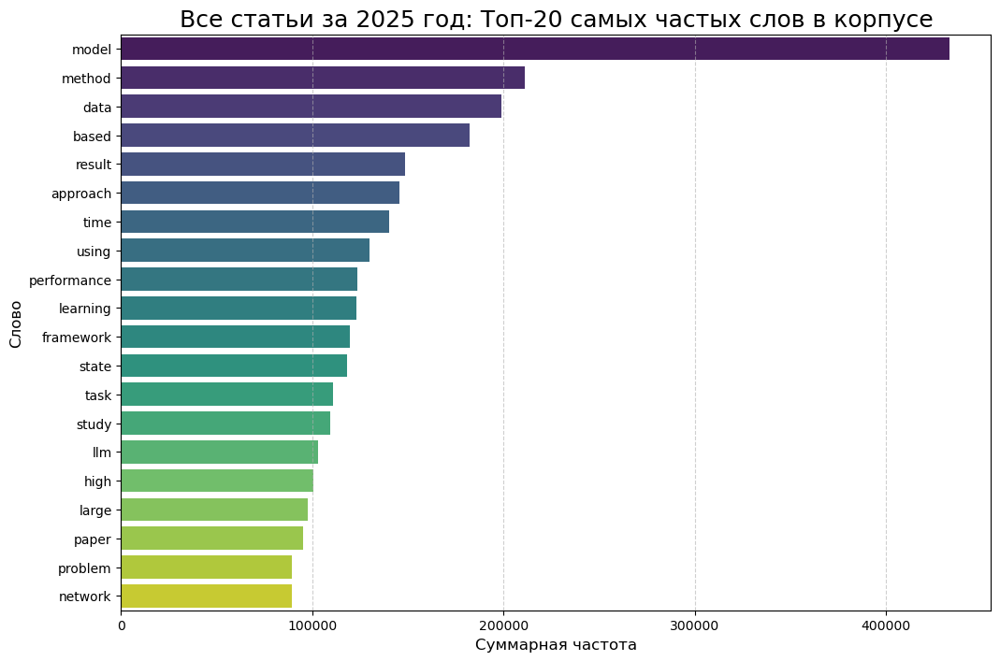

In [11]:
count_vectorizer_2025, count_matrix_2025 = create_count_matrix(arxiv_2025, title = "Все статьи за 2025 год")

Получившаяся матрица:    (0, 26529)	1
  (0, 1511)	5
  (0, 28292)	2
  (0, 26048)	1
  (0, 11114)	1
  (0, 26188)	1
  (0, 17881)	1
  (0, 15407)	1
  (0, 15388)	1
  (0, 17863)	4
  (0, 15996)	3
  (0, 11879)	1
  (0, 7427)	1
  (0, 14421)	1
  (0, 14143)	1
  (0, 11272)	1
  (0, 3424)	2
  (0, 13298)	1
  (0, 17916)	2
  (0, 9003)	1
  (0, 20907)	1
  (0, 8993)	1
  (0, 11764)	1
  (0, 10430)	1
  (0, 15981)	1
  :	:
  (156160, 10985)	1
  (156160, 29101)	4
  (156160, 29847)	1
  (156160, 1934)	1
  (156160, 18728)	1
  (156160, 7452)	1
  (156160, 31394)	3
  (156160, 3554)	1
  (156160, 5596)	1
  (156160, 9360)	1
  (156160, 27663)	1
  (156160, 480)	2
  (156160, 31396)	3
  (156160, 14062)	1
  (156160, 22444)	1
  (156160, 27337)	1
  (156160, 18859)	1
  (156160, 15194)	1
  (156160, 30634)	1
  (156160, 14493)	1
  (156160, 9560)	1
  (156160, 18776)	1
  (156160, 20900)	1
  (156160, 31661)	1
  (156160, 4220)	1
Размер матрицы (shape): (156161, 32122)
Количество ненулевых элементов (nnz): 13195626
Плотность матрицы: 0.26

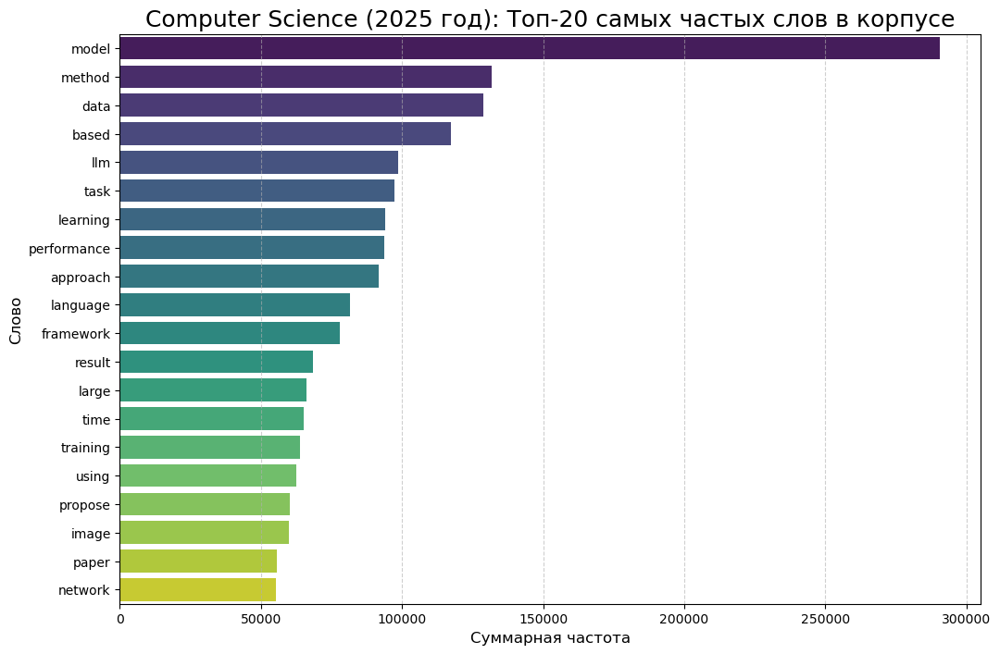

In [12]:
count_vectorizer_2025_cs, count_matrix_2025_cs = create_count_matrix(arxiv_2025_cs, title = "Computer Science (2025 год)")

Получившаяся матрица:    (0, 1757)	1
  (0, 1844)	1
  (0, 1969)	1
  (0, 1967)	1
  (0, 2223)	1
  (0, 2041)	3
  (0, 339)	2
  (0, 3125)	1
  (0, 3561)	1
  (0, 1966)	1
  (0, 1804)	1
  (0, 3035)	1
  (0, 3753)	1
  (0, 97)	1
  (0, 273)	9
  (0, 1231)	1
  (0, 2825)	3
  (0, 2105)	2
  (0, 722)	2
  (0, 2103)	1
  (0, 2720)	1
  (0, 3291)	1
  (0, 96)	1
  (0, 620)	1
  (0, 2470)	1
  :	:
  (1887, 3292)	1
  (1887, 303)	1
  (1887, 2136)	1
  (1887, 3674)	1
  (1887, 834)	1
  (1887, 2132)	1
  (1887, 1679)	1
  (1887, 267)	1
  (1887, 1309)	1
  (1887, 2141)	1
  (1887, 1921)	1
  (1887, 3724)	1
  (1887, 565)	1
  (1887, 712)	1
  (1887, 922)	1
  (1887, 2049)	1
  (1887, 217)	1
  (1887, 3808)	1
  (1887, 1630)	1
  (1887, 3636)	1
  (1887, 771)	1
  (1887, 274)	1
  (1887, 2913)	1
  (1887, 2612)	1
  (1887, 2801)	2
Размер матрицы (shape): (1888, 3819)
Количество ненулевых элементов (nnz): 122150
Плотность матрицы: 1.694111%


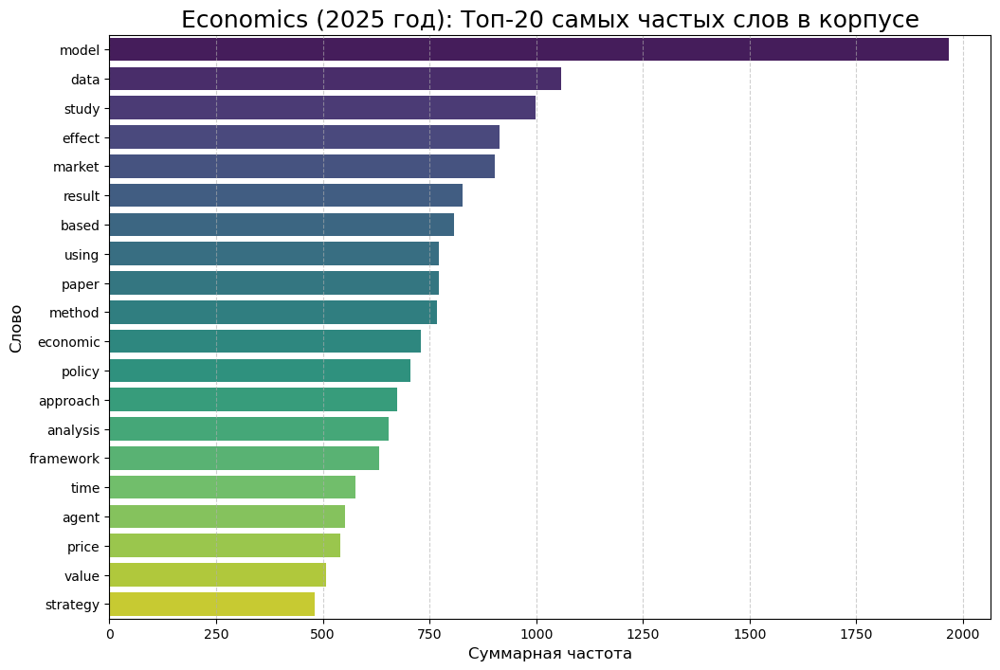

In [13]:
count_vectorizer_2025_econ, count_matrix_2025_econ = create_count_matrix(arxiv_2025_econ, title = "Economics (2025 год)")

Получившаяся матрица:    (0, 8339)	1
  (0, 8434)	1
  (0, 6109)	1
  (0, 9032)	3
  (0, 3478)	1
  (0, 9476)	1
  (0, 8259)	1
  (0, 4984)	1
  (0, 9624)	5
  (0, 2641)	1
  (0, 958)	1
  (0, 3594)	1
  (0, 7825)	1
  (0, 4628)	1
  (0, 3114)	3
  (0, 9121)	4
  (0, 6306)	1
  (0, 728)	1
  (0, 2313)	3
  (0, 2903)	1
  (0, 7150)	1
  (0, 1608)	1
  (0, 6348)	4
  (0, 751)	4
  (0, 1795)	2
  :	:
  (14256, 3103)	1
  (14256, 3424)	2
  (14256, 737)	1
  (14256, 6575)	1
  (14256, 2322)	1
  (14256, 9162)	1
  (14256, 1170)	1
  (14256, 9163)	1
  (14256, 4536)	1
  (14256, 9475)	1
  (14256, 12)	1
  (14256, 8568)	1
  (14256, 5227)	1
  (14256, 2592)	1
  (14256, 7063)	1
  (14256, 116)	1
  (14256, 5081)	1
  (14256, 9035)	1
  (14256, 6708)	1
  (14256, 4039)	1
  (14256, 6709)	1
  (14256, 6917)	1
  (14256, 3407)	1
  (14256, 6787)	1
  (14256, 2439)	3
Размер матрицы (shape): (14257, 9816)
Количество ненулевых элементов (nnz): 1164574
Плотность матрицы: 0.832155%


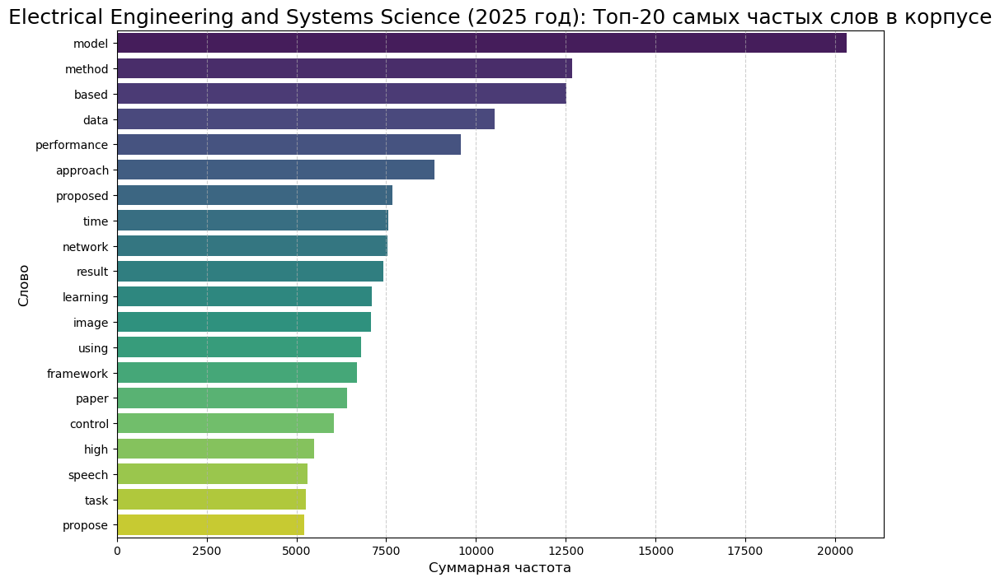

In [14]:
count_vectorizer_2025_eess, count_matrix_2025_eess = create_count_matrix(arxiv_2025_eess, title = "Electrical Engineering and Systems Science (2025 год)")

Получившаяся матрица:    (0, 10904)	1
  (0, 11111)	1
  (0, 2286)	2
  (0, 13050)	3
  (0, 14757)	2
  (0, 12018)	2
  (0, 362)	4
  (0, 9523)	1
  (0, 1081)	1
  (0, 11118)	4
  (0, 11580)	1
  (0, 7078)	1
  (0, 15271)	1
  (0, 11720)	1
  (0, 2123)	1
  (0, 11701)	1
  (0, 15177)	1
  (0, 9231)	1
  (0, 1890)	1
  (0, 3674)	1
  (0, 6691)	1
  (0, 6841)	1
  (0, 13572)	1
  (0, 11456)	1
  (0, 14924)	1
  :	:
  (47471, 3452)	1
  (47471, 5468)	2
  (47471, 7440)	4
  (47471, 10892)	2
  (47471, 12797)	1
  (47471, 5653)	4
  (47471, 8076)	2
  (47471, 5478)	1
  (47471, 14918)	2
  (47471, 13776)	3
  (47471, 4668)	1
  (47471, 5617)	1
  (47471, 214)	2
  (47471, 9489)	1
  (47471, 2054)	1
  (47471, 2744)	1
  (47471, 2055)	1
  (47471, 6875)	1
  (47471, 4975)	1
  (47471, 2734)	1
  (47471, 12527)	1
  (47471, 2867)	1
  (47471, 1524)	1
  (47471, 1677)	1
  (47471, 6341)	1
Размер матрицы (shape): (47472, 15594)
Количество ненулевых элементов (nnz): 2382162
Плотность матрицы: 0.321793%


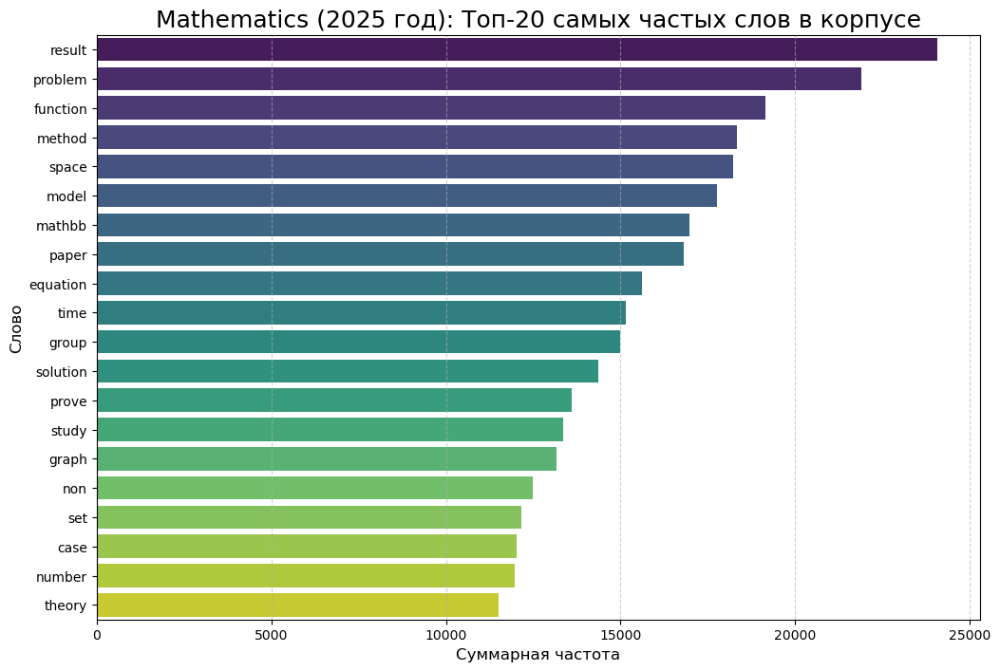

In [15]:
count_vectorizer_2025_math, count_matrix_2025_math = create_count_matrix(arxiv_2025_math, title = "Mathematics (2025 год)")

Получившаяся матрица:    (0, 16652)	2
  (0, 11642)	1
  (0, 10174)	3
  (0, 17020)	1
  (0, 21595)	4
  (0, 4534)	2
  (0, 18173)	5
  (0, 1805)	2
  (0, 5143)	8
  (0, 207)	4
  (0, 5627)	1
  (0, 9806)	1
  (0, 19794)	1
  (0, 17512)	1
  (0, 3217)	1
  (0, 20264)	3
  (0, 5122)	6
  (0, 4299)	1
  (0, 8719)	3
  (0, 9839)	1
  (0, 7439)	1
  (0, 7042)	1
  (0, 7575)	2
  (0, 4435)	1
  (0, 15057)	1
  :	:
  (94474, 5611)	2
  (94474, 15255)	1
  (94474, 11477)	1
  (94474, 4678)	3
  (94474, 24120)	1
  (94474, 2602)	2
  (94474, 5296)	3
  (94474, 12485)	1
  (94474, 20745)	1
  (94474, 785)	1
  (94474, 3795)	1
  (94474, 21849)	1
  (94474, 13713)	1
  (94474, 3461)	1
  (94474, 9152)	1
  (94474, 5439)	1
  (94474, 5690)	1
  (94474, 18865)	1
  (94474, 16808)	1
  (94474, 206)	1
  (94474, 3960)	1
  (94474, 6553)	1
  (94474, 13678)	1
  (94474, 1708)	5
  (94474, 18492)	1
Размер матрицы (shape): (94475, 26106)
Количество ненулевых элементов (nnz): 7006940
Плотность матрицы: 0.284100%


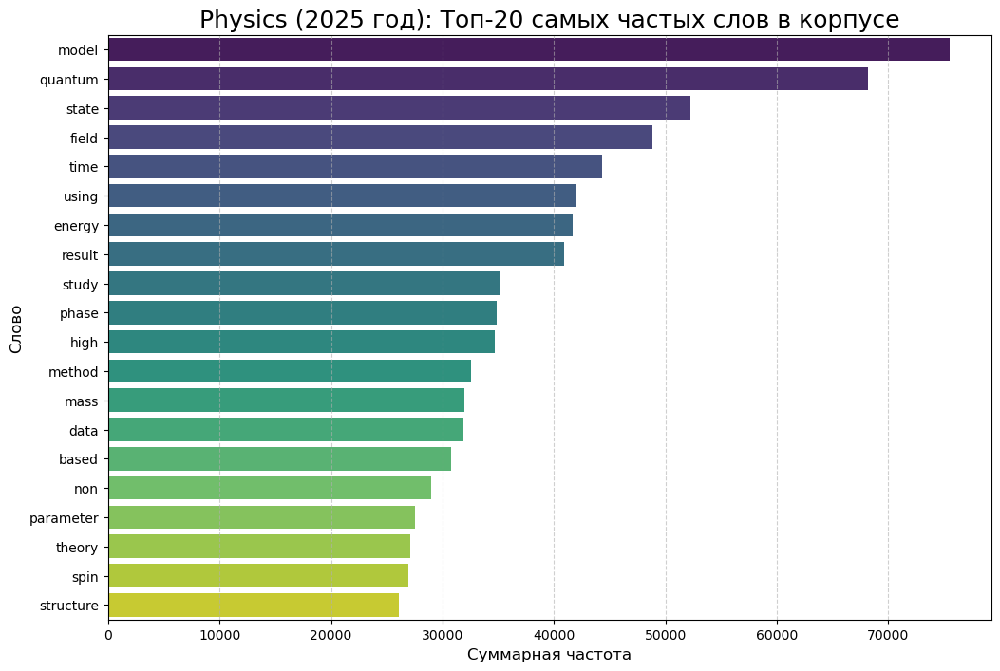

In [16]:
count_vectorizer_2025_ph, count_matrix_2025_ph = create_count_matrix(arxiv_2025_ph, title = "Physics (2025 год)")

Получившаяся матрица:    (0, 2494)	2
  (0, 5453)	1
  (0, 5686)	3
  (0, 3073)	2
  (0, 4933)	8
  (0, 4595)	3
  (0, 2436)	1
  (0, 4036)	1
  (0, 5064)	2
  (0, 5385)	3
  (0, 5687)	4
  (0, 4596)	4
  (0, 4270)	1
  (0, 5738)	1
  (0, 3049)	3
  (0, 199)	1
  (0, 2119)	1
  (0, 3057)	1
  (0, 1537)	2
  (0, 5308)	1
  (0, 1078)	1
  (0, 4817)	1
  (0, 1875)	1
  (0, 4641)	1
  (0, 3000)	1
  :	:
  (3485, 4827)	1
  (3485, 2409)	3
  (3485, 3618)	1
  (3485, 4326)	1
  (3485, 5223)	1
  (3485, 5442)	1
  (3485, 820)	1
  (3485, 3376)	2
  (3485, 4374)	5
  (3485, 2671)	1
  (3485, 3064)	1
  (3485, 1714)	1
  (3485, 5526)	1
  (3485, 4863)	1
  (3485, 4117)	1
  (3485, 1087)	2
  (3485, 5104)	1
  (3485, 297)	1
  (3485, 1995)	1
  (3485, 4106)	1
  (3485, 4356)	1
  (3485, 2386)	1
  (3485, 273)	1
  (3485, 3121)	1
  (3485, 3715)	1
Размер матрицы (shape): (3486, 5761)
Количество ненулевых элементов (nnz): 284075
Плотность матрицы: 1.414516%


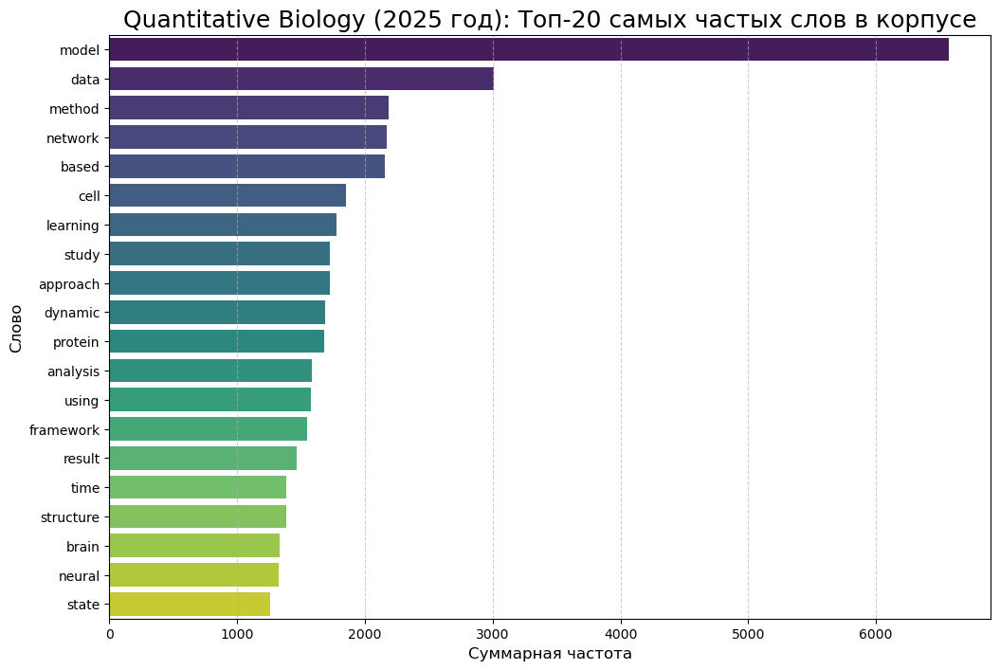

In [17]:
count_vectorizer_2025_qbio, count_matrix_2025_qbio = create_count_matrix(arxiv_2025_qbio, title = "Quantitative Biology (2025 год)")

Получившаяся матрица:    (0, 882)	4
  (0, 2077)	8
  (0, 1976)	1
  (0, 1052)	1
  (0, 3428)	1
  (0, 1800)	1
  (0, 653)	1
  (0, 3802)	1
  (0, 264)	3
  (0, 2494)	1
  (0, 2006)	1
  (0, 3989)	1
  (0, 904)	6
  (0, 3986)	1
  (0, 2409)	1
  (0, 3204)	1
  (0, 674)	2
  (0, 3066)	1
  (0, 942)	1
  (0, 2168)	1
  (0, 220)	1
  (0, 216)	1
  (0, 69)	1
  (0, 535)	2
  (0, 406)	1
  :	:
  (2106, 3192)	1
  (2106, 3465)	1
  (2106, 251)	1
  (2106, 1147)	1
  (2106, 1851)	1
  (2106, 2422)	1
  (2106, 1228)	1
  (2106, 2867)	2
  (2106, 2258)	1
  (2106, 1781)	1
  (2106, 1261)	1
  (2106, 3160)	1
  (2106, 846)	1
  (2106, 995)	1
  (2106, 2587)	1
  (2106, 1302)	1
  (2106, 2874)	1
  (2106, 1229)	4
  (2106, 3220)	4
  (2106, 2599)	1
  (2106, 3859)	1
  (2106, 234)	2
  (2106, 2062)	1
  (2106, 1674)	1
  (2106, 3085)	1
Размер матрицы (shape): (2107, 4103)
Количество ненулевых элементов (nnz): 146639
Плотность матрицы: 1.696225%


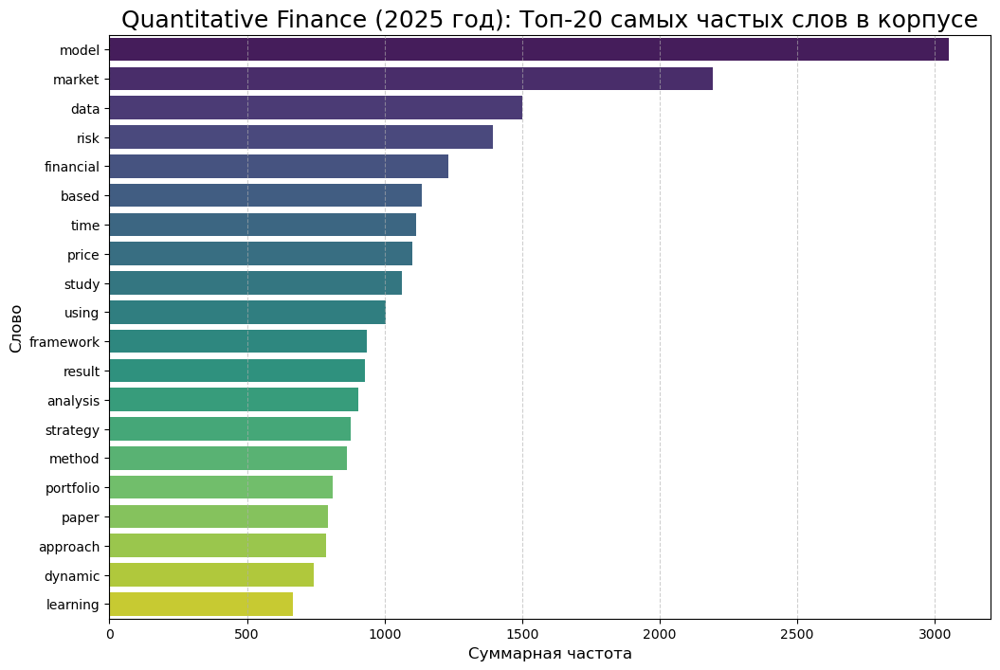

In [18]:
count_vectorizer_2025_qfin, count_matrix_2025_qfin = create_count_matrix(arxiv_2025_qfin, title = "Quantitative Finance (2025 год)")

Получившаяся матрица:    (0, 2093)	2
  (0, 1244)	2
  (0, 2957)	1
  (0, 5514)	1
  (0, 6779)	1
  (0, 1698)	1
  (0, 310)	1
  (0, 4829)	2
  (0, 380)	1
  (0, 7666)	2
  (0, 6311)	1
  (0, 2381)	1
  (0, 2780)	1
  (0, 4418)	2
  (0, 2579)	1
  (0, 3946)	3
  (0, 6789)	4
  (0, 2971)	1
  (0, 6500)	1
  (0, 5352)	1
  (0, 5798)	1
  (0, 7208)	1
  (0, 5077)	1
  (0, 5453)	2
  (0, 4809)	1
  :	:
  (10841, 7110)	1
  (10841, 4864)	1
  (10841, 2470)	1
  (10841, 7659)	1
  (10841, 7232)	1
  (10841, 2788)	2
  (10841, 122)	1
  (10841, 63)	1
  (10841, 7144)	1
  (10841, 1908)	2
  (10841, 2868)	1
  (10841, 2865)	1
  (10841, 5934)	1
  (10841, 6776)	1
  (10841, 4970)	1
  (10841, 598)	1
  (10841, 5110)	1
  (10841, 5272)	4
  (10841, 6028)	1
  (10841, 583)	1
  (10841, 5462)	1
  (10841, 2543)	1
  (10841, 4794)	1
  (10841, 6377)	1
  (10841, 564)	1
Размер матрицы (shape): (10842, 7898)
Количество ненулевых элементов (nnz): 817350
Плотность матрицы: 0.954512%


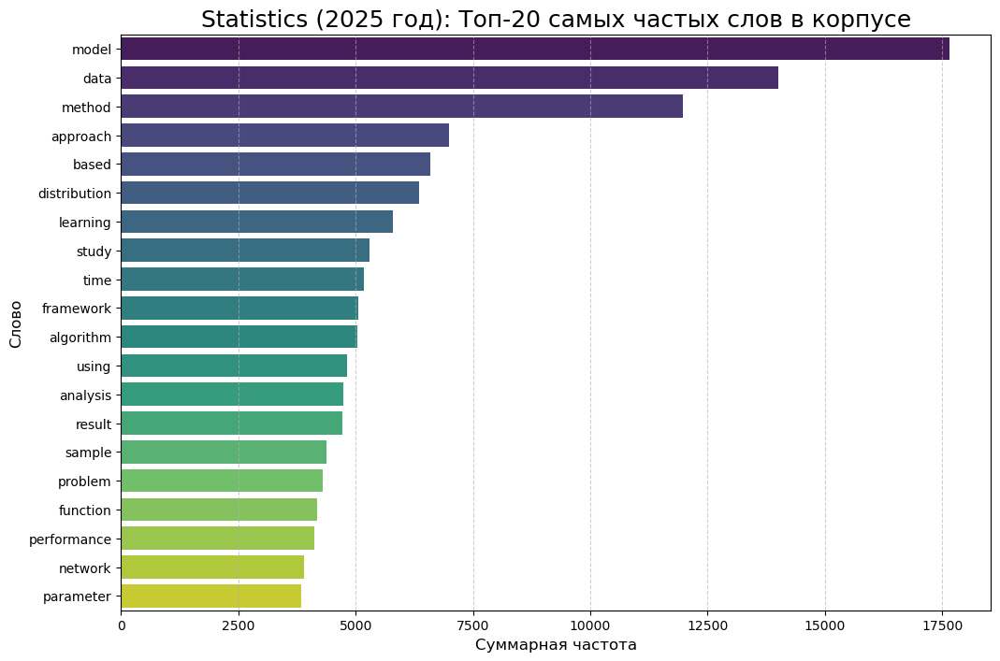

In [19]:
count_vectorizer_2025_stat, count_matrix_2025_stat = create_count_matrix(arxiv_2025_stat, title = "Statistics (2025 год)")

In [21]:
def evaluate_lda_coherence(df, count_vectorizer, count_matrix, model_name='lda_model.pkl', title = None):

    texts = [doc.split() for doc in df['processed_abstract']]
    dictionary = Dictionary(texts)
    dictionary.filter_extremes(no_below=5, no_above=0.95)

    coherence_scores = []
    topic_range = range(5, 31, 5)
    
    best_coherence_score = -1
    best_lda_model = None
    best_num_topics = 0
    # best_feature_names = None

    for num_topics in tqdm(topic_range, desc="Calculating Coherence for LDA"):
        lda_model = LatentDirichletAllocation(
            n_components=num_topics,
            random_state=RANDOM_STATE,
            learning_method='online',
            n_jobs=3
        )
        lda_model.fit(count_matrix)

        topics = []
        feature_names = count_vectorizer.get_feature_names_out()
        for _, topic in enumerate(lda_model.components_):
            top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]]
            topics.append(top_words)

        cm = CoherenceModel(topics=topics, texts=texts, dictionary=dictionary, coherence='c_v')
        current_coherence = cm.get_coherence()
        coherence_scores.append(current_coherence)

        if current_coherence > best_coherence_score:
            best_coherence_score = current_coherence
            best_lda_model = lda_model
            # best_feature_names = feature_names
            best_num_topics = num_topics

    plt.figure(figsize=(10, 6))
    plt.plot(topic_range, coherence_scores, marker='o', linestyle='--', color='red')
    plt.title(f'{title}: Зависимость когерентности LDA от количества тем (C_v)')
    plt.xlabel('Количество тем')
    plt.ylabel('Coherence Score')
    plt.xticks(topic_range)
    plt.grid(True)
    plt.show()


    os.makedirs("models", exist_ok=True)
    file_path = os.path.join("models", model_name)

    with open(file_path, 'wb') as f:
        pickle.dump( best_lda_model, f)

    print(f"Оптимальное число тем: {best_num_topics}")
    print(f"Лучший coherence score: {best_coherence_score:.4f}")
    
    return best_lda_model, best_num_topics, best_coherence_score

In [ ]:
# """
# Все статьи за 2023-2024 год (можно было бы уменьшить выборку)
# """
# lda_current, lda_topics_current, lda_coherence_score_current = evaluate_lda_coherence(arxiv_current,
#                                                                  count_vectorizer_current, 
#                                                                  count_matrix_current,
#                                                                  model_name = "lda_current.pkl",
#                                                                  title = "Все статьи за 2023-2024 год")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
# lda_2025, lda_topics_2025, lda_coherence_score_2025 = evaluate_lda_coherence(arxiv_2025,
#                                                                  count_vectorizer_2025, 
#                                                                  count_matrix_2025,
#                                                                  model_name = "lda_2025.pkl",
#                                                                  title = "Все статьи за 2025 год")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

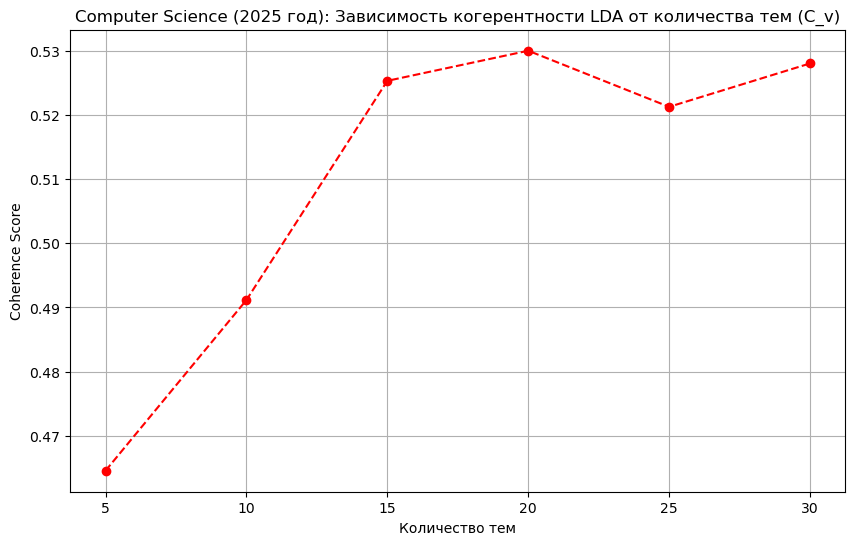

Оптимальное число тем: 20
Лучший coherence score: 0.5300


In [22]:
lda_2025_cs, lda_topics_2025_cs, lda_coherence_score_2025_cs = evaluate_lda_coherence(arxiv_2025_cs,
                                                                 count_vectorizer_2025_cs, 
                                                                 count_matrix_2025_cs,
                                                                 model_name = "lda_2025_cs.pkl",
                                                                 title = "Computer Science (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

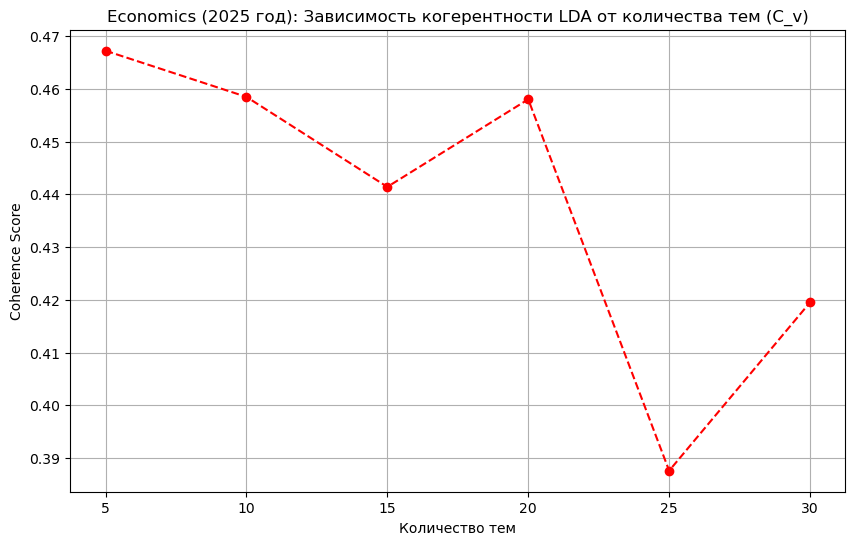

Оптимальное число тем: 5
Лучший coherence score: 0.4672


In [23]:
lda_2025_econ, lda_topics_2025_econ, lda_coherence_score_2025_econ = evaluate_lda_coherence(arxiv_2025_econ,
                                                                 count_vectorizer_2025_econ, 
                                                                 count_matrix_2025_econ,
                                                                 model_name = "lda_2025_econ.pkl",
                                                                 title = "Economics (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

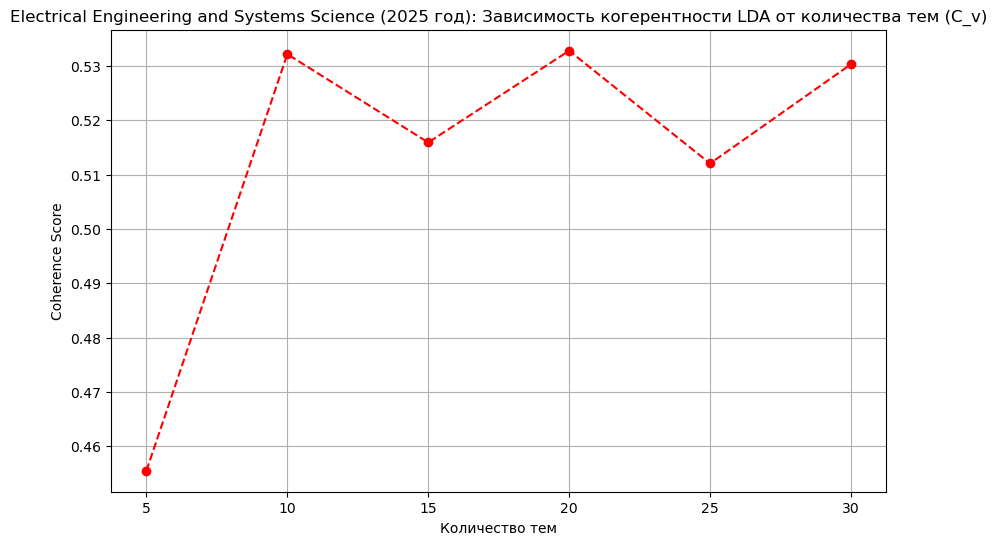

Оптимальное число тем: 20
Лучший coherence score: 0.5328


In [24]:
lda_2025_eess, lda_topics_2025_eess, lda_coherence_score_2025_eess = evaluate_lda_coherence(arxiv_2025_eess,
                                            count_vectorizer_2025_eess, 
                                            count_matrix_2025_eess,
                                            model_name = "lda_2025_eess.pkl",
                                            title = "Electrical Engineering and Systems Science (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

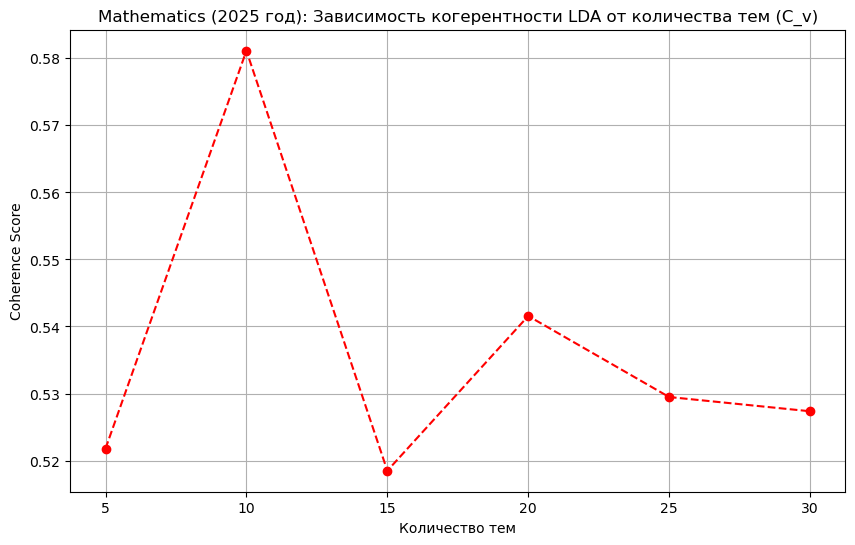

Оптимальное число тем: 10
Лучший coherence score: 0.5811


In [25]:
lda_2025_math, lda_topics_2025_math, lda_coherence_score_2025_math = evaluate_lda_coherence(arxiv_2025_math,
                                                                 count_vectorizer_2025_math, 
                                                                 count_matrix_2025_math,
                                                                 model_name = "lda_2025_math.pkl",
                                                                 title = "Mathematics (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

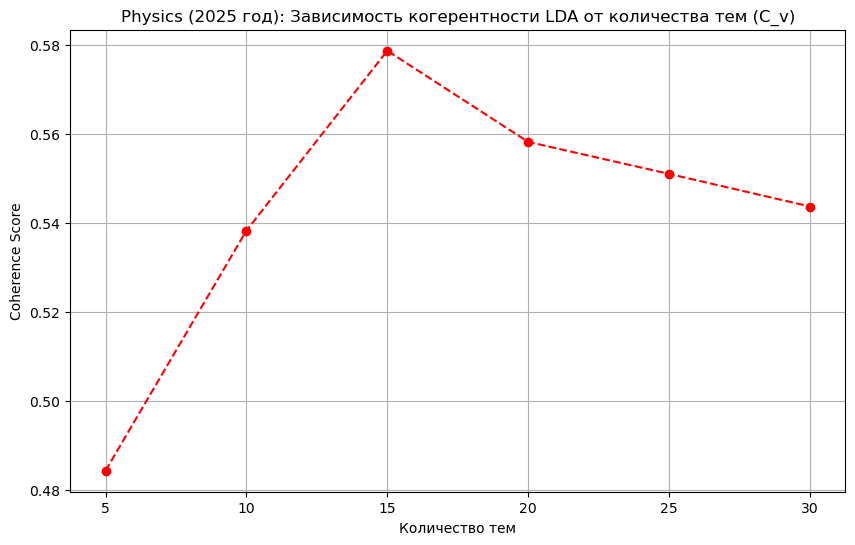

Оптимальное число тем: 15
Лучший coherence score: 0.5788


In [26]:
lda_2025_ph, lda_topics_2025_ph, lda_coherence_score_2025_ph = evaluate_lda_coherence(arxiv_2025_ph,
                                                                 count_vectorizer_2025_ph, 
                                                                 count_matrix_2025_ph,
                                                                 model_name = "lda_2025_ph.pkl",
                                                                 title = "Physics (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

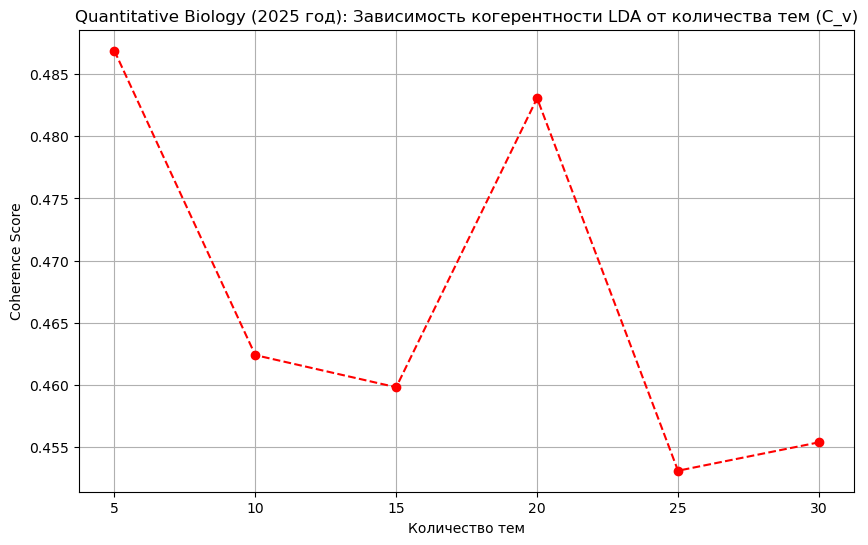

Оптимальное число тем: 5
Лучший coherence score: 0.4869


In [27]:
lda_2025_qbio, lda_topics_2025_qbio, lda_coherence_score_2025_qbio = evaluate_lda_coherence(arxiv_2025_qbio,
                                                                 count_vectorizer_2025_qbio, 
                                                                 count_matrix_2025_qbio,
                                                                 model_name = "lda_2025_qbio.pkl",
                                                                 title = "Quantitative Biology (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

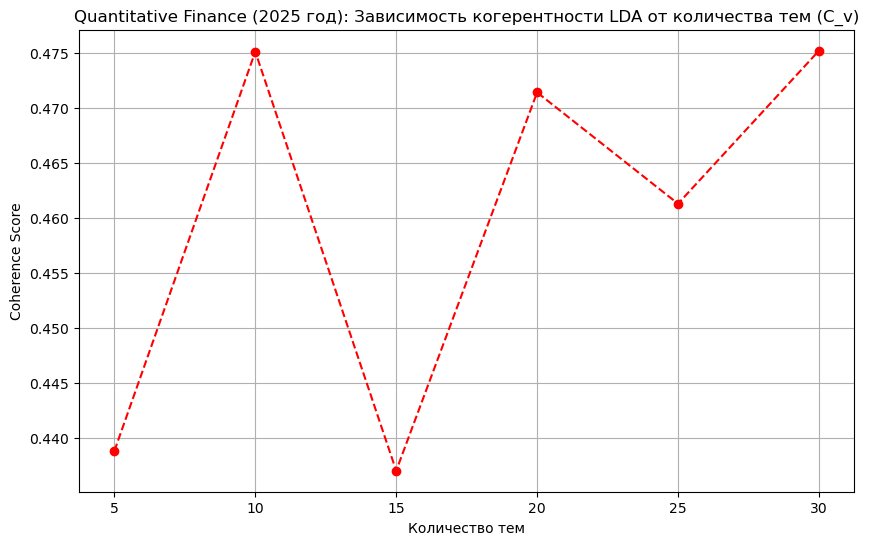

Оптимальное число тем: 30
Лучший coherence score: 0.4752


In [28]:
lda_2025_qfin, lda_topics_2025_qfin, lda_coherence_score_2025_qfin = evaluate_lda_coherence(arxiv_2025_qfin,
                                                                 count_vectorizer_2025_qfin, 
                                                                 count_matrix_2025_qfin,
                                                                 model_name = "lda_2025_qfin.pkl",
                                                                 title = "Quantitative Finance (2025 год)")

Calculating Coherence for LDA:   0%|          | 0/6 [00:00<?, ?it/s]

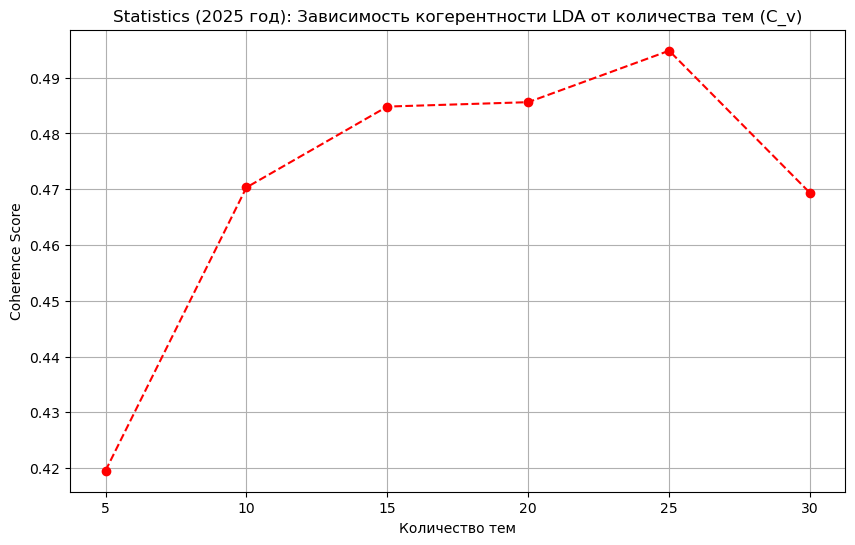

Оптимальное число тем: 25
Лучший coherence score: 0.4948


In [29]:
lda_2025_stat, lda_topics_2025_stat, lda_coherence_score_2025_stat = evaluate_lda_coherence(arxiv_2025_stat,
                                                                 count_vectorizer_2025_stat, 
                                                                 count_matrix_2025_stat,
                                                                 model_name = "lda_2025_stat.pkl",
                                                                 title = "Statistics (2025 год)")

-------

# Сводная таблица

In [ ]:
df_summary = pd.DataFrame({
        ('NMF', 'best_num_topic'): [num_topics_current, 
                               num_topics_2025, 
                               num_topics_2025_cs, 
                               num_topics_2025_econ, 
                               num_topics_2025_eess,
                               num_topics_2025_math, 
                               num_topics_2025_ph,
                               num_topics_2025_qbio,
                               num_topics_2025_qfin,
                               num_topics_2025_stat],
        ('NMF', 'best c_v score'): [coherence_score_current, 
                               coherence_score_2025, 
                               coherence_score_cs,
                               coherence_score_econ, 
                               coherence_score_eess,
                               coherence_score_math,
                               coherence_score_ph,
                               coherence_score_qbio,
                               coherence_score_qfin,
                               coherence_score_stat]
    }, index=['2023-2024 года', 
          '2025 год', 
          'Computer Science (2025 год)', 
          'Economics (2025 год)', 
          'Electrical Engineering and Systems Science (2025 год)',
          'Mathematics (2025 год)', 
          'Physics (2025 год)',
          'Quantitative Biology (2025 год)',
          'Quantitative Finance (2025 год)',
          'Statistics (2025 год)'])
df_summary

NMF  \
                                                   best_num_topic   
2023-2024 года                                                 25   
2025 год                                                       30   
Computer Science (2025 год)                                    30   
Economics (2025 год)                                           15   
Electrical Engineering and Systems Science (202...             15   
Mathematics (2025 год)                                         15   
Physics (2025 год)                                             25   
Quantitative Biology (2025 год)                                25   
Quantitative Finance (2025 год)                                15   
Statistics (2025 год)                                          30   

                                                                   
                                                   best c_v score  
2023-2024 года                                           0.690038  
2025 год                                                 0.690803  
Computer Science (2025 год)                              0.654789  
Economics (2025 год)                                     0.626549  
Electrical Engineering and Systems Science (202...       0.692547  
Mathematics (2025 год)                                   0.650692  
Physics (2025 год)                                       0.678080  
Quantitative Biology (2025 год)                          0.644176  
Quantitative Finance (2025 год)                          0.633491  
Statistics (2025 год)                                    0.614974

In [31]:
df_summary_lda = pd.DataFrame({
        ('LDA', 'best_num_topic'): [lda_topics_2025_cs, 
                               lda_topics_2025_econ, 
                               lda_topics_2025_eess,
                               lda_topics_2025_math, 
                               lda_topics_2025_ph,
                               lda_topics_2025_qbio,
                               lda_topics_2025_qfin,
                               lda_topics_2025_stat],
        ('LDA', 'best c_v score'): [lda_coherence_score_2025_cs,
                               lda_coherence_score_2025_econ, 
                               lda_coherence_score_2025_eess,
                               lda_coherence_score_2025_math,
                               lda_coherence_score_2025_ph,
                               lda_coherence_score_2025_qbio,
                               lda_coherence_score_2025_qfin,
                               lda_coherence_score_2025_stat]
    }, index=['Computer Science (2025 год)', 
          'Economics (2025 год)', 
          'Electrical Engineering and Systems Science (2025 год)',
          'Mathematics (2025 год)', 
          'Physics (2025 год)',
          'Quantitative Biology (2025 год)',
          'Quantitative Finance (2025 год)',
          'Statistics (2025 год)'])
df_summary_lda

LDA  \
                                                   best_num_topic   
Computer Science (2025 год)                                    20   
Economics (2025 год)                                            5   
Electrical Engineering and Systems Science (202...             20   
Mathematics (2025 год)                                         10   
Physics (2025 год)                                             15   
Quantitative Biology (2025 год)                                 5   
Quantitative Finance (2025 год)                                30   
Statistics (2025 год)                                          25   

                                                                   
                                                   best c_v score  
Computer Science (2025 год)                              0.530000  
Economics (2025 год)                                     0.467216  
Electrical Engineering and Systems Science (202...       0.532769  
Mathematics (2025 год)                                   0.581134  
Physics (2025 год)                                       0.578766  
Quantitative Biology (2025 год)                          0.486861  
Quantitative Finance (2025 год)                          0.475162  
Statistics (2025 год)                                    0.494841

In [114]:
%who

BeautifulSoup	 CSV_FILE_PATH	 CoherenceModel	 CountVectorizer	 Dictionary	 LatentDirichletAllocation	 NMF	 ORIGINAL_FILE_PATH_JSON	 RANDOM_STATE	 
TfidfVectorizer	 WordCloud	 WordNetLemmatizer	 arxiv	 arxiv_2025	 arxiv_2025_cs	 arxiv_2025_econ	 arxiv_2025_eess	 arxiv_2025_math	 
arxiv_2025_ph	 arxiv_2025_qbio	 arxiv_2025_qfin	 arxiv_2025_stat	 arxiv_current	 check_nan	 coherence_score_2025	 coherence_score_cs	 coherence_score_current	 
coherence_score_econ	 coherence_score_eess	 coherence_score_math	 coherence_score_ph	 coherence_score_qbio	 coherence_score_qfin	 coherence_score_stat	 count_matrix_2025	 count_matrix_2025_cs	 
count_matrix_2025_econ	 count_matrix_2025_eess	 count_matrix_2025_math	 count_matrix_2025_ph	 count_matrix_2025_qbio	 count_matrix_2025_qfin	 count_matrix_2025_stat	 count_matrix_current	 count_vectorizer_2025	 
count_vectorizer_2025_cs	 count_vectorizer_2025_econ	 count_vectorizer_2025_eess	 count_vectorizer_2025_math	 count_vectorizer_2025_ph	 count_vectorizer_2

--------------------------------

# Выводы

1. Исходный файл в формате json весил 4.50 GB. Те же самые данные в формате csv стали занимать 4.04 GB. Таким образом, при переводе файла из формате json в csv, размер данных сократился на 0.46 GB ( или на 10.15% ) вместе с удалением дубликатов (10 дубликатов).
2. В исходном наборе данных было 10 явных дубликатов. Они были удалены.
3. После удаления явных дубликатов (абсолютно одинаковые строки) осталось `2 818 554` данных.
4. Для анализа данных были взяты следующие колонки: 

    `id` - ArXiv ID (можно использовать для доступа к статье)

    `title` - Название статьи

    `categories` - Категории/теги в системе ArXiv

    `abstract` -  Аннотация статьи

    `versions` - История версий (можно извлечь дату выпуска журнала). Похожая колонка `update_date` несет в себе дату обновления, это могут быть незначительные изменения, которые не влияют на суть статьи\журнала. Поэтому `update_date` не учитываем

5. Временой промежуток

> Самая ранняя дата:  1986-04-25 15:39:49+00:00

> Самая поздняя дата:  2025-08-28 17:59:59+00:00

> Данные представлены за 39 лет, 4 месяцев и 3 дней

6. Относительный прирост статей в 2024 году по сравнении с 2023 составил 16.47% ( или 34466 статей).
7. Наблюдается экспоненциальный рост количества статей по годам 

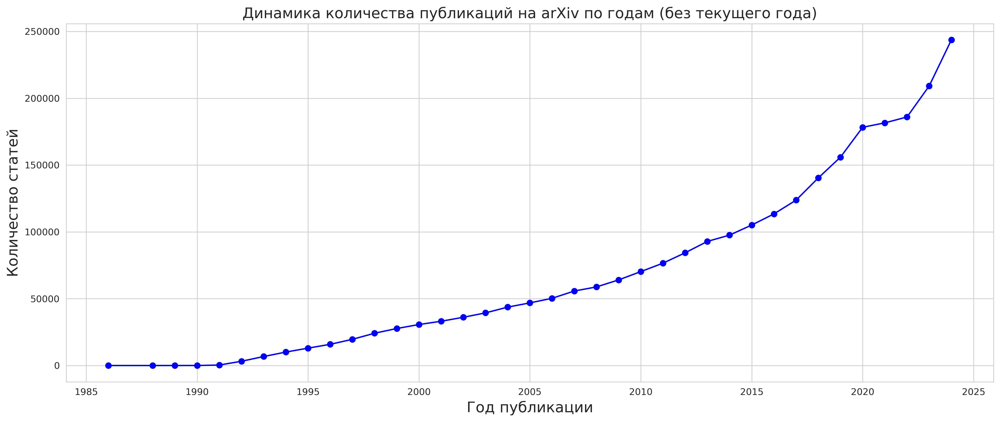

8. В 2009 году arxiv  перешел на другую классификацию статей.
9. При изучении сезонности было обнаружено, что в 2024 году ученые массово загружали свои работы на arXiv в октябре. И меньше всего в августе.Это согласуется с тем фактом, что большинство научных конференций также проводится в октябре-ноябре. Летом все погружаются в работу (и не забывают уезжать в отпуск), а в сентябре все оформляют свои результаты в статью.
10. Набор данных из-за признака categories, который мог нести в себе несколько категорий, был расширен до отдельных уникальных категорий.
11. Была выгружена дополнительная вспомогательная информация с оф. сайта `https://arxiv.org/category_taxonomy`. Этот сайт помог восстановить небольшой процент пропусков в исходных данных.
12. Суммарно больше всего статей имеет категория физика. Но в 2021 году физика и информатика сравнялись по популярности. А с 2022 года информатика обогнала физику по количеству выпускаемых статей. На данный момент информатика остается самой популярной наукой. 
13. Изучение данных по группам показало следующие тренды в направлениях:
    > Computer Science: 
                    > - Искусственный интеллект
                    > - Компьютерное зрение и распознавание образов
                    > - Вычисления и язык
                    > - Машинное обучение

    > Economics:
                 > - Эконометрика
                 > - Общая экономика
                 > - Теоретическая экономика

    > Electrical Engineering and Systems Science:
        >  (Стоит отметить, что это самое молодое направление в данных, датируется от 2009 года)
                > - Обработка звука и речи
                > - Обработка изображений и видео
                > - Обработка сигналов
                > - Системы и управление

    > Mathematics:
                > - Анализ PDE
                > - Комбинаторика
                > - Mathematical Physics
                > - Optimization and Control
                > - Probability
                > - Number Theory
                > - Numerical Analysis

    > Physics: 
                > - Квантовая физика
                > - Астрофизика
                > - Конденсированные вещества

    > Quantitative Biology:
                > - Нейроны и познание
                > - Квантовые методы
                > - Эволюция

    > Quantitative Finance:
                > - Экономика

    > Statistics:
            > - Машинное обучение


14. Для тематического моделирования было решено проверить два популярных алгоритма. 
    * Латентное размещение Дирихле (LDA). Для LDA нужно использовать CountVectorizer.
    * Неотрицательная матричная факторизация (NMF). Для данного моделирования правильно использоваь TfidfVectorizer.

15. В силу ограничений по времени не были применены "поиск по сетке" или БО для нахождения оптимальных гиперпараметров, но был организован перебор основного гиперпаматера - число тем. Оценкой служило понятие когерентности. Чем ближе к 1, тем лучше модель смогла "разделить" слова по смысловой нагрузке на ключевые темы. Также можно было бы опробовать и другие алгоритмы.

16. Перед началом весь текст был приведен к нижнему регистру и разбит на слова. Были произведены лемматизация и удаление стоп-слов. Далее датасет был разделен на актуальные наборы данных: 2023-2024 года и 2025 год. И был произведен глубокий анализ трендов в 2025 году по категориям.

17. 
> NMF: Далее очищенные тексты аннотаций преобразовывались в числовое представление с помощью метода TF-IDF. Алгоритм TfidfVectorizer создает разреженную матрицу "документ-слово", где каждое слово взвешивается по его важности: вес увеличивается, если слово часто встречается в данном документе, но уменьшается, если оно часто встречается во всем корпусе. Для визуальной оценки качества векторизации выводился график с 20-ю словами, имеющими наибольший суммарный TF-IDF вес, что позволяет увидеть наиболее значимые термины в анализируемом наборе данных.

> LDA: осуществлялась векторизация текстовых данных с использованием метода "мешка слов", реализованного через CountVectorizer. Этот подход преобразует каждую аннотацию в числовой вектор, где значениями являются абсолютные частоты встречаемости слов из общего словаря. В результате создается разреженная матрица "документ-слово", которая служит основой для вероятностных моделей, таких как LDA. Для контроля и анализа выводилось 20 самых часто встречающихся слов в корпусе, что дает представление о наиболее распространенных (но не обязательно самых важных) терминах в исследуемых статьях.

18. Были обучены модели на разных наборах данных. С помощью когерентности было подобрано оптимальное количество тем. Далее темы сравнивались по популярности: по годам и месяцам (для 2025 года).

19. Результаты были представлены в сводные таблицы. Алгоритм NMF оказался более предпочтительным не только по оценке, но и по времени обучения. Можно было бы перебрать в GRIDCV все параметры и оттуда извлечь время обучения модели.

20. Для сохранения важности всех категорий, был произведен раздельный анализ в 2025 году. 

    > Анализ трендов суммарно за весь 2025 год по алгоритму NMF: 
        > - 1 место: функция, пространство, оператор, теория, матрица, многообразие, теорема
        > - 2 место: пользователь, исследование, инструмент, социальный анализ, разработка, проектирование, оценка
        > - 3 место: распределение, метод, оценка, неопределённость, выборка, ошибка, оценщик, выборка, вероятность, шум

    > Анализ трендов в Computer Science за 2025 год
        > - 1 место: проблема, алгоритм, функция, связь, метод, оптимизация, оптимальный, числовой, линейный, приближение

    > Анализ трендов в Economics за 2025 год:
        > - 1 место: экономический, политика, рост, доход, страна, влияние, экономика, ставка, домохозяйство, эффект

    > Анализ трендов в Electrical Engineering and Systems Science за 2025 год:
        > - 1 место: задача, алгоритм, оптимизация, оптимальный, ограничение, сходимость, метод, функция, агент, выпуклый
        > - 2 место: сигнал, частота, шум, оценка, метод, фильтр, измерение, время, фаза, ошибка

    > Анализ трендов в Mathematics за 2025 год:
        > - 1 место: model, data, network, learning, dynamic, framework, neural, based, approach, state
        > - 2 место: function, polynomial, number, field, set, formula, conjecture, integer, sum, prime

    > Анализ трендов в Physics за 2025 год:
        > - 1 место: model data network learning method neural machine approach based training

    > Анализ трендов в Quantitative Biology за 2025 год:
        > - 1 место: human visual cognitive memory information perception language processing stimulus sensory

    > Анализ трендов в Quantitative Finance за 2025 год:
        > - 1 место: economic policy effect income impact study growth country research social

    > Анализ трендов в Statistics за 2025 год:
        > - 1 место: data missing imputation missingness source analysis synthetic real functional study
        > - 2 место: learning task training machine representation generalization transfer domain deep transformer
        > - 3 место: network neural layer deep architecture node training weight activation structure

21. Анализ тематических трендов на данных 2025 года выявляет одну всеобъемлющую и доминирующую тенденцию: глубокую и повсеместную интеграцию машинного обучения и вычислительного моделирования в ядро всех научных дисциплин. Ключевым маркером этого сдвига является повсеместное присутствие слова model и связанных с ним терминов (learning, network, neural, data) в топах тем. Примечательно, что эта тема занимает первое место не только в очевидных областях, таких как Computer Science, но и в фундаментальных науках, включая Физику и Математику. Даже в таких областях, как экономика и биология, доминируют темы, связанные с анализом сложных систем и эффектов (economic policy effect, human cognitive perception), где методы машинного обучения являются основным инструментом для моделирования и прогнозирования. Таким образом, можно заключить, что в 2025 году машинное обучение стало универсальным языком и методологическим фундаментом для совершения открытий в самых разных научных областях.